# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

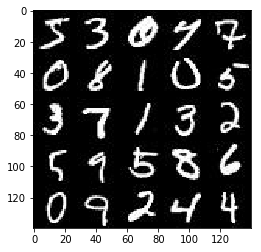

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

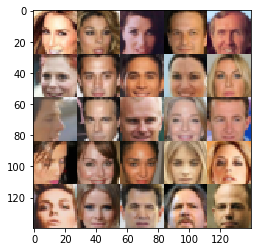

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.0.1
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    inputs_real = tf.placeholder(tf.float32, (None, image_height, image_width, image_channels), name='real_inputs')
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name='z_inputs')
    learn_rate = tf.placeholder(tf.float32, name='learn_rate')
        
    return inputs_real, inputs_z, learn_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variabes in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the generator, tensor logits of the generator).

In [6]:
def LeakyReLU(x, alpha=0.1):
    return tf.maximum(alpha * x, x)

#Yeah, I know that there are high level functions for this - but want to understand this stuff deeper :)
def fully_conneted_layer(inputs, output_len, name, stddev=0.1):
    W1 = tf.get_variable(name + "_weights", shape=[int(inputs.get_shape()[-1]), output_len], initializer=tf.truncated_normal_initializer(stddev=stddev))
    b1 = tf.get_variable(name + "_bias", shape=[output_len], initializer=tf.constant_initializer(value=0.0))
    return tf.matmul(inputs, W1) + b1

def conv2d_layer(inputs, shape, name, strides=[1, 1, 1, 1], padding='SAME', mu = 0, stddev = 0.1):
    conv_W = tf.get_variable(name + "_weights", shape=shape, initializer=tf.truncated_normal_initializer(stddev=stddev))
    conv_b = tf.get_variable(name + "_bias", shape=[shape[-1]], initializer=tf.constant_initializer(value=0.0))
    conv = tf.nn.conv2d(inputs, conv_W, strides=strides, padding=padding) + conv_b
    conv = tf.identity(conv, name=name + "_conv_layer")
    return conv


In [75]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param image: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    
    with tf.variable_scope('discriminator', reuse=reuse) as d_scope:
        
        #not sure why but reuse=reuse in the line above does not work as expected - getting "variable already defined"
        #error without line below
        if reuse:
            tf.get_variable_scope().reuse_variables()        
        
        input_channels = int(images.get_shape()[3])
        
        #conv Layer1
        conv1 = conv2d_layer(images, shape=[5, 5, input_channels, 128], name='layer1', strides=[1, 2, 2, 1], stddev = 0.02)
        conv1 = LeakyReLU(conv1, alpha=0.2)

        #conv Layer2
        conv2 = conv2d_layer(conv1, shape=[5, 5, 128, 256], name='layer2', strides=[1, 2, 2, 1], stddev = 0.02)
        conv2 = tf.contrib.layers.batch_norm(conv2, epsilon=1e-5, is_training=True)
        conv2 = LeakyReLU(conv2, alpha=0.2)

        #conv Layer3
        conv3 = conv2d_layer(conv2, shape=[5, 5, 256, 512], name='layer3', strides=[1, 2, 2, 1], stddev = 0.02)
        conv3 = tf.contrib.layers.batch_norm(conv3, epsilon=1e-5, is_training=True)
        conv3 = LeakyReLU(conv3, alpha=0.2)
        
        #conv Layer4
        #conv4 = conv2d_layer(conv3, shape=[5, 5, 512, 1024], name='layer4', strides=[1, 1, 1, 1], stddev = 0.02)
        #conv4 = tf.contrib.layers.batch_norm(conv4, epsilon=1e-5, is_training=True)
        #conv4 = LeakyReLU(conv4, alpha=0.2)

        flatten = tf.contrib.layers.flatten(conv3)

        #fully connected layer 1
        #fc1 = fully_conneted_layer(flatten, 1024, 'fc_1', stddev = 0.02)
        #fc1 = LeakyReLU(fc1, alpha=0.01)

        #logits
        logits = fully_conneted_layer(flatten, 1, 'fc_2', stddev = 0.02)
        out = tf.nn.sigmoid(logits)

        return out, logits
    
"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variabes in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [76]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    with tf.variable_scope('generator', reuse=not is_train):
        if not is_train:
            tf.get_variable_scope().reuse_variables()    

        fc1 = fully_conneted_layer(z, 7 * 7 * 512, 'layer1', stddev=0.02)
        fc1 = tf.reshape(fc1, [-1, 7, 7, 512])

        #conv Layer1
        conv1 = tf.layers.conv2d_transpose(fc1, 256, 5, name='layer2', strides=2, padding ='same', 
                                           kernel_initializer=tf.truncated_normal_initializer(stddev=0.02))
        conv1 = tf.contrib.layers.batch_norm(conv1, epsilon=1e-5, is_training = is_train)
        conv1 = tf.nn.relu(conv1)
        #conv1 = tf.image.resize_images(conv1, [7, 7])

        #conv Layer2
        conv2 = tf.layers.conv2d_transpose(conv1, 128, 5, name='layer3', strides=2, padding ='same', 
                                           kernel_initializer=tf.truncated_normal_initializer(stddev=0.02))
        conv2 = tf.contrib.layers.batch_norm(conv2, epsilon=1e-5, is_training = is_train)
        conv2 = tf.nn.relu(conv2)

        #conv3 = tf.layers.conv2d_transpose(conv2, 128, 5, name='layer4', strides=2, padding ='same', 
        #                                   kernel_initializer=tf.truncated_normal_initializer(stddev=0.02))
        #conv3 = tf.contrib.layers.batch_norm(conv3, epsilon=1e-5, is_training = is_train)
        #conv3 = tf.nn.relu(conv3)

        #conv Layer3
        logits = tf.layers.conv2d_transpose(conv2, out_channel_dim, 5, name='layer5', strides=1, padding ='same', 
                                           kernel_initializer=tf.truncated_normal_initializer(stddev=0.02))

        out =  tf.tanh(logits) * 0.5        

        return out
 
"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [77]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    g_model = generator(input_z, out_channel_dim)
    d_model_real, d_logits_real = discriminator(input_real)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))
    
    d_loss = d_loss_real + d_loss_fake
    
    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [78]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """

    # I think it is more solid way to get trainables than custom filtering with tf.trainable_variables 
    g_vars = tf.get_collection(tf.GraphKeys.TRAINABLE_VARIABLES, scope='generator')
    d_vars = tf.get_collection(tf.GraphKeys.TRAINABLE_VARIABLES, scope='discriminator')
    
    #just to pass unit tests:
    tf.trainable_variables()
    
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate=learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate=learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [79]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [80]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    samples, losses = [], []
    steps = 0
    print_every = 10
    show_every = 100
    channels = data_shape[3]
    image_width = data_shape[2]
    image_height = data_shape[1]
    decrease_every = 300
    
    input_real, input_z, learning_rate_tensor = model_inputs(image_width, image_height, channels, z_dim)
    d_loss, g_loss = model_loss(input_real, input_z, channels)
    d_train_opt, g_train_opt = model_opt(d_loss, g_loss, learning_rate_tensor, beta1)

    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                steps += 1
                
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                
                _ = sess.run(d_train_opt, feed_dict={input_real: batch_images, input_z: batch_z, learning_rate_tensor: learning_rate})
                _ = sess.run(g_train_opt, feed_dict={input_real: batch_images, input_z: batch_z, learning_rate_tensor: learning_rate})        
        
                if steps % print_every == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = d_loss.eval({input_z: batch_z, input_real: batch_images})
                    train_loss_g = g_loss.eval({input_z: batch_z})

                    print("Epoch {}/{}...".format(epoch_i + 1, epoch_count),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    losses.append((train_loss_d, train_loss_g))
                    
                if steps % show_every == 0:
                    show_generator_output(sess, 16, input_z, channels, data_image_mode)

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/3... Discriminator Loss: 4.1075... Generator Loss: 0.0215
Epoch 1/3... Discriminator Loss: 0.9372... Generator Loss: 1.2252
Epoch 1/3... Discriminator Loss: 1.6993... Generator Loss: 0.5560
Epoch 1/3... Discriminator Loss: 1.4198... Generator Loss: 2.4615
Epoch 1/3... Discriminator Loss: 2.1964... Generator Loss: 0.2460
Epoch 1/3... Discriminator Loss: 1.3052... Generator Loss: 1.8804
Epoch 1/3... Discriminator Loss: 1.2642... Generator Loss: 0.9950
Epoch 1/3... Discriminator Loss: 1.3506... Generator Loss: 0.5534
Epoch 1/3... Discriminator Loss: 1.0421... Generator Loss: 0.8922
Epoch 1/3... Discriminator Loss: 1.4084... Generator Loss: 0.4613


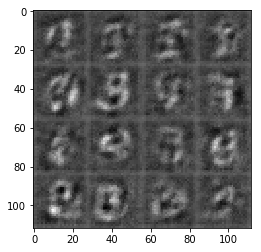

Epoch 1/3... Discriminator Loss: 2.0662... Generator Loss: 0.1881
Epoch 1/3... Discriminator Loss: 1.0029... Generator Loss: 1.7090
Epoch 1/3... Discriminator Loss: 0.8493... Generator Loss: 0.8292
Epoch 1/3... Discriminator Loss: 1.4713... Generator Loss: 2.8556
Epoch 1/3... Discriminator Loss: 0.8888... Generator Loss: 1.5543
Epoch 1/3... Discriminator Loss: 1.0627... Generator Loss: 0.6868
Epoch 1/3... Discriminator Loss: 1.0582... Generator Loss: 2.8092
Epoch 1/3... Discriminator Loss: 0.8143... Generator Loss: 1.1029
Epoch 1/3... Discriminator Loss: 0.9825... Generator Loss: 0.7295
Epoch 1/3... Discriminator Loss: 0.5431... Generator Loss: 2.1586


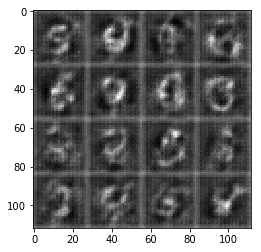

Epoch 1/3... Discriminator Loss: 0.6633... Generator Loss: 1.2004
Epoch 1/3... Discriminator Loss: 0.6601... Generator Loss: 1.4345
Epoch 1/3... Discriminator Loss: 1.1018... Generator Loss: 0.6417
Epoch 1/3... Discriminator Loss: 0.9257... Generator Loss: 0.7005
Epoch 1/3... Discriminator Loss: 0.5469... Generator Loss: 1.1699
Epoch 1/3... Discriminator Loss: 0.5591... Generator Loss: 1.3507
Epoch 1/3... Discriminator Loss: 0.8186... Generator Loss: 3.0880
Epoch 1/3... Discriminator Loss: 1.1069... Generator Loss: 0.5636
Epoch 1/3... Discriminator Loss: 1.7579... Generator Loss: 0.2787
Epoch 1/3... Discriminator Loss: 0.5393... Generator Loss: 1.4148


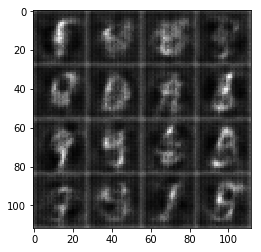

Epoch 1/3... Discriminator Loss: 0.5788... Generator Loss: 1.3639
Epoch 1/3... Discriminator Loss: 0.7570... Generator Loss: 1.0651
Epoch 1/3... Discriminator Loss: 0.6275... Generator Loss: 1.8082
Epoch 1/3... Discriminator Loss: 0.8734... Generator Loss: 0.8062
Epoch 1/3... Discriminator Loss: 0.6758... Generator Loss: 2.5176
Epoch 1/3... Discriminator Loss: 0.7013... Generator Loss: 1.8031
Epoch 1/3... Discriminator Loss: 1.0504... Generator Loss: 0.5958
Epoch 1/3... Discriminator Loss: 0.7970... Generator Loss: 0.9666
Epoch 1/3... Discriminator Loss: 0.8330... Generator Loss: 1.1318
Epoch 1/3... Discriminator Loss: 0.8255... Generator Loss: 1.0521


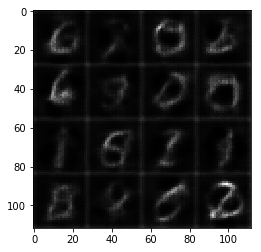

Epoch 1/3... Discriminator Loss: 1.5093... Generator Loss: 0.3252
Epoch 1/3... Discriminator Loss: 0.6176... Generator Loss: 1.3624
Epoch 1/3... Discriminator Loss: 0.8442... Generator Loss: 1.8786
Epoch 1/3... Discriminator Loss: 1.5027... Generator Loss: 0.3531
Epoch 1/3... Discriminator Loss: 0.5804... Generator Loss: 1.7061
Epoch 1/3... Discriminator Loss: 0.9012... Generator Loss: 1.1385
Epoch 1/3... Discriminator Loss: 0.8708... Generator Loss: 0.8703
Epoch 1/3... Discriminator Loss: 0.5202... Generator Loss: 2.1042
Epoch 1/3... Discriminator Loss: 1.0091... Generator Loss: 0.6884
Epoch 1/3... Discriminator Loss: 0.9073... Generator Loss: 0.6892


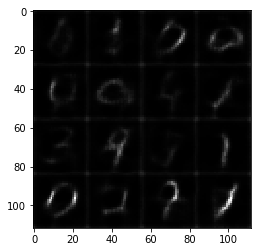

Epoch 1/3... Discriminator Loss: 1.0698... Generator Loss: 2.1054
Epoch 1/3... Discriminator Loss: 0.9797... Generator Loss: 0.6790
Epoch 1/3... Discriminator Loss: 0.7150... Generator Loss: 1.8818
Epoch 1/3... Discriminator Loss: 0.7253... Generator Loss: 1.2163
Epoch 1/3... Discriminator Loss: 1.2834... Generator Loss: 0.4410
Epoch 1/3... Discriminator Loss: 0.9496... Generator Loss: 0.7993
Epoch 1/3... Discriminator Loss: 1.4712... Generator Loss: 0.3630
Epoch 1/3... Discriminator Loss: 0.7072... Generator Loss: 1.0438
Epoch 1/3... Discriminator Loss: 0.8880... Generator Loss: 0.8006
Epoch 1/3... Discriminator Loss: 0.7033... Generator Loss: 1.1310


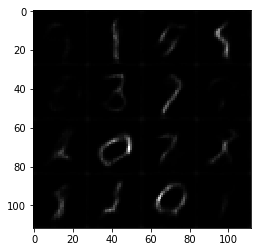

Epoch 1/3... Discriminator Loss: 0.7915... Generator Loss: 0.9133
Epoch 1/3... Discriminator Loss: 0.5742... Generator Loss: 2.1276
Epoch 1/3... Discriminator Loss: 0.9344... Generator Loss: 1.7596
Epoch 1/3... Discriminator Loss: 0.7100... Generator Loss: 1.3829
Epoch 1/3... Discriminator Loss: 1.1991... Generator Loss: 0.5171
Epoch 1/3... Discriminator Loss: 0.9638... Generator Loss: 0.6612
Epoch 1/3... Discriminator Loss: 0.7083... Generator Loss: 1.0888
Epoch 1/3... Discriminator Loss: 1.0496... Generator Loss: 0.9385
Epoch 1/3... Discriminator Loss: 0.6920... Generator Loss: 1.2420
Epoch 1/3... Discriminator Loss: 0.6995... Generator Loss: 1.2224


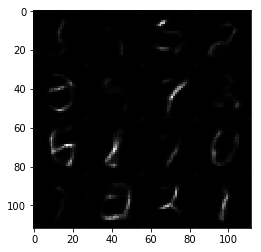

Epoch 1/3... Discriminator Loss: 0.8336... Generator Loss: 0.9866
Epoch 1/3... Discriminator Loss: 0.9984... Generator Loss: 0.7435
Epoch 1/3... Discriminator Loss: 0.6213... Generator Loss: 1.5621
Epoch 1/3... Discriminator Loss: 0.5476... Generator Loss: 1.3062
Epoch 1/3... Discriminator Loss: 0.5944... Generator Loss: 1.2304
Epoch 1/3... Discriminator Loss: 0.5414... Generator Loss: 1.3836
Epoch 1/3... Discriminator Loss: 0.9804... Generator Loss: 0.6147
Epoch 1/3... Discriminator Loss: 2.0912... Generator Loss: 0.3156
Epoch 1/3... Discriminator Loss: 1.0776... Generator Loss: 0.7333
Epoch 1/3... Discriminator Loss: 1.1345... Generator Loss: 0.5621


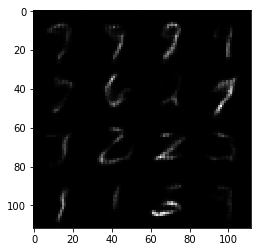

Epoch 1/3... Discriminator Loss: 0.6661... Generator Loss: 1.2860
Epoch 1/3... Discriminator Loss: 0.8166... Generator Loss: 1.2689
Epoch 1/3... Discriminator Loss: 0.6220... Generator Loss: 1.7422
Epoch 1/3... Discriminator Loss: 0.3966... Generator Loss: 1.6303
Epoch 1/3... Discriminator Loss: 0.4307... Generator Loss: 1.9403
Epoch 1/3... Discriminator Loss: 1.8625... Generator Loss: 0.3534
Epoch 1/3... Discriminator Loss: 0.8671... Generator Loss: 1.7476
Epoch 1/3... Discriminator Loss: 0.8014... Generator Loss: 1.0777
Epoch 1/3... Discriminator Loss: 0.8230... Generator Loss: 2.1762
Epoch 1/3... Discriminator Loss: 1.3617... Generator Loss: 0.5271


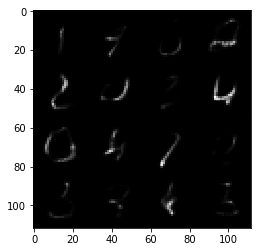

Epoch 1/3... Discriminator Loss: 1.6128... Generator Loss: 0.3184
Epoch 1/3... Discriminator Loss: 0.7028... Generator Loss: 1.7070
Epoch 1/3... Discriminator Loss: 0.7214... Generator Loss: 1.1344
Epoch 2/3... Discriminator Loss: 0.6357... Generator Loss: 1.3192
Epoch 2/3... Discriminator Loss: 0.7764... Generator Loss: 1.1365
Epoch 2/3... Discriminator Loss: 0.7003... Generator Loss: 1.0394
Epoch 2/3... Discriminator Loss: 0.7079... Generator Loss: 1.0767
Epoch 2/3... Discriminator Loss: 1.1480... Generator Loss: 0.5328
Epoch 2/3... Discriminator Loss: 0.7572... Generator Loss: 1.0554
Epoch 2/3... Discriminator Loss: 0.7502... Generator Loss: 1.0237


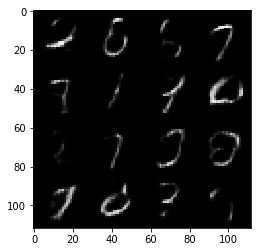

Epoch 2/3... Discriminator Loss: 0.7618... Generator Loss: 1.2584
Epoch 2/3... Discriminator Loss: 0.6193... Generator Loss: 1.7700
Epoch 2/3... Discriminator Loss: 0.6926... Generator Loss: 1.0145
Epoch 2/3... Discriminator Loss: 0.6923... Generator Loss: 1.0257
Epoch 2/3... Discriminator Loss: 0.6534... Generator Loss: 1.5673
Epoch 2/3... Discriminator Loss: 0.7986... Generator Loss: 1.7550
Epoch 2/3... Discriminator Loss: 0.6471... Generator Loss: 1.4285
Epoch 2/3... Discriminator Loss: 1.3272... Generator Loss: 0.4356
Epoch 2/3... Discriminator Loss: 1.0425... Generator Loss: 0.5673
Epoch 2/3... Discriminator Loss: 1.1943... Generator Loss: 0.5138


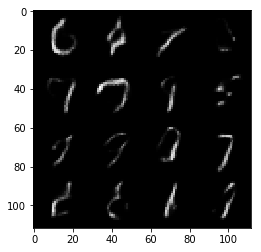

Epoch 2/3... Discriminator Loss: 0.6300... Generator Loss: 1.0760
Epoch 2/3... Discriminator Loss: 0.5926... Generator Loss: 1.1755
Epoch 2/3... Discriminator Loss: 0.6219... Generator Loss: 1.9823
Epoch 2/3... Discriminator Loss: 0.6499... Generator Loss: 1.8852
Epoch 2/3... Discriminator Loss: 1.8357... Generator Loss: 0.2292
Epoch 2/3... Discriminator Loss: 0.6067... Generator Loss: 1.2021
Epoch 2/3... Discriminator Loss: 1.0880... Generator Loss: 0.6993
Epoch 2/3... Discriminator Loss: 1.4863... Generator Loss: 0.3527
Epoch 2/3... Discriminator Loss: 0.9235... Generator Loss: 0.8572
Epoch 2/3... Discriminator Loss: 0.7635... Generator Loss: 1.0375


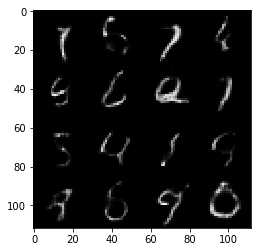

Epoch 2/3... Discriminator Loss: 0.8295... Generator Loss: 0.8110
Epoch 2/3... Discriminator Loss: 0.6206... Generator Loss: 1.6308
Epoch 2/3... Discriminator Loss: 1.0342... Generator Loss: 0.7808
Epoch 2/3... Discriminator Loss: 0.7293... Generator Loss: 1.0287
Epoch 2/3... Discriminator Loss: 0.5986... Generator Loss: 1.5356
Epoch 2/3... Discriminator Loss: 0.9200... Generator Loss: 2.5247
Epoch 2/3... Discriminator Loss: 1.0719... Generator Loss: 0.7881
Epoch 2/3... Discriminator Loss: 0.9443... Generator Loss: 0.9148
Epoch 2/3... Discriminator Loss: 0.5848... Generator Loss: 2.3477
Epoch 2/3... Discriminator Loss: 0.7038... Generator Loss: 2.6650


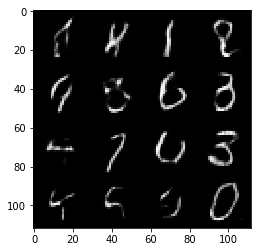

Epoch 2/3... Discriminator Loss: 0.5671... Generator Loss: 1.2514
Epoch 2/3... Discriminator Loss: 0.9010... Generator Loss: 1.4772
Epoch 2/3... Discriminator Loss: 0.9158... Generator Loss: 0.8886
Epoch 2/3... Discriminator Loss: 0.8226... Generator Loss: 0.9436
Epoch 2/3... Discriminator Loss: 0.9715... Generator Loss: 0.8676
Epoch 2/3... Discriminator Loss: 0.8652... Generator Loss: 1.4180
Epoch 2/3... Discriminator Loss: 1.1756... Generator Loss: 2.3265
Epoch 2/3... Discriminator Loss: 0.7267... Generator Loss: 0.9320
Epoch 2/3... Discriminator Loss: 0.6640... Generator Loss: 1.7082
Epoch 2/3... Discriminator Loss: 1.0187... Generator Loss: 3.0647


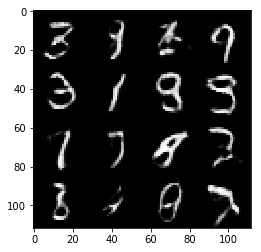

Epoch 2/3... Discriminator Loss: 1.0518... Generator Loss: 0.6502
Epoch 2/3... Discriminator Loss: 0.5897... Generator Loss: 1.2820
Epoch 2/3... Discriminator Loss: 0.9908... Generator Loss: 0.6477
Epoch 2/3... Discriminator Loss: 0.5497... Generator Loss: 1.1513
Epoch 2/3... Discriminator Loss: 1.1593... Generator Loss: 0.5578
Epoch 2/3... Discriminator Loss: 0.5109... Generator Loss: 1.4436
Epoch 2/3... Discriminator Loss: 1.1835... Generator Loss: 0.6253
Epoch 2/3... Discriminator Loss: 0.6515... Generator Loss: 1.0993
Epoch 2/3... Discriminator Loss: 0.9018... Generator Loss: 0.7578
Epoch 2/3... Discriminator Loss: 0.4385... Generator Loss: 2.1331


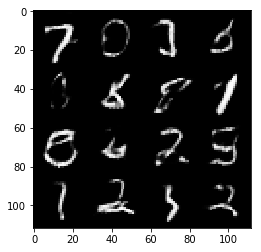

Epoch 2/3... Discriminator Loss: 0.5030... Generator Loss: 2.0794
Epoch 2/3... Discriminator Loss: 0.6645... Generator Loss: 1.2677
Epoch 2/3... Discriminator Loss: 0.6246... Generator Loss: 1.1416
Epoch 2/3... Discriminator Loss: 0.5222... Generator Loss: 1.3527
Epoch 2/3... Discriminator Loss: 0.9816... Generator Loss: 0.7012
Epoch 2/3... Discriminator Loss: 0.6550... Generator Loss: 1.9208
Epoch 2/3... Discriminator Loss: 1.1537... Generator Loss: 0.6228
Epoch 2/3... Discriminator Loss: 0.9760... Generator Loss: 3.0319
Epoch 2/3... Discriminator Loss: 0.8529... Generator Loss: 0.9751
Epoch 2/3... Discriminator Loss: 0.7229... Generator Loss: 1.0179


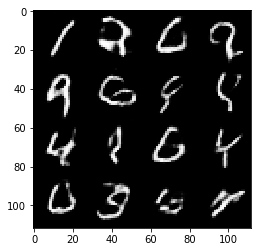

Epoch 2/3... Discriminator Loss: 1.3614... Generator Loss: 3.1315
Epoch 2/3... Discriminator Loss: 0.4720... Generator Loss: 1.7486
Epoch 2/3... Discriminator Loss: 0.9370... Generator Loss: 2.4855
Epoch 2/3... Discriminator Loss: 0.8880... Generator Loss: 0.9568
Epoch 2/3... Discriminator Loss: 0.9059... Generator Loss: 0.8255
Epoch 2/3... Discriminator Loss: 0.7623... Generator Loss: 1.1127
Epoch 2/3... Discriminator Loss: 0.5650... Generator Loss: 1.3065
Epoch 2/3... Discriminator Loss: 0.5680... Generator Loss: 1.7833
Epoch 2/3... Discriminator Loss: 0.5363... Generator Loss: 1.9960
Epoch 2/3... Discriminator Loss: 1.5579... Generator Loss: 0.3324


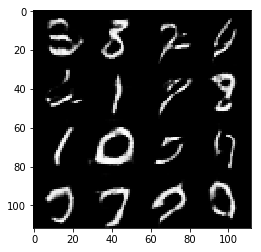

Epoch 2/3... Discriminator Loss: 0.7425... Generator Loss: 0.9834
Epoch 2/3... Discriminator Loss: 1.6895... Generator Loss: 0.3980
Epoch 2/3... Discriminator Loss: 0.9040... Generator Loss: 0.8019
Epoch 2/3... Discriminator Loss: 0.9194... Generator Loss: 3.3224
Epoch 2/3... Discriminator Loss: 0.8394... Generator Loss: 0.8349
Epoch 2/3... Discriminator Loss: 0.5426... Generator Loss: 1.2858
Epoch 2/3... Discriminator Loss: 0.6920... Generator Loss: 1.0751
Epoch 2/3... Discriminator Loss: 0.5274... Generator Loss: 1.4910
Epoch 2/3... Discriminator Loss: 0.3982... Generator Loss: 1.5210
Epoch 2/3... Discriminator Loss: 0.9670... Generator Loss: 1.0431


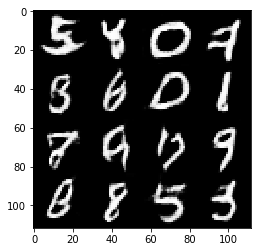

Epoch 2/3... Discriminator Loss: 0.8174... Generator Loss: 1.4117
Epoch 2/3... Discriminator Loss: 0.5365... Generator Loss: 1.5388
Epoch 2/3... Discriminator Loss: 1.4488... Generator Loss: 0.4026
Epoch 2/3... Discriminator Loss: 0.7163... Generator Loss: 1.0593
Epoch 2/3... Discriminator Loss: 0.6333... Generator Loss: 1.2081
Epoch 2/3... Discriminator Loss: 0.5768... Generator Loss: 1.3385
Epoch 2/3... Discriminator Loss: 0.8311... Generator Loss: 1.0253
Epoch 3/3... Discriminator Loss: 0.5582... Generator Loss: 2.0050
Epoch 3/3... Discriminator Loss: 0.3808... Generator Loss: 1.9564
Epoch 3/3... Discriminator Loss: 0.6499... Generator Loss: 1.6991


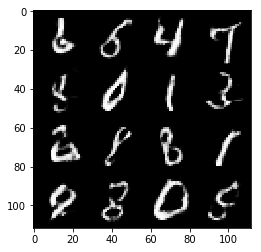

Epoch 3/3... Discriminator Loss: 1.2639... Generator Loss: 2.4139
Epoch 3/3... Discriminator Loss: 0.7231... Generator Loss: 1.1220
Epoch 3/3... Discriminator Loss: 0.6580... Generator Loss: 1.2488
Epoch 3/3... Discriminator Loss: 1.2483... Generator Loss: 0.5345
Epoch 3/3... Discriminator Loss: 0.7629... Generator Loss: 1.8589
Epoch 3/3... Discriminator Loss: 0.5780... Generator Loss: 1.7764
Epoch 3/3... Discriminator Loss: 1.3404... Generator Loss: 0.4580
Epoch 3/3... Discriminator Loss: 0.4608... Generator Loss: 1.9075
Epoch 3/3... Discriminator Loss: 0.8217... Generator Loss: 0.8276
Epoch 3/3... Discriminator Loss: 0.5515... Generator Loss: 1.4520


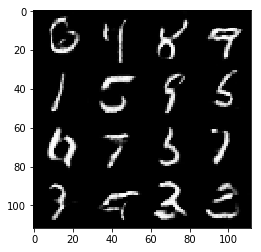

Epoch 3/3... Discriminator Loss: 0.7954... Generator Loss: 0.8435
Epoch 3/3... Discriminator Loss: 0.4370... Generator Loss: 1.5435
Epoch 3/3... Discriminator Loss: 0.4972... Generator Loss: 1.4013
Epoch 3/3... Discriminator Loss: 0.8542... Generator Loss: 0.7287
Epoch 3/3... Discriminator Loss: 0.3323... Generator Loss: 1.8911
Epoch 3/3... Discriminator Loss: 0.4120... Generator Loss: 1.7833
Epoch 3/3... Discriminator Loss: 0.4501... Generator Loss: 1.4651
Epoch 3/3... Discriminator Loss: 0.4966... Generator Loss: 1.7886
Epoch 3/3... Discriminator Loss: 0.9546... Generator Loss: 0.7906
Epoch 3/3... Discriminator Loss: 0.5384... Generator Loss: 1.7441


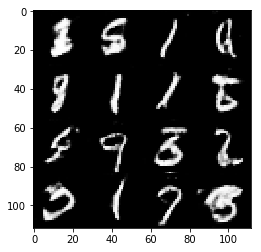

Epoch 3/3... Discriminator Loss: 1.3675... Generator Loss: 0.5371
Epoch 3/3... Discriminator Loss: 0.4598... Generator Loss: 1.5266
Epoch 3/3... Discriminator Loss: 1.2477... Generator Loss: 0.4972
Epoch 3/3... Discriminator Loss: 1.8519... Generator Loss: 0.2339
Epoch 3/3... Discriminator Loss: 0.5821... Generator Loss: 1.2097
Epoch 3/3... Discriminator Loss: 0.3918... Generator Loss: 1.9169
Epoch 3/3... Discriminator Loss: 0.5006... Generator Loss: 1.4281
Epoch 3/3... Discriminator Loss: 0.7713... Generator Loss: 0.9576
Epoch 3/3... Discriminator Loss: 0.8305... Generator Loss: 0.7685
Epoch 3/3... Discriminator Loss: 0.8858... Generator Loss: 0.7952


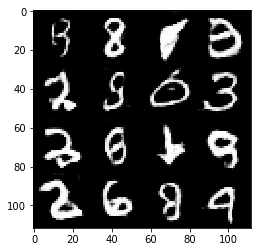

Epoch 3/3... Discriminator Loss: 2.0540... Generator Loss: 0.1899
Epoch 3/3... Discriminator Loss: 0.6432... Generator Loss: 1.4037
Epoch 3/3... Discriminator Loss: 0.6609... Generator Loss: 1.4775
Epoch 3/3... Discriminator Loss: 0.4954... Generator Loss: 1.5390
Epoch 3/3... Discriminator Loss: 0.5223... Generator Loss: 1.2819
Epoch 3/3... Discriminator Loss: 0.3975... Generator Loss: 1.6917
Epoch 3/3... Discriminator Loss: 0.7119... Generator Loss: 2.5682
Epoch 3/3... Discriminator Loss: 0.5098... Generator Loss: 1.4536
Epoch 3/3... Discriminator Loss: 0.5275... Generator Loss: 1.3159
Epoch 3/3... Discriminator Loss: 0.4633... Generator Loss: 1.3822


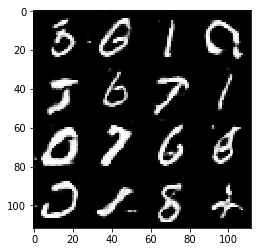

Epoch 3/3... Discriminator Loss: 0.4883... Generator Loss: 1.3638
Epoch 3/3... Discriminator Loss: 0.4075... Generator Loss: 1.4178
Epoch 3/3... Discriminator Loss: 0.2750... Generator Loss: 2.5728
Epoch 3/3... Discriminator Loss: 0.8747... Generator Loss: 0.8600
Epoch 3/3... Discriminator Loss: 0.6032... Generator Loss: 1.2010
Epoch 3/3... Discriminator Loss: 0.5661... Generator Loss: 1.4345
Epoch 3/3... Discriminator Loss: 0.7219... Generator Loss: 0.9658
Epoch 3/3... Discriminator Loss: 0.5479... Generator Loss: 1.2991
Epoch 3/3... Discriminator Loss: 1.3623... Generator Loss: 0.5359
Epoch 3/3... Discriminator Loss: 0.5172... Generator Loss: 1.6417


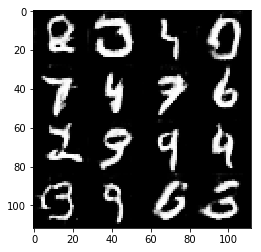

Epoch 3/3... Discriminator Loss: 0.4592... Generator Loss: 1.9087
Epoch 3/3... Discriminator Loss: 0.3996... Generator Loss: 2.1489
Epoch 3/3... Discriminator Loss: 0.4673... Generator Loss: 1.7683
Epoch 3/3... Discriminator Loss: 1.5199... Generator Loss: 0.4635
Epoch 3/3... Discriminator Loss: 0.8226... Generator Loss: 1.0086
Epoch 3/3... Discriminator Loss: 0.7511... Generator Loss: 0.9483
Epoch 3/3... Discriminator Loss: 0.5757... Generator Loss: 1.3148
Epoch 3/3... Discriminator Loss: 0.5207... Generator Loss: 1.5939
Epoch 3/3... Discriminator Loss: 0.5697... Generator Loss: 1.6715
Epoch 3/3... Discriminator Loss: 0.7432... Generator Loss: 1.0773


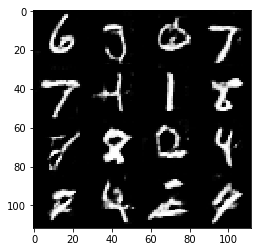

Epoch 3/3... Discriminator Loss: 0.7417... Generator Loss: 0.9158
Epoch 3/3... Discriminator Loss: 0.7069... Generator Loss: 0.9053
Epoch 3/3... Discriminator Loss: 0.4846... Generator Loss: 2.1064
Epoch 3/3... Discriminator Loss: 0.6552... Generator Loss: 1.0599
Epoch 3/3... Discriminator Loss: 0.6902... Generator Loss: 0.9869
Epoch 3/3... Discriminator Loss: 0.8268... Generator Loss: 0.7960
Epoch 3/3... Discriminator Loss: 0.5166... Generator Loss: 1.3538
Epoch 3/3... Discriminator Loss: 0.6445... Generator Loss: 1.1071
Epoch 3/3... Discriminator Loss: 1.2564... Generator Loss: 3.9071
Epoch 3/3... Discriminator Loss: 0.5373... Generator Loss: 1.3176


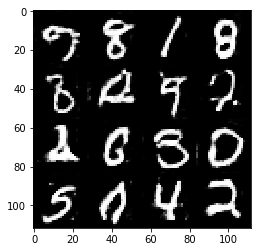

Epoch 3/3... Discriminator Loss: 0.3392... Generator Loss: 2.0212
Epoch 3/3... Discriminator Loss: 0.5311... Generator Loss: 1.3945
Epoch 3/3... Discriminator Loss: 0.4503... Generator Loss: 1.4400
Epoch 3/3... Discriminator Loss: 0.9181... Generator Loss: 0.7394
Epoch 3/3... Discriminator Loss: 0.5278... Generator Loss: 1.2385
Epoch 3/3... Discriminator Loss: 0.3473... Generator Loss: 1.7353
Epoch 3/3... Discriminator Loss: 0.5173... Generator Loss: 1.2736
Epoch 3/3... Discriminator Loss: 0.5180... Generator Loss: 2.4344
Epoch 3/3... Discriminator Loss: 0.4655... Generator Loss: 1.3577
Epoch 3/3... Discriminator Loss: 0.4599... Generator Loss: 1.3801


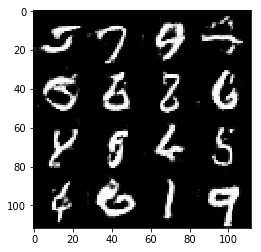

Epoch 3/3... Discriminator Loss: 0.4393... Generator Loss: 1.5131
Epoch 3/3... Discriminator Loss: 0.3579... Generator Loss: 1.8606
Epoch 3/3... Discriminator Loss: 0.5757... Generator Loss: 1.2426
Epoch 3/3... Discriminator Loss: 0.6289... Generator Loss: 2.4515
Epoch 3/3... Discriminator Loss: 0.8481... Generator Loss: 1.2429
Epoch 3/3... Discriminator Loss: 0.6138... Generator Loss: 2.3730
Epoch 3/3... Discriminator Loss: 0.4602... Generator Loss: 2.3704
Epoch 3/3... Discriminator Loss: 0.5315... Generator Loss: 1.9412
Epoch 3/3... Discriminator Loss: 0.9688... Generator Loss: 0.6952
Epoch 3/3... Discriminator Loss: 0.7836... Generator Loss: 0.8434


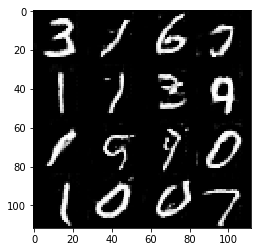

Epoch 3/3... Discriminator Loss: 0.3241... Generator Loss: 1.8086


In [82]:
batch_size = 64
z_dim = 100
learning_rate = 0.0002
beta1 = 0.5

#saver = tf.train.Saver(var_list=g_vars)

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 3

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/10... Discriminator Loss: 0.1605... Generator Loss: 2.8614
Epoch 1/10... Discriminator Loss: 0.3893... Generator Loss: 1.5039
Epoch 1/10... Discriminator Loss: 0.3617... Generator Loss: 2.2002
Epoch 1/10... Discriminator Loss: 0.7065... Generator Loss: 12.2690
Epoch 1/10... Discriminator Loss: 0.2491... Generator Loss: 3.2534
Epoch 1/10... Discriminator Loss: 0.3077... Generator Loss: 3.2305
Epoch 1/10... Discriminator Loss: 0.7526... Generator Loss: 1.3996
Epoch 1/10... Discriminator Loss: 1.3849... Generator Loss: 6.0766
Epoch 1/10... Discriminator Loss: 2.0277... Generator Loss: 5.6506
Epoch 1/10... Discriminator Loss: 0.2841... Generator Loss: 2.5274


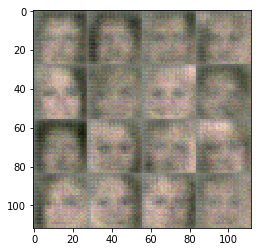

Epoch 1/10... Discriminator Loss: 0.7293... Generator Loss: 1.4423
Epoch 1/10... Discriminator Loss: 0.1581... Generator Loss: 3.9275
Epoch 1/10... Discriminator Loss: 0.2197... Generator Loss: 2.7157
Epoch 1/10... Discriminator Loss: 0.3676... Generator Loss: 4.0815
Epoch 1/10... Discriminator Loss: 0.1611... Generator Loss: 2.9877
Epoch 1/10... Discriminator Loss: 1.5166... Generator Loss: 0.4542
Epoch 1/10... Discriminator Loss: 0.8861... Generator Loss: 2.8392
Epoch 1/10... Discriminator Loss: 0.9534... Generator Loss: 0.9361
Epoch 1/10... Discriminator Loss: 0.1387... Generator Loss: 3.3728
Epoch 1/10... Discriminator Loss: 1.0279... Generator Loss: 0.7511


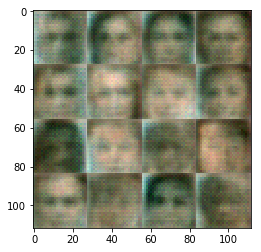

Epoch 1/10... Discriminator Loss: 2.4526... Generator Loss: 0.1946
Epoch 1/10... Discriminator Loss: 0.2175... Generator Loss: 3.0126
Epoch 1/10... Discriminator Loss: 0.5045... Generator Loss: 2.0249
Epoch 1/10... Discriminator Loss: 1.2969... Generator Loss: 0.4501
Epoch 1/10... Discriminator Loss: 0.1431... Generator Loss: 3.1631
Epoch 1/10... Discriminator Loss: 2.8217... Generator Loss: 5.9358
Epoch 1/10... Discriminator Loss: 1.4691... Generator Loss: 0.5399
Epoch 1/10... Discriminator Loss: 0.4392... Generator Loss: 1.8131
Epoch 1/10... Discriminator Loss: 1.4266... Generator Loss: 0.4712
Epoch 1/10... Discriminator Loss: 0.3915... Generator Loss: 1.8794


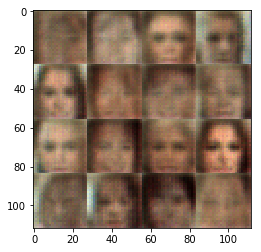

Epoch 1/10... Discriminator Loss: 1.8002... Generator Loss: 0.3291
Epoch 1/10... Discriminator Loss: 0.3566... Generator Loss: 1.8174
Epoch 1/10... Discriminator Loss: 0.6824... Generator Loss: 1.3182
Epoch 1/10... Discriminator Loss: 0.4589... Generator Loss: 2.2256
Epoch 1/10... Discriminator Loss: 0.1900... Generator Loss: 2.6155
Epoch 1/10... Discriminator Loss: 0.4492... Generator Loss: 1.6204
Epoch 1/10... Discriminator Loss: 0.3244... Generator Loss: 1.7644
Epoch 1/10... Discriminator Loss: 0.8429... Generator Loss: 0.7454
Epoch 1/10... Discriminator Loss: 2.1897... Generator Loss: 0.2695
Epoch 1/10... Discriminator Loss: 0.7376... Generator Loss: 3.5320


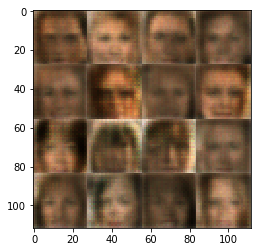

Epoch 1/10... Discriminator Loss: 0.5040... Generator Loss: 1.2716
Epoch 1/10... Discriminator Loss: 1.0176... Generator Loss: 0.9284
Epoch 1/10... Discriminator Loss: 0.0766... Generator Loss: 3.7524
Epoch 1/10... Discriminator Loss: 1.3419... Generator Loss: 2.5180
Epoch 1/10... Discriminator Loss: 0.8762... Generator Loss: 0.7785
Epoch 1/10... Discriminator Loss: 0.8053... Generator Loss: 7.6126
Epoch 1/10... Discriminator Loss: 0.9509... Generator Loss: 2.5340
Epoch 1/10... Discriminator Loss: 0.1840... Generator Loss: 2.7949
Epoch 1/10... Discriminator Loss: 2.7179... Generator Loss: 4.4258
Epoch 1/10... Discriminator Loss: 1.3913... Generator Loss: 2.1129


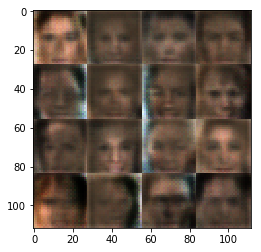

Epoch 1/10... Discriminator Loss: 1.2125... Generator Loss: 7.0716
Epoch 1/10... Discriminator Loss: 1.7787... Generator Loss: 3.8759
Epoch 1/10... Discriminator Loss: 0.3628... Generator Loss: 1.8191
Epoch 1/10... Discriminator Loss: 0.2775... Generator Loss: 7.2647
Epoch 1/10... Discriminator Loss: 0.8522... Generator Loss: 1.7935
Epoch 1/10... Discriminator Loss: 0.2199... Generator Loss: 3.0884
Epoch 1/10... Discriminator Loss: 0.9859... Generator Loss: 0.6628
Epoch 1/10... Discriminator Loss: 0.1312... Generator Loss: 2.7548
Epoch 1/10... Discriminator Loss: 1.0923... Generator Loss: 0.5563
Epoch 1/10... Discriminator Loss: 0.2510... Generator Loss: 5.7884


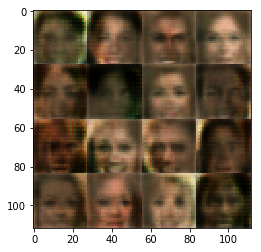

Epoch 1/10... Discriminator Loss: 1.0941... Generator Loss: 4.0694
Epoch 1/10... Discriminator Loss: 2.7030... Generator Loss: 7.3809
Epoch 1/10... Discriminator Loss: 0.7922... Generator Loss: 1.0241
Epoch 1/10... Discriminator Loss: 1.2935... Generator Loss: 0.4189
Epoch 1/10... Discriminator Loss: 0.7130... Generator Loss: 1.3668
Epoch 1/10... Discriminator Loss: 0.7834... Generator Loss: 3.1264
Epoch 1/10... Discriminator Loss: 0.1360... Generator Loss: 3.6912
Epoch 1/10... Discriminator Loss: 0.3663... Generator Loss: 1.9393
Epoch 1/10... Discriminator Loss: 0.2848... Generator Loss: 1.9869
Epoch 1/10... Discriminator Loss: 0.2328... Generator Loss: 4.8434


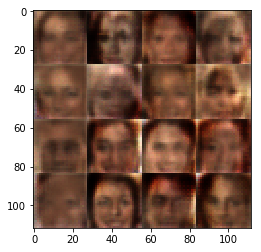

Epoch 1/10... Discriminator Loss: 0.3428... Generator Loss: 4.3425
Epoch 1/10... Discriminator Loss: 0.1511... Generator Loss: 2.6365
Epoch 1/10... Discriminator Loss: 0.1285... Generator Loss: 3.0802
Epoch 1/10... Discriminator Loss: 1.0156... Generator Loss: 1.3487
Epoch 1/10... Discriminator Loss: 0.4966... Generator Loss: 5.2703
Epoch 1/10... Discriminator Loss: 0.0685... Generator Loss: 5.2595
Epoch 1/10... Discriminator Loss: 1.1341... Generator Loss: 0.6534
Epoch 1/10... Discriminator Loss: 0.9820... Generator Loss: 0.8355
Epoch 1/10... Discriminator Loss: 2.0691... Generator Loss: 0.2110
Epoch 1/10... Discriminator Loss: 0.2868... Generator Loss: 5.4823


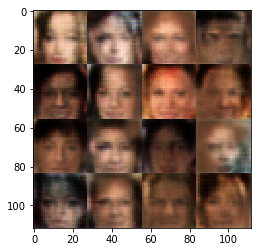

Epoch 1/10... Discriminator Loss: 0.2106... Generator Loss: 2.2803
Epoch 1/10... Discriminator Loss: 1.2102... Generator Loss: 2.2769
Epoch 1/10... Discriminator Loss: 0.1061... Generator Loss: 6.1694
Epoch 1/10... Discriminator Loss: 0.2870... Generator Loss: 2.3468
Epoch 1/10... Discriminator Loss: 1.2035... Generator Loss: 1.2204
Epoch 1/10... Discriminator Loss: 0.7235... Generator Loss: 2.1626
Epoch 1/10... Discriminator Loss: 0.3407... Generator Loss: 2.5947
Epoch 1/10... Discriminator Loss: 0.9902... Generator Loss: 0.6905
Epoch 1/10... Discriminator Loss: 0.7645... Generator Loss: 0.8076
Epoch 1/10... Discriminator Loss: 1.1392... Generator Loss: 0.5069


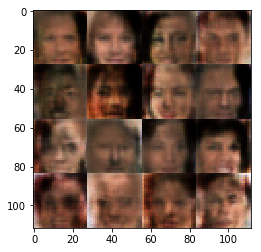

Epoch 1/10... Discriminator Loss: 0.3341... Generator Loss: 3.4613
Epoch 1/10... Discriminator Loss: 0.8046... Generator Loss: 3.0427
Epoch 1/10... Discriminator Loss: 0.0916... Generator Loss: 5.6779
Epoch 1/10... Discriminator Loss: 0.0798... Generator Loss: 3.9138
Epoch 1/10... Discriminator Loss: 1.4281... Generator Loss: 2.3959
Epoch 1/10... Discriminator Loss: 1.1806... Generator Loss: 0.6018
Epoch 1/10... Discriminator Loss: 0.1438... Generator Loss: 3.7290
Epoch 1/10... Discriminator Loss: 0.5005... Generator Loss: 1.6507
Epoch 1/10... Discriminator Loss: 0.6631... Generator Loss: 1.0000
Epoch 1/10... Discriminator Loss: 1.1034... Generator Loss: 0.5734


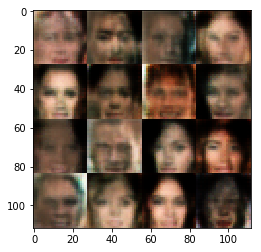

Epoch 1/10... Discriminator Loss: 2.3853... Generator Loss: 0.1408
Epoch 1/10... Discriminator Loss: 1.6433... Generator Loss: 3.3636
Epoch 1/10... Discriminator Loss: 1.3994... Generator Loss: 0.4426
Epoch 1/10... Discriminator Loss: 0.5329... Generator Loss: 3.7119
Epoch 1/10... Discriminator Loss: 0.8761... Generator Loss: 0.7279
Epoch 1/10... Discriminator Loss: 0.1398... Generator Loss: 2.6697
Epoch 1/10... Discriminator Loss: 1.0289... Generator Loss: 0.5850
Epoch 1/10... Discriminator Loss: 0.8405... Generator Loss: 1.2543
Epoch 1/10... Discriminator Loss: 1.2040... Generator Loss: 0.5108
Epoch 1/10... Discriminator Loss: 0.1289... Generator Loss: 4.9076


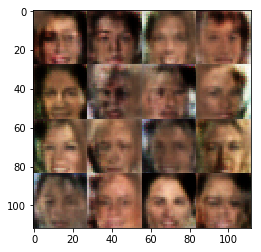

Epoch 1/10... Discriminator Loss: 0.9848... Generator Loss: 0.7098
Epoch 1/10... Discriminator Loss: 0.9971... Generator Loss: 2.4090
Epoch 1/10... Discriminator Loss: 0.7766... Generator Loss: 0.9319
Epoch 1/10... Discriminator Loss: 0.0925... Generator Loss: 4.2666
Epoch 1/10... Discriminator Loss: 1.0207... Generator Loss: 0.6215
Epoch 1/10... Discriminator Loss: 1.2688... Generator Loss: 0.4635
Epoch 1/10... Discriminator Loss: 1.5201... Generator Loss: 0.3188
Epoch 1/10... Discriminator Loss: 1.7015... Generator Loss: 0.3075
Epoch 1/10... Discriminator Loss: 0.8174... Generator Loss: 1.0256
Epoch 1/10... Discriminator Loss: 2.0643... Generator Loss: 3.4879


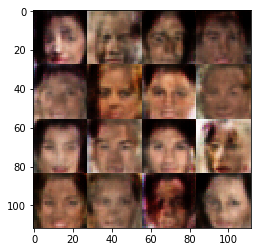

Epoch 1/10... Discriminator Loss: 0.7011... Generator Loss: 0.9476
Epoch 1/10... Discriminator Loss: 0.3082... Generator Loss: 3.8852
Epoch 1/10... Discriminator Loss: 0.3169... Generator Loss: 1.9151
Epoch 1/10... Discriminator Loss: 0.6669... Generator Loss: 0.9017
Epoch 1/10... Discriminator Loss: 3.0832... Generator Loss: 4.8459
Epoch 1/10... Discriminator Loss: 1.2030... Generator Loss: 1.3141
Epoch 1/10... Discriminator Loss: 1.1728... Generator Loss: 0.8827
Epoch 1/10... Discriminator Loss: 0.9961... Generator Loss: 0.9690
Epoch 1/10... Discriminator Loss: 1.0822... Generator Loss: 0.8675
Epoch 1/10... Discriminator Loss: 1.0712... Generator Loss: 0.6830


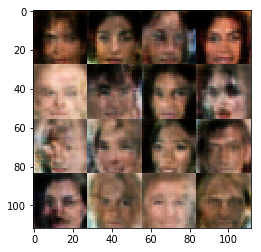

Epoch 1/10... Discriminator Loss: 1.4692... Generator Loss: 1.8427
Epoch 1/10... Discriminator Loss: 0.8271... Generator Loss: 2.6869
Epoch 1/10... Discriminator Loss: 0.6074... Generator Loss: 3.5549
Epoch 1/10... Discriminator Loss: 0.2470... Generator Loss: 2.1228
Epoch 1/10... Discriminator Loss: 2.7536... Generator Loss: 4.0432
Epoch 1/10... Discriminator Loss: 0.9780... Generator Loss: 0.6881
Epoch 1/10... Discriminator Loss: 1.3627... Generator Loss: 0.3907
Epoch 1/10... Discriminator Loss: 0.4883... Generator Loss: 1.8512
Epoch 1/10... Discriminator Loss: 0.4521... Generator Loss: 4.4876
Epoch 1/10... Discriminator Loss: 0.8120... Generator Loss: 2.1524


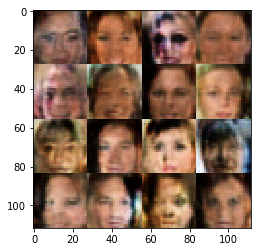

Epoch 1/10... Discriminator Loss: 0.4831... Generator Loss: 1.2688
Epoch 1/10... Discriminator Loss: 0.7119... Generator Loss: 1.0367
Epoch 1/10... Discriminator Loss: 0.9366... Generator Loss: 0.6640
Epoch 1/10... Discriminator Loss: 0.4962... Generator Loss: 1.2262
Epoch 1/10... Discriminator Loss: 0.4546... Generator Loss: 2.1755
Epoch 1/10... Discriminator Loss: 0.8019... Generator Loss: 1.1694
Epoch 1/10... Discriminator Loss: 0.8691... Generator Loss: 0.9045
Epoch 1/10... Discriminator Loss: 0.6261... Generator Loss: 1.0038
Epoch 1/10... Discriminator Loss: 0.3120... Generator Loss: 1.8324
Epoch 1/10... Discriminator Loss: 0.3735... Generator Loss: 2.0974


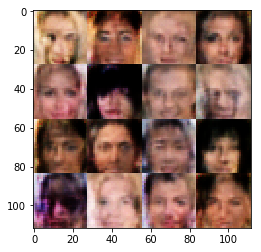

Epoch 1/10... Discriminator Loss: 0.7987... Generator Loss: 1.2123
Epoch 1/10... Discriminator Loss: 1.0559... Generator Loss: 2.2539
Epoch 1/10... Discriminator Loss: 0.4476... Generator Loss: 2.5943
Epoch 1/10... Discriminator Loss: 0.3084... Generator Loss: 1.9189
Epoch 1/10... Discriminator Loss: 0.6754... Generator Loss: 0.9505
Epoch 1/10... Discriminator Loss: 0.3065... Generator Loss: 1.8764
Epoch 1/10... Discriminator Loss: 0.9817... Generator Loss: 0.6734
Epoch 1/10... Discriminator Loss: 0.1663... Generator Loss: 5.5449
Epoch 1/10... Discriminator Loss: 0.5668... Generator Loss: 1.1231
Epoch 1/10... Discriminator Loss: 1.7703... Generator Loss: 0.2665


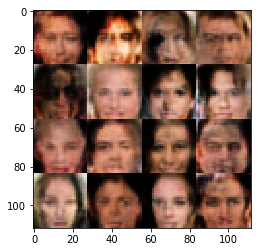

Epoch 1/10... Discriminator Loss: 1.6016... Generator Loss: 5.2592
Epoch 1/10... Discriminator Loss: 1.0679... Generator Loss: 0.6224
Epoch 1/10... Discriminator Loss: 0.9351... Generator Loss: 1.3686
Epoch 1/10... Discriminator Loss: 0.7137... Generator Loss: 1.2671
Epoch 1/10... Discriminator Loss: 0.4304... Generator Loss: 1.5889
Epoch 1/10... Discriminator Loss: 1.0677... Generator Loss: 0.5700
Epoch 1/10... Discriminator Loss: 0.9793... Generator Loss: 3.4150
Epoch 1/10... Discriminator Loss: 0.5925... Generator Loss: 5.1617
Epoch 1/10... Discriminator Loss: 0.9320... Generator Loss: 0.6630
Epoch 1/10... Discriminator Loss: 0.4346... Generator Loss: 1.8365


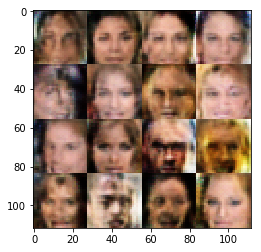

Epoch 1/10... Discriminator Loss: 0.8665... Generator Loss: 0.7750
Epoch 1/10... Discriminator Loss: 0.3045... Generator Loss: 3.7674
Epoch 1/10... Discriminator Loss: 0.5818... Generator Loss: 1.1088
Epoch 1/10... Discriminator Loss: 1.3614... Generator Loss: 0.6812
Epoch 1/10... Discriminator Loss: 0.7450... Generator Loss: 0.9015
Epoch 1/10... Discriminator Loss: 0.4063... Generator Loss: 2.2029
Epoch 1/10... Discriminator Loss: 0.2609... Generator Loss: 2.6151
Epoch 1/10... Discriminator Loss: 1.4346... Generator Loss: 2.0499
Epoch 1/10... Discriminator Loss: 0.2282... Generator Loss: 2.4330
Epoch 1/10... Discriminator Loss: 0.5761... Generator Loss: 1.1166


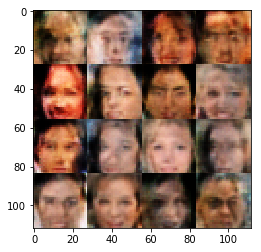

Epoch 1/10... Discriminator Loss: 0.1022... Generator Loss: 2.9083
Epoch 1/10... Discriminator Loss: 0.8063... Generator Loss: 2.2588
Epoch 1/10... Discriminator Loss: 0.5841... Generator Loss: 2.0267
Epoch 1/10... Discriminator Loss: 0.3118... Generator Loss: 1.9909
Epoch 1/10... Discriminator Loss: 0.7007... Generator Loss: 1.9730
Epoch 1/10... Discriminator Loss: 1.3848... Generator Loss: 0.4337
Epoch 1/10... Discriminator Loss: 0.8972... Generator Loss: 1.3417
Epoch 1/10... Discriminator Loss: 0.0629... Generator Loss: 4.8599
Epoch 1/10... Discriminator Loss: 0.4363... Generator Loss: 1.4936
Epoch 1/10... Discriminator Loss: 0.3275... Generator Loss: 2.4653


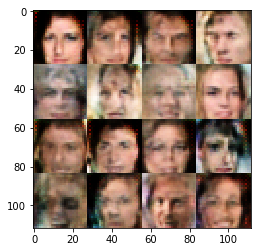

Epoch 1/10... Discriminator Loss: 0.4222... Generator Loss: 1.8465
Epoch 1/10... Discriminator Loss: 0.5130... Generator Loss: 3.5755
Epoch 1/10... Discriminator Loss: 0.6494... Generator Loss: 1.1956
Epoch 1/10... Discriminator Loss: 0.1782... Generator Loss: 2.5852
Epoch 1/10... Discriminator Loss: 0.2297... Generator Loss: 2.0154
Epoch 1/10... Discriminator Loss: 1.2759... Generator Loss: 0.5049
Epoch 1/10... Discriminator Loss: 0.1100... Generator Loss: 3.0997
Epoch 1/10... Discriminator Loss: 0.4707... Generator Loss: 2.2363
Epoch 1/10... Discriminator Loss: 0.4679... Generator Loss: 2.3964
Epoch 1/10... Discriminator Loss: 0.3960... Generator Loss: 1.7332


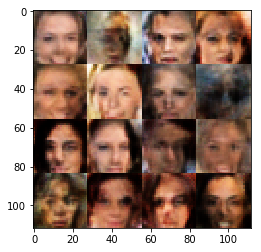

Epoch 1/10... Discriminator Loss: 1.0988... Generator Loss: 1.4178
Epoch 1/10... Discriminator Loss: 0.3312... Generator Loss: 2.1642
Epoch 1/10... Discriminator Loss: 1.4277... Generator Loss: 0.3540
Epoch 1/10... Discriminator Loss: 3.5500... Generator Loss: 3.5881
Epoch 1/10... Discriminator Loss: 1.2181... Generator Loss: 1.9496
Epoch 1/10... Discriminator Loss: 0.4707... Generator Loss: 4.5570
Epoch 1/10... Discriminator Loss: 1.7412... Generator Loss: 3.4009
Epoch 1/10... Discriminator Loss: 0.9147... Generator Loss: 0.6872
Epoch 1/10... Discriminator Loss: 0.7722... Generator Loss: 1.4142
Epoch 1/10... Discriminator Loss: 0.0941... Generator Loss: 3.9938


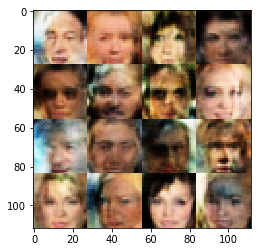

Epoch 1/10... Discriminator Loss: 1.4605... Generator Loss: 0.3771
Epoch 1/10... Discriminator Loss: 0.2929... Generator Loss: 1.8143
Epoch 1/10... Discriminator Loss: 0.3999... Generator Loss: 2.7135
Epoch 1/10... Discriminator Loss: 0.3333... Generator Loss: 1.8156
Epoch 1/10... Discriminator Loss: 0.9397... Generator Loss: 2.5099
Epoch 1/10... Discriminator Loss: 0.2899... Generator Loss: 3.5982
Epoch 1/10... Discriminator Loss: 0.3401... Generator Loss: 2.2303
Epoch 1/10... Discriminator Loss: 1.1747... Generator Loss: 0.5139
Epoch 1/10... Discriminator Loss: 0.9786... Generator Loss: 0.7498
Epoch 1/10... Discriminator Loss: 1.1894... Generator Loss: 2.1672


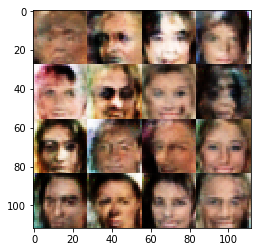

Epoch 1/10... Discriminator Loss: 1.1552... Generator Loss: 0.5510
Epoch 1/10... Discriminator Loss: 0.0848... Generator Loss: 6.2963
Epoch 1/10... Discriminator Loss: 0.8584... Generator Loss: 2.6297
Epoch 1/10... Discriminator Loss: 0.8132... Generator Loss: 0.8693
Epoch 1/10... Discriminator Loss: 1.1476... Generator Loss: 2.4368
Epoch 1/10... Discriminator Loss: 0.9394... Generator Loss: 1.2131
Epoch 1/10... Discriminator Loss: 0.5104... Generator Loss: 1.5113
Epoch 1/10... Discriminator Loss: 0.4706... Generator Loss: 1.3777
Epoch 1/10... Discriminator Loss: 0.7912... Generator Loss: 1.3422
Epoch 1/10... Discriminator Loss: 0.8243... Generator Loss: 2.3517


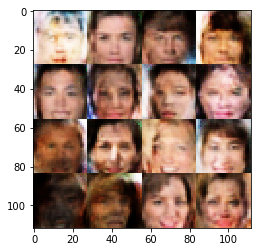

Epoch 1/10... Discriminator Loss: 1.0253... Generator Loss: 0.6564
Epoch 1/10... Discriminator Loss: 0.4862... Generator Loss: 1.4721
Epoch 1/10... Discriminator Loss: 1.5738... Generator Loss: 2.6893
Epoch 1/10... Discriminator Loss: 0.4522... Generator Loss: 2.4680
Epoch 1/10... Discriminator Loss: 0.8766... Generator Loss: 0.9019
Epoch 1/10... Discriminator Loss: 1.2026... Generator Loss: 0.4892
Epoch 1/10... Discriminator Loss: 1.2186... Generator Loss: 0.4545
Epoch 1/10... Discriminator Loss: 1.7892... Generator Loss: 0.2578
Epoch 1/10... Discriminator Loss: 0.5337... Generator Loss: 1.5154
Epoch 1/10... Discriminator Loss: 0.6660... Generator Loss: 1.2192


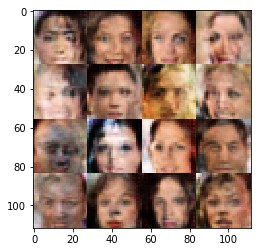

Epoch 1/10... Discriminator Loss: 1.5283... Generator Loss: 2.6280
Epoch 1/10... Discriminator Loss: 0.1914... Generator Loss: 4.2371
Epoch 1/10... Discriminator Loss: 0.7943... Generator Loss: 0.7849
Epoch 1/10... Discriminator Loss: 1.1121... Generator Loss: 0.9855
Epoch 1/10... Discriminator Loss: 1.0696... Generator Loss: 1.5831
Epoch 1/10... Discriminator Loss: 1.7082... Generator Loss: 3.8637
Epoch 1/10... Discriminator Loss: 1.7792... Generator Loss: 0.2730
Epoch 1/10... Discriminator Loss: 0.8650... Generator Loss: 0.8386
Epoch 1/10... Discriminator Loss: 0.6379... Generator Loss: 1.5359
Epoch 1/10... Discriminator Loss: 1.2608... Generator Loss: 1.6786


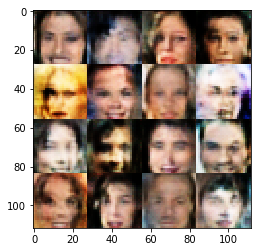

Epoch 1/10... Discriminator Loss: 0.8776... Generator Loss: 0.7333
Epoch 1/10... Discriminator Loss: 0.9481... Generator Loss: 6.9503
Epoch 1/10... Discriminator Loss: 1.2837... Generator Loss: 0.5140
Epoch 1/10... Discriminator Loss: 0.3777... Generator Loss: 2.3284
Epoch 1/10... Discriminator Loss: 1.5328... Generator Loss: 0.3627
Epoch 1/10... Discriminator Loss: 1.4604... Generator Loss: 0.3942
Epoch 1/10... Discriminator Loss: 0.4018... Generator Loss: 1.9974
Epoch 1/10... Discriminator Loss: 1.0062... Generator Loss: 0.5980
Epoch 1/10... Discriminator Loss: 0.2194... Generator Loss: 3.9136
Epoch 1/10... Discriminator Loss: 1.0670... Generator Loss: 0.6802


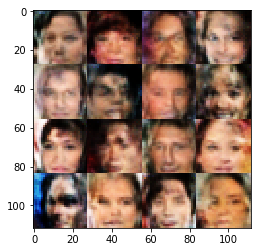

Epoch 1/10... Discriminator Loss: 0.7277... Generator Loss: 0.9285
Epoch 1/10... Discriminator Loss: 0.8059... Generator Loss: 0.9496
Epoch 1/10... Discriminator Loss: 0.8603... Generator Loss: 0.9176
Epoch 1/10... Discriminator Loss: 0.7857... Generator Loss: 1.2769
Epoch 1/10... Discriminator Loss: 0.6263... Generator Loss: 1.1007
Epoch 1/10... Discriminator Loss: 0.6456... Generator Loss: 1.2682
Epoch 1/10... Discriminator Loss: 0.5437... Generator Loss: 1.4763
Epoch 1/10... Discriminator Loss: 0.3325... Generator Loss: 1.9272
Epoch 1/10... Discriminator Loss: 1.7302... Generator Loss: 3.8691
Epoch 1/10... Discriminator Loss: 0.1385... Generator Loss: 3.5614


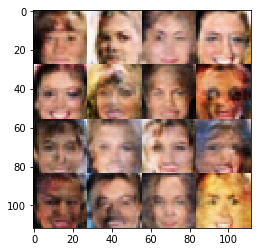

Epoch 1/10... Discriminator Loss: 1.4936... Generator Loss: 0.3793
Epoch 1/10... Discriminator Loss: 0.5274... Generator Loss: 1.2750
Epoch 1/10... Discriminator Loss: 1.4209... Generator Loss: 0.4200
Epoch 1/10... Discriminator Loss: 0.5088... Generator Loss: 1.2429
Epoch 1/10... Discriminator Loss: 0.3050... Generator Loss: 1.7682
Epoch 1/10... Discriminator Loss: 0.8461... Generator Loss: 1.9844
Epoch 1/10... Discriminator Loss: 1.6557... Generator Loss: 0.2888
Epoch 1/10... Discriminator Loss: 1.5012... Generator Loss: 0.4138
Epoch 1/10... Discriminator Loss: 0.9920... Generator Loss: 0.6574
Epoch 1/10... Discriminator Loss: 1.0090... Generator Loss: 1.5240


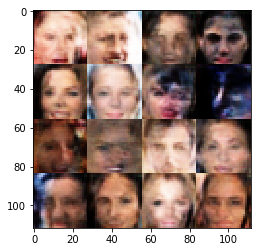

Epoch 1/10... Discriminator Loss: 1.5406... Generator Loss: 0.4287
Epoch 1/10... Discriminator Loss: 0.5832... Generator Loss: 1.2335
Epoch 1/10... Discriminator Loss: 0.4570... Generator Loss: 1.5348
Epoch 1/10... Discriminator Loss: 0.4091... Generator Loss: 1.6461
Epoch 1/10... Discriminator Loss: 1.0396... Generator Loss: 1.0561
Epoch 1/10... Discriminator Loss: 0.4259... Generator Loss: 3.8388
Epoch 1/10... Discriminator Loss: 0.6842... Generator Loss: 1.0547
Epoch 1/10... Discriminator Loss: 0.6703... Generator Loss: 1.1464
Epoch 1/10... Discriminator Loss: 0.8165... Generator Loss: 0.8887
Epoch 1/10... Discriminator Loss: 1.2906... Generator Loss: 0.9376


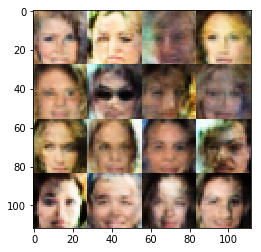

Epoch 1/10... Discriminator Loss: 1.5875... Generator Loss: 0.3624
Epoch 1/10... Discriminator Loss: 0.7809... Generator Loss: 2.7145
Epoch 1/10... Discriminator Loss: 0.9054... Generator Loss: 1.5270
Epoch 1/10... Discriminator Loss: 1.4137... Generator Loss: 0.3980
Epoch 1/10... Discriminator Loss: 0.7446... Generator Loss: 1.0040
Epoch 1/10... Discriminator Loss: 0.7708... Generator Loss: 1.5393
Epoch 1/10... Discriminator Loss: 0.9313... Generator Loss: 0.8633
Epoch 1/10... Discriminator Loss: 1.1494... Generator Loss: 0.7117
Epoch 1/10... Discriminator Loss: 0.4606... Generator Loss: 1.5641
Epoch 1/10... Discriminator Loss: 1.4633... Generator Loss: 0.4178


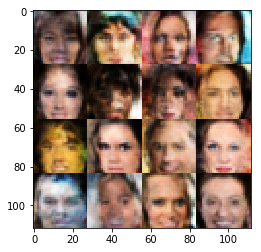

Epoch 1/10... Discriminator Loss: 1.1226... Generator Loss: 1.3498
Epoch 1/10... Discriminator Loss: 0.5114... Generator Loss: 1.5634
Epoch 1/10... Discriminator Loss: 0.8963... Generator Loss: 0.9702
Epoch 1/10... Discriminator Loss: 1.0397... Generator Loss: 0.6602
Epoch 1/10... Discriminator Loss: 0.5279... Generator Loss: 1.6089
Epoch 1/10... Discriminator Loss: 0.7735... Generator Loss: 0.8944
Epoch 1/10... Discriminator Loss: 0.1927... Generator Loss: 2.8595
Epoch 1/10... Discriminator Loss: 0.8217... Generator Loss: 2.0813
Epoch 1/10... Discriminator Loss: 0.8591... Generator Loss: 1.0593
Epoch 1/10... Discriminator Loss: 0.5966... Generator Loss: 1.5405


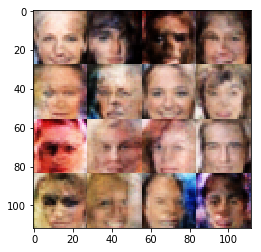

Epoch 1/10... Discriminator Loss: 1.3246... Generator Loss: 0.4275
Epoch 1/10... Discriminator Loss: 0.7909... Generator Loss: 1.0890
Epoch 1/10... Discriminator Loss: 0.8424... Generator Loss: 0.8942
Epoch 1/10... Discriminator Loss: 1.0714... Generator Loss: 0.7123
Epoch 1/10... Discriminator Loss: 0.8509... Generator Loss: 1.1571
Epoch 1/10... Discriminator Loss: 0.7875... Generator Loss: 1.2341
Epoch 2/10... Discriminator Loss: 0.9003... Generator Loss: 0.6733
Epoch 2/10... Discriminator Loss: 0.8980... Generator Loss: 0.7231
Epoch 2/10... Discriminator Loss: 1.3092... Generator Loss: 2.5002
Epoch 2/10... Discriminator Loss: 0.9972... Generator Loss: 0.7862


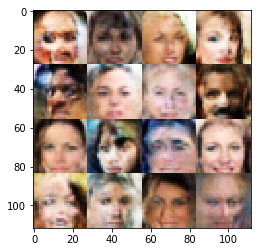

Epoch 2/10... Discriminator Loss: 1.1763... Generator Loss: 0.5803
Epoch 2/10... Discriminator Loss: 0.9159... Generator Loss: 0.7078
Epoch 2/10... Discriminator Loss: 0.9692... Generator Loss: 0.8418
Epoch 2/10... Discriminator Loss: 0.8814... Generator Loss: 1.7137
Epoch 2/10... Discriminator Loss: 1.5134... Generator Loss: 0.3714
Epoch 2/10... Discriminator Loss: 1.2475... Generator Loss: 0.4909
Epoch 2/10... Discriminator Loss: 1.0393... Generator Loss: 0.8004
Epoch 2/10... Discriminator Loss: 1.0979... Generator Loss: 0.6153
Epoch 2/10... Discriminator Loss: 0.6115... Generator Loss: 1.9016
Epoch 2/10... Discriminator Loss: 1.3107... Generator Loss: 0.6555


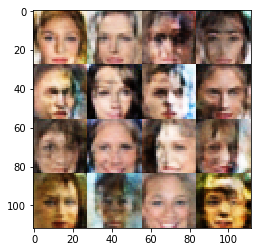

Epoch 2/10... Discriminator Loss: 0.9726... Generator Loss: 0.8128
Epoch 2/10... Discriminator Loss: 0.6373... Generator Loss: 1.1745
Epoch 2/10... Discriminator Loss: 0.5569... Generator Loss: 1.7772
Epoch 2/10... Discriminator Loss: 0.8053... Generator Loss: 1.5604
Epoch 2/10... Discriminator Loss: 0.8701... Generator Loss: 1.0229
Epoch 2/10... Discriminator Loss: 0.5076... Generator Loss: 2.7938
Epoch 2/10... Discriminator Loss: 0.4482... Generator Loss: 3.3020
Epoch 2/10... Discriminator Loss: 0.8161... Generator Loss: 1.4380
Epoch 2/10... Discriminator Loss: 1.1777... Generator Loss: 0.6473
Epoch 2/10... Discriminator Loss: 0.9083... Generator Loss: 0.9725


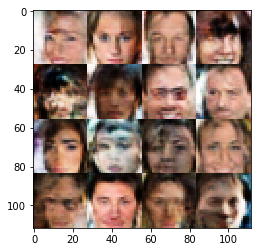

Epoch 2/10... Discriminator Loss: 0.7500... Generator Loss: 2.5485
Epoch 2/10... Discriminator Loss: 0.7088... Generator Loss: 1.2654
Epoch 2/10... Discriminator Loss: 0.6331... Generator Loss: 1.2140
Epoch 2/10... Discriminator Loss: 1.5710... Generator Loss: 0.3362
Epoch 2/10... Discriminator Loss: 0.6961... Generator Loss: 2.0318
Epoch 2/10... Discriminator Loss: 0.7892... Generator Loss: 1.4015
Epoch 2/10... Discriminator Loss: 0.9447... Generator Loss: 0.7946
Epoch 2/10... Discriminator Loss: 1.1076... Generator Loss: 1.8130
Epoch 2/10... Discriminator Loss: 1.1519... Generator Loss: 0.6235
Epoch 2/10... Discriminator Loss: 0.7951... Generator Loss: 1.1551


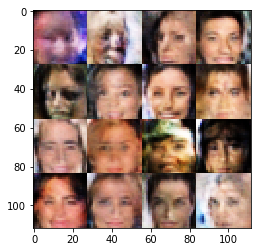

Epoch 2/10... Discriminator Loss: 1.0869... Generator Loss: 0.6114
Epoch 2/10... Discriminator Loss: 0.8345... Generator Loss: 1.0467
Epoch 2/10... Discriminator Loss: 1.2089... Generator Loss: 0.5841
Epoch 2/10... Discriminator Loss: 0.9388... Generator Loss: 0.7759
Epoch 2/10... Discriminator Loss: 0.9016... Generator Loss: 0.8068
Epoch 2/10... Discriminator Loss: 0.8131... Generator Loss: 0.9434
Epoch 2/10... Discriminator Loss: 0.5139... Generator Loss: 1.3681
Epoch 2/10... Discriminator Loss: 0.9291... Generator Loss: 1.8359
Epoch 2/10... Discriminator Loss: 0.9180... Generator Loss: 0.9180
Epoch 2/10... Discriminator Loss: 0.7099... Generator Loss: 0.9657


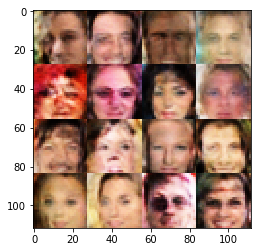

Epoch 2/10... Discriminator Loss: 1.1041... Generator Loss: 0.5882
Epoch 2/10... Discriminator Loss: 2.1001... Generator Loss: 3.7916
Epoch 2/10... Discriminator Loss: 1.1986... Generator Loss: 0.5167
Epoch 2/10... Discriminator Loss: 0.8731... Generator Loss: 0.9972
Epoch 2/10... Discriminator Loss: 0.9220... Generator Loss: 0.8551
Epoch 2/10... Discriminator Loss: 0.9614... Generator Loss: 0.7534
Epoch 2/10... Discriminator Loss: 0.6078... Generator Loss: 1.3388
Epoch 2/10... Discriminator Loss: 0.8061... Generator Loss: 1.3007
Epoch 2/10... Discriminator Loss: 1.4847... Generator Loss: 2.3709
Epoch 2/10... Discriminator Loss: 0.7548... Generator Loss: 1.0394


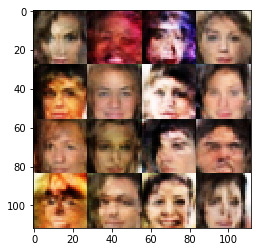

Epoch 2/10... Discriminator Loss: 1.0397... Generator Loss: 0.6769
Epoch 2/10... Discriminator Loss: 1.4229... Generator Loss: 0.3840
Epoch 2/10... Discriminator Loss: 0.8721... Generator Loss: 0.8993
Epoch 2/10... Discriminator Loss: 0.9308... Generator Loss: 1.4540
Epoch 2/10... Discriminator Loss: 0.9518... Generator Loss: 0.8424
Epoch 2/10... Discriminator Loss: 0.8535... Generator Loss: 0.9667
Epoch 2/10... Discriminator Loss: 1.1001... Generator Loss: 0.7556
Epoch 2/10... Discriminator Loss: 1.1448... Generator Loss: 0.5069
Epoch 2/10... Discriminator Loss: 1.1567... Generator Loss: 0.6320
Epoch 2/10... Discriminator Loss: 1.1867... Generator Loss: 0.5354


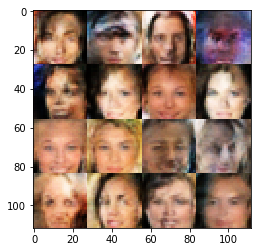

Epoch 2/10... Discriminator Loss: 1.3493... Generator Loss: 0.4413
Epoch 2/10... Discriminator Loss: 0.8844... Generator Loss: 0.8431
Epoch 2/10... Discriminator Loss: 1.4209... Generator Loss: 0.4236
Epoch 2/10... Discriminator Loss: 1.1106... Generator Loss: 0.7229
Epoch 2/10... Discriminator Loss: 1.0157... Generator Loss: 0.6595
Epoch 2/10... Discriminator Loss: 1.2111... Generator Loss: 0.4967
Epoch 2/10... Discriminator Loss: 1.3014... Generator Loss: 0.5278
Epoch 2/10... Discriminator Loss: 0.8738... Generator Loss: 0.8118
Epoch 2/10... Discriminator Loss: 1.0082... Generator Loss: 0.8482
Epoch 2/10... Discriminator Loss: 1.1198... Generator Loss: 0.5985


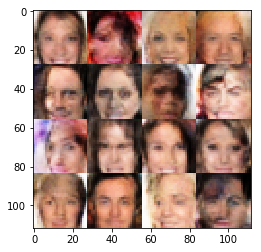

Epoch 2/10... Discriminator Loss: 0.6734... Generator Loss: 1.1906
Epoch 2/10... Discriminator Loss: 0.7965... Generator Loss: 1.1083
Epoch 2/10... Discriminator Loss: 0.6160... Generator Loss: 1.5274
Epoch 2/10... Discriminator Loss: 1.0816... Generator Loss: 0.6631
Epoch 2/10... Discriminator Loss: 0.7459... Generator Loss: 1.3120
Epoch 2/10... Discriminator Loss: 0.9535... Generator Loss: 0.8670
Epoch 2/10... Discriminator Loss: 1.0432... Generator Loss: 0.7231
Epoch 2/10... Discriminator Loss: 0.7483... Generator Loss: 1.1899
Epoch 2/10... Discriminator Loss: 0.7726... Generator Loss: 1.7344
Epoch 2/10... Discriminator Loss: 0.9630... Generator Loss: 1.6968


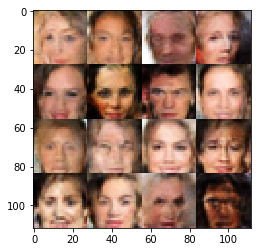

Epoch 2/10... Discriminator Loss: 0.7230... Generator Loss: 1.4302
Epoch 2/10... Discriminator Loss: 0.8795... Generator Loss: 0.8266
Epoch 2/10... Discriminator Loss: 0.5642... Generator Loss: 1.4675
Epoch 2/10... Discriminator Loss: 1.0374... Generator Loss: 0.6353
Epoch 2/10... Discriminator Loss: 0.8659... Generator Loss: 1.0908
Epoch 2/10... Discriminator Loss: 1.0058... Generator Loss: 0.6397
Epoch 2/10... Discriminator Loss: 1.0421... Generator Loss: 0.5896
Epoch 2/10... Discriminator Loss: 0.7597... Generator Loss: 1.0914
Epoch 2/10... Discriminator Loss: 0.8907... Generator Loss: 0.7272
Epoch 2/10... Discriminator Loss: 0.9150... Generator Loss: 0.8552


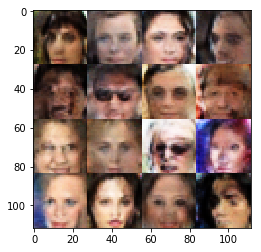

Epoch 2/10... Discriminator Loss: 0.7302... Generator Loss: 1.3215
Epoch 2/10... Discriminator Loss: 1.0321... Generator Loss: 0.7237
Epoch 2/10... Discriminator Loss: 1.0115... Generator Loss: 0.7146
Epoch 2/10... Discriminator Loss: 1.0377... Generator Loss: 1.0747
Epoch 2/10... Discriminator Loss: 0.9309... Generator Loss: 0.8009
Epoch 2/10... Discriminator Loss: 1.1615... Generator Loss: 0.7190
Epoch 2/10... Discriminator Loss: 0.7929... Generator Loss: 0.9867
Epoch 2/10... Discriminator Loss: 0.9436... Generator Loss: 0.6999
Epoch 2/10... Discriminator Loss: 1.6061... Generator Loss: 0.3060
Epoch 2/10... Discriminator Loss: 1.0649... Generator Loss: 0.6626


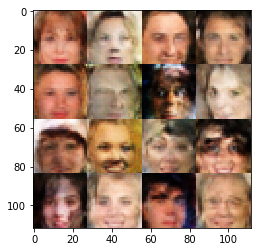

Epoch 2/10... Discriminator Loss: 0.9872... Generator Loss: 0.6759
Epoch 2/10... Discriminator Loss: 0.9035... Generator Loss: 0.8043
Epoch 2/10... Discriminator Loss: 1.1442... Generator Loss: 0.5621
Epoch 2/10... Discriminator Loss: 0.9481... Generator Loss: 0.8708
Epoch 2/10... Discriminator Loss: 0.6572... Generator Loss: 1.3360
Epoch 2/10... Discriminator Loss: 1.3628... Generator Loss: 0.4634
Epoch 2/10... Discriminator Loss: 0.7728... Generator Loss: 1.7000
Epoch 2/10... Discriminator Loss: 0.8976... Generator Loss: 1.0654
Epoch 2/10... Discriminator Loss: 0.6192... Generator Loss: 1.2404
Epoch 2/10... Discriminator Loss: 0.8079... Generator Loss: 1.8903


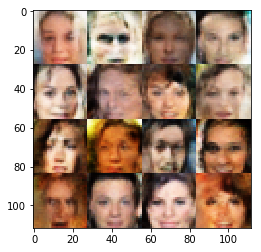

Epoch 2/10... Discriminator Loss: 1.1330... Generator Loss: 0.6640
Epoch 2/10... Discriminator Loss: 1.3573... Generator Loss: 0.5102
Epoch 2/10... Discriminator Loss: 0.7477... Generator Loss: 1.0730
Epoch 2/10... Discriminator Loss: 0.9229... Generator Loss: 1.0452
Epoch 2/10... Discriminator Loss: 1.2180... Generator Loss: 0.4603
Epoch 2/10... Discriminator Loss: 1.0149... Generator Loss: 0.6692
Epoch 2/10... Discriminator Loss: 0.8022... Generator Loss: 1.3620
Epoch 2/10... Discriminator Loss: 0.8804... Generator Loss: 0.8856
Epoch 2/10... Discriminator Loss: 0.9102... Generator Loss: 0.7984
Epoch 2/10... Discriminator Loss: 0.6797... Generator Loss: 1.3880


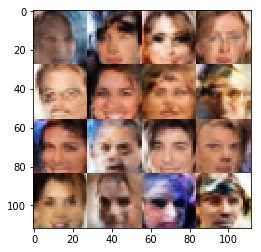

Epoch 2/10... Discriminator Loss: 0.7143... Generator Loss: 0.9614
Epoch 2/10... Discriminator Loss: 1.0973... Generator Loss: 0.6399
Epoch 2/10... Discriminator Loss: 0.8129... Generator Loss: 0.9913
Epoch 2/10... Discriminator Loss: 1.0913... Generator Loss: 0.6058
Epoch 2/10... Discriminator Loss: 0.8815... Generator Loss: 2.1347
Epoch 2/10... Discriminator Loss: 0.8398... Generator Loss: 1.5405
Epoch 2/10... Discriminator Loss: 0.8110... Generator Loss: 1.8389
Epoch 2/10... Discriminator Loss: 0.8069... Generator Loss: 0.9360
Epoch 2/10... Discriminator Loss: 0.9924... Generator Loss: 0.7092
Epoch 2/10... Discriminator Loss: 1.3581... Generator Loss: 0.4123


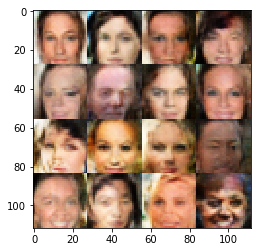

Epoch 2/10... Discriminator Loss: 0.9640... Generator Loss: 0.7270
Epoch 2/10... Discriminator Loss: 0.9324... Generator Loss: 1.5017
Epoch 2/10... Discriminator Loss: 0.7799... Generator Loss: 1.2643
Epoch 2/10... Discriminator Loss: 0.7864... Generator Loss: 1.2804
Epoch 2/10... Discriminator Loss: 1.1024... Generator Loss: 0.5919
Epoch 2/10... Discriminator Loss: 0.9151... Generator Loss: 0.7649
Epoch 2/10... Discriminator Loss: 1.3171... Generator Loss: 0.4245
Epoch 2/10... Discriminator Loss: 1.2611... Generator Loss: 0.4174
Epoch 2/10... Discriminator Loss: 0.8798... Generator Loss: 0.8997
Epoch 2/10... Discriminator Loss: 1.1590... Generator Loss: 0.6650


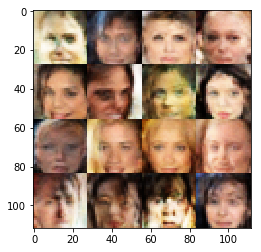

Epoch 2/10... Discriminator Loss: 1.3875... Generator Loss: 0.3903
Epoch 2/10... Discriminator Loss: 0.6981... Generator Loss: 1.0994
Epoch 2/10... Discriminator Loss: 0.8497... Generator Loss: 1.4276
Epoch 2/10... Discriminator Loss: 0.8593... Generator Loss: 0.9883
Epoch 2/10... Discriminator Loss: 1.0934... Generator Loss: 0.6147
Epoch 2/10... Discriminator Loss: 0.5986... Generator Loss: 1.5110
Epoch 2/10... Discriminator Loss: 0.9313... Generator Loss: 0.9152
Epoch 2/10... Discriminator Loss: 0.8733... Generator Loss: 1.0740
Epoch 2/10... Discriminator Loss: 1.0112... Generator Loss: 1.7562
Epoch 2/10... Discriminator Loss: 1.0877... Generator Loss: 1.8374


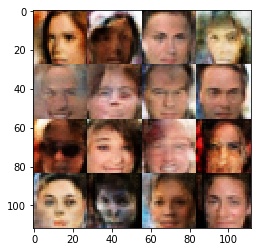

Epoch 2/10... Discriminator Loss: 1.0716... Generator Loss: 0.7261
Epoch 2/10... Discriminator Loss: 0.9103... Generator Loss: 0.9222
Epoch 2/10... Discriminator Loss: 1.0414... Generator Loss: 0.6538
Epoch 2/10... Discriminator Loss: 0.9544... Generator Loss: 0.7153
Epoch 2/10... Discriminator Loss: 1.0005... Generator Loss: 0.6948
Epoch 2/10... Discriminator Loss: 0.9911... Generator Loss: 0.6632
Epoch 2/10... Discriminator Loss: 1.0511... Generator Loss: 0.6305
Epoch 2/10... Discriminator Loss: 0.8534... Generator Loss: 1.0424
Epoch 2/10... Discriminator Loss: 0.7871... Generator Loss: 0.8940
Epoch 2/10... Discriminator Loss: 0.8497... Generator Loss: 1.7440


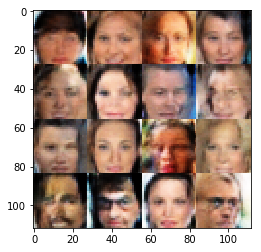

Epoch 2/10... Discriminator Loss: 0.9437... Generator Loss: 0.7195
Epoch 2/10... Discriminator Loss: 0.9979... Generator Loss: 1.0363
Epoch 2/10... Discriminator Loss: 0.8632... Generator Loss: 1.2469
Epoch 2/10... Discriminator Loss: 0.9216... Generator Loss: 0.9411
Epoch 2/10... Discriminator Loss: 1.5155... Generator Loss: 3.7593
Epoch 2/10... Discriminator Loss: 0.7283... Generator Loss: 0.8759
Epoch 2/10... Discriminator Loss: 1.1806... Generator Loss: 0.5678
Epoch 2/10... Discriminator Loss: 1.4671... Generator Loss: 0.3799
Epoch 2/10... Discriminator Loss: 0.8890... Generator Loss: 1.0009
Epoch 2/10... Discriminator Loss: 0.9484... Generator Loss: 1.1964


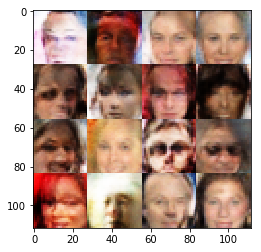

Epoch 2/10... Discriminator Loss: 1.1099... Generator Loss: 0.6873
Epoch 2/10... Discriminator Loss: 1.0187... Generator Loss: 1.0886
Epoch 2/10... Discriminator Loss: 0.9400... Generator Loss: 0.9173
Epoch 2/10... Discriminator Loss: 1.0805... Generator Loss: 0.6173
Epoch 2/10... Discriminator Loss: 1.1630... Generator Loss: 0.5564
Epoch 2/10... Discriminator Loss: 1.0402... Generator Loss: 0.7584
Epoch 2/10... Discriminator Loss: 0.7843... Generator Loss: 1.0298
Epoch 2/10... Discriminator Loss: 0.8337... Generator Loss: 0.9620
Epoch 2/10... Discriminator Loss: 0.8512... Generator Loss: 0.9443
Epoch 2/10... Discriminator Loss: 1.0008... Generator Loss: 0.7475


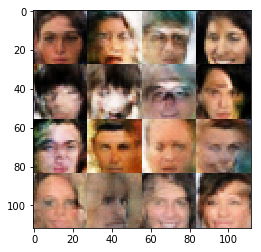

Epoch 2/10... Discriminator Loss: 1.0355... Generator Loss: 0.6337
Epoch 2/10... Discriminator Loss: 0.9811... Generator Loss: 0.6452
Epoch 2/10... Discriminator Loss: 1.0946... Generator Loss: 0.6252
Epoch 2/10... Discriminator Loss: 1.0562... Generator Loss: 0.6468
Epoch 2/10... Discriminator Loss: 0.8861... Generator Loss: 1.2663
Epoch 2/10... Discriminator Loss: 0.8631... Generator Loss: 0.9790
Epoch 2/10... Discriminator Loss: 0.8032... Generator Loss: 1.2426
Epoch 2/10... Discriminator Loss: 0.8891... Generator Loss: 1.3703
Epoch 2/10... Discriminator Loss: 0.7818... Generator Loss: 1.1166
Epoch 2/10... Discriminator Loss: 0.7797... Generator Loss: 0.9100


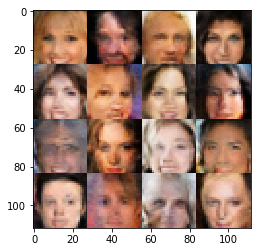

Epoch 2/10... Discriminator Loss: 0.9050... Generator Loss: 0.9267
Epoch 2/10... Discriminator Loss: 1.1879... Generator Loss: 0.8963
Epoch 2/10... Discriminator Loss: 0.8522... Generator Loss: 0.9436
Epoch 2/10... Discriminator Loss: 0.9114... Generator Loss: 0.8963
Epoch 2/10... Discriminator Loss: 0.8198... Generator Loss: 1.7956
Epoch 2/10... Discriminator Loss: 1.0630... Generator Loss: 0.8521
Epoch 2/10... Discriminator Loss: 1.4006... Generator Loss: 0.4283
Epoch 2/10... Discriminator Loss: 0.8249... Generator Loss: 1.1425
Epoch 2/10... Discriminator Loss: 0.5821... Generator Loss: 1.8079
Epoch 2/10... Discriminator Loss: 1.0643... Generator Loss: 0.6215


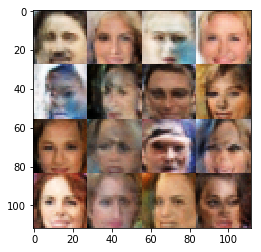

Epoch 2/10... Discriminator Loss: 0.9799... Generator Loss: 0.8516
Epoch 2/10... Discriminator Loss: 0.8227... Generator Loss: 0.9911
Epoch 2/10... Discriminator Loss: 1.1174... Generator Loss: 0.7044
Epoch 2/10... Discriminator Loss: 0.8801... Generator Loss: 1.0925
Epoch 2/10... Discriminator Loss: 1.1662... Generator Loss: 0.7420
Epoch 2/10... Discriminator Loss: 1.1318... Generator Loss: 0.6021
Epoch 2/10... Discriminator Loss: 0.8118... Generator Loss: 1.6234
Epoch 2/10... Discriminator Loss: 0.9370... Generator Loss: 1.1866
Epoch 2/10... Discriminator Loss: 0.6681... Generator Loss: 1.2454
Epoch 2/10... Discriminator Loss: 0.8711... Generator Loss: 0.8713


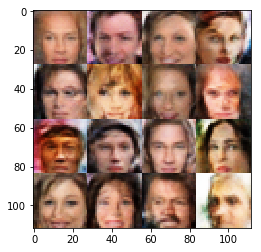

Epoch 2/10... Discriminator Loss: 1.1925... Generator Loss: 0.5412
Epoch 2/10... Discriminator Loss: 1.8323... Generator Loss: 2.9917
Epoch 2/10... Discriminator Loss: 1.0228... Generator Loss: 0.7195
Epoch 2/10... Discriminator Loss: 0.9826... Generator Loss: 0.8508
Epoch 2/10... Discriminator Loss: 1.0174... Generator Loss: 0.9795
Epoch 2/10... Discriminator Loss: 1.2096... Generator Loss: 0.6382
Epoch 2/10... Discriminator Loss: 0.8370... Generator Loss: 0.9490
Epoch 2/10... Discriminator Loss: 0.8891... Generator Loss: 0.8420
Epoch 2/10... Discriminator Loss: 0.8354... Generator Loss: 1.1002
Epoch 2/10... Discriminator Loss: 0.7144... Generator Loss: 1.1666


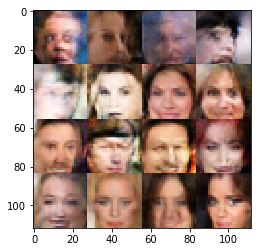

Epoch 2/10... Discriminator Loss: 0.8962... Generator Loss: 1.1445
Epoch 2/10... Discriminator Loss: 0.8976... Generator Loss: 1.3531
Epoch 2/10... Discriminator Loss: 0.6748... Generator Loss: 1.3691
Epoch 2/10... Discriminator Loss: 0.7990... Generator Loss: 1.3223
Epoch 2/10... Discriminator Loss: 0.8691... Generator Loss: 1.7678
Epoch 2/10... Discriminator Loss: 1.1534... Generator Loss: 1.4402
Epoch 2/10... Discriminator Loss: 1.0466... Generator Loss: 0.7062
Epoch 2/10... Discriminator Loss: 0.8640... Generator Loss: 1.3595
Epoch 2/10... Discriminator Loss: 0.9850... Generator Loss: 1.7324
Epoch 2/10... Discriminator Loss: 1.1621... Generator Loss: 1.0942


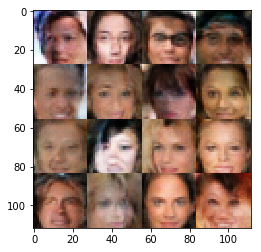

Epoch 2/10... Discriminator Loss: 0.6927... Generator Loss: 1.6657
Epoch 2/10... Discriminator Loss: 0.7801... Generator Loss: 1.3232
Epoch 2/10... Discriminator Loss: 0.8780... Generator Loss: 1.0992
Epoch 2/10... Discriminator Loss: 1.2495... Generator Loss: 0.6695
Epoch 2/10... Discriminator Loss: 1.1356... Generator Loss: 0.6132
Epoch 2/10... Discriminator Loss: 0.8811... Generator Loss: 1.8250
Epoch 2/10... Discriminator Loss: 0.9296... Generator Loss: 0.8654
Epoch 2/10... Discriminator Loss: 0.8167... Generator Loss: 0.9091
Epoch 2/10... Discriminator Loss: 0.9174... Generator Loss: 1.2311
Epoch 2/10... Discriminator Loss: 0.9575... Generator Loss: 0.7100


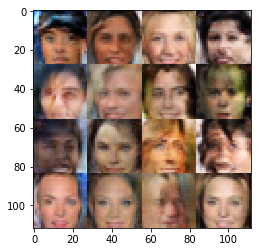

Epoch 2/10... Discriminator Loss: 0.9662... Generator Loss: 0.6967
Epoch 2/10... Discriminator Loss: 1.0812... Generator Loss: 1.6130
Epoch 2/10... Discriminator Loss: 0.9255... Generator Loss: 1.2372
Epoch 2/10... Discriminator Loss: 0.8958... Generator Loss: 0.7830
Epoch 2/10... Discriminator Loss: 0.9302... Generator Loss: 0.8291
Epoch 2/10... Discriminator Loss: 1.0391... Generator Loss: 0.7838
Epoch 2/10... Discriminator Loss: 1.2009... Generator Loss: 0.4866
Epoch 2/10... Discriminator Loss: 0.9463... Generator Loss: 0.9661
Epoch 2/10... Discriminator Loss: 0.9234... Generator Loss: 0.9754
Epoch 2/10... Discriminator Loss: 1.1759... Generator Loss: 0.5425


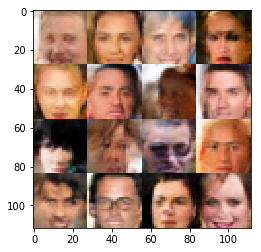

Epoch 2/10... Discriminator Loss: 1.3592... Generator Loss: 0.4209
Epoch 2/10... Discriminator Loss: 0.9297... Generator Loss: 0.9138
Epoch 2/10... Discriminator Loss: 1.2783... Generator Loss: 1.4508
Epoch 2/10... Discriminator Loss: 0.9226... Generator Loss: 0.7777
Epoch 2/10... Discriminator Loss: 0.9216... Generator Loss: 0.9459
Epoch 2/10... Discriminator Loss: 0.8646... Generator Loss: 1.0926
Epoch 2/10... Discriminator Loss: 0.9257... Generator Loss: 0.8059
Epoch 2/10... Discriminator Loss: 0.8035... Generator Loss: 1.1357
Epoch 2/10... Discriminator Loss: 0.7993... Generator Loss: 1.7906
Epoch 2/10... Discriminator Loss: 1.0647... Generator Loss: 0.5640


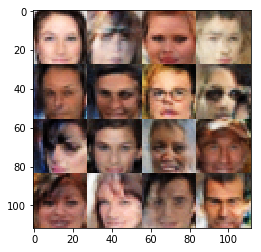

Epoch 2/10... Discriminator Loss: 1.1954... Generator Loss: 1.9026
Epoch 2/10... Discriminator Loss: 1.1375... Generator Loss: 0.6313
Epoch 2/10... Discriminator Loss: 1.0274... Generator Loss: 0.6841
Epoch 2/10... Discriminator Loss: 1.0181... Generator Loss: 0.7022
Epoch 2/10... Discriminator Loss: 0.8822... Generator Loss: 1.1349
Epoch 2/10... Discriminator Loss: 0.9240... Generator Loss: 0.8102
Epoch 2/10... Discriminator Loss: 1.3816... Generator Loss: 1.4980
Epoch 2/10... Discriminator Loss: 1.3634... Generator Loss: 0.4251
Epoch 2/10... Discriminator Loss: 1.0578... Generator Loss: 0.9392
Epoch 2/10... Discriminator Loss: 0.8201... Generator Loss: 0.9410


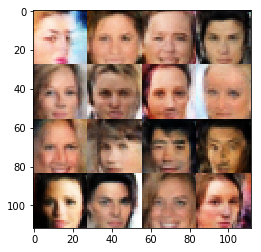

Epoch 2/10... Discriminator Loss: 0.9870... Generator Loss: 0.7454
Epoch 2/10... Discriminator Loss: 1.2178... Generator Loss: 0.4694
Epoch 2/10... Discriminator Loss: 1.1290... Generator Loss: 1.4001
Epoch 2/10... Discriminator Loss: 1.1461... Generator Loss: 0.7324
Epoch 2/10... Discriminator Loss: 1.0101... Generator Loss: 1.4922
Epoch 2/10... Discriminator Loss: 1.1484... Generator Loss: 0.5501
Epoch 2/10... Discriminator Loss: 0.9805... Generator Loss: 0.7946
Epoch 2/10... Discriminator Loss: 1.3079... Generator Loss: 0.4385
Epoch 2/10... Discriminator Loss: 1.0359... Generator Loss: 1.1103
Epoch 2/10... Discriminator Loss: 1.1156... Generator Loss: 1.3124


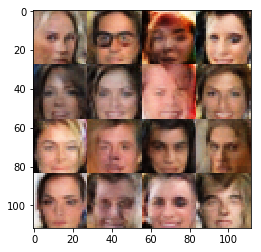

Epoch 2/10... Discriminator Loss: 1.3784... Generator Loss: 0.4659
Epoch 2/10... Discriminator Loss: 0.8875... Generator Loss: 1.0759
Epoch 2/10... Discriminator Loss: 0.6147... Generator Loss: 1.5119
Epoch 2/10... Discriminator Loss: 1.1674... Generator Loss: 0.5098
Epoch 2/10... Discriminator Loss: 0.8705... Generator Loss: 1.1662
Epoch 2/10... Discriminator Loss: 0.9570... Generator Loss: 0.7281
Epoch 2/10... Discriminator Loss: 0.8434... Generator Loss: 0.9802
Epoch 2/10... Discriminator Loss: 0.8593... Generator Loss: 0.9579
Epoch 2/10... Discriminator Loss: 1.4235... Generator Loss: 0.3647
Epoch 2/10... Discriminator Loss: 0.9631... Generator Loss: 0.7867


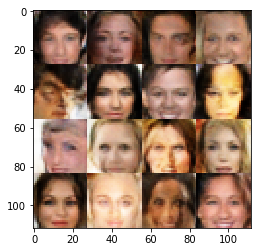

Epoch 2/10... Discriminator Loss: 1.1910... Generator Loss: 0.4913
Epoch 2/10... Discriminator Loss: 0.7783... Generator Loss: 1.0207
Epoch 2/10... Discriminator Loss: 0.5886... Generator Loss: 1.2676
Epoch 2/10... Discriminator Loss: 0.9729... Generator Loss: 0.7530
Epoch 2/10... Discriminator Loss: 1.0492... Generator Loss: 1.6944
Epoch 2/10... Discriminator Loss: 1.0519... Generator Loss: 0.6331
Epoch 2/10... Discriminator Loss: 0.8633... Generator Loss: 0.9328
Epoch 2/10... Discriminator Loss: 0.9678... Generator Loss: 1.6720
Epoch 2/10... Discriminator Loss: 1.0282... Generator Loss: 0.7953
Epoch 2/10... Discriminator Loss: 0.7501... Generator Loss: 1.5113


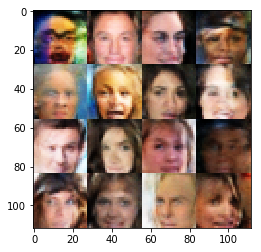

Epoch 2/10... Discriminator Loss: 0.8633... Generator Loss: 0.8757
Epoch 2/10... Discriminator Loss: 0.7799... Generator Loss: 1.0351
Epoch 2/10... Discriminator Loss: 1.0426... Generator Loss: 0.6539
Epoch 2/10... Discriminator Loss: 0.9726... Generator Loss: 1.2676
Epoch 2/10... Discriminator Loss: 0.9449... Generator Loss: 0.6951
Epoch 2/10... Discriminator Loss: 0.8036... Generator Loss: 1.1335
Epoch 2/10... Discriminator Loss: 0.7693... Generator Loss: 1.0697
Epoch 2/10... Discriminator Loss: 1.2437... Generator Loss: 0.4505
Epoch 2/10... Discriminator Loss: 0.4597... Generator Loss: 1.6714
Epoch 2/10... Discriminator Loss: 0.3912... Generator Loss: 2.9363


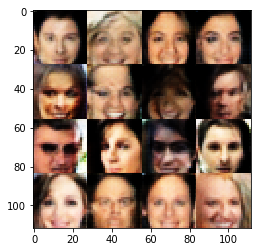

Epoch 2/10... Discriminator Loss: 0.5206... Generator Loss: 1.7613
Epoch 2/10... Discriminator Loss: 0.4297... Generator Loss: 2.5856
Epoch 2/10... Discriminator Loss: 1.0138... Generator Loss: 0.6430
Epoch 3/10... Discriminator Loss: 0.6291... Generator Loss: 1.9963
Epoch 3/10... Discriminator Loss: 0.6120... Generator Loss: 1.1348
Epoch 3/10... Discriminator Loss: 0.8885... Generator Loss: 0.7725
Epoch 3/10... Discriminator Loss: 0.7542... Generator Loss: 0.9870
Epoch 3/10... Discriminator Loss: 0.9643... Generator Loss: 0.7360
Epoch 3/10... Discriminator Loss: 1.1374... Generator Loss: 0.6545
Epoch 3/10... Discriminator Loss: 1.0284... Generator Loss: 1.1235


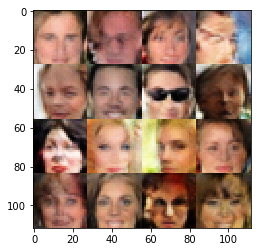

Epoch 3/10... Discriminator Loss: 0.7885... Generator Loss: 1.0929
Epoch 3/10... Discriminator Loss: 1.2064... Generator Loss: 0.5061
Epoch 3/10... Discriminator Loss: 0.8388... Generator Loss: 1.4724
Epoch 3/10... Discriminator Loss: 0.8313... Generator Loss: 0.9487
Epoch 3/10... Discriminator Loss: 1.1471... Generator Loss: 1.3401
Epoch 3/10... Discriminator Loss: 0.8659... Generator Loss: 1.0412
Epoch 3/10... Discriminator Loss: 1.0092... Generator Loss: 0.9547
Epoch 3/10... Discriminator Loss: 0.8180... Generator Loss: 0.9415
Epoch 3/10... Discriminator Loss: 1.5284... Generator Loss: 0.3733
Epoch 3/10... Discriminator Loss: 1.0024... Generator Loss: 0.9110


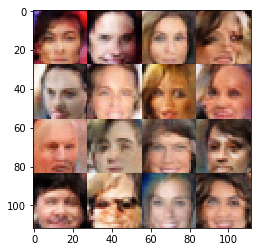

Epoch 3/10... Discriminator Loss: 1.0844... Generator Loss: 0.5975
Epoch 3/10... Discriminator Loss: 0.7497... Generator Loss: 1.0008
Epoch 3/10... Discriminator Loss: 0.9138... Generator Loss: 1.3971
Epoch 3/10... Discriminator Loss: 0.8136... Generator Loss: 0.9294
Epoch 3/10... Discriminator Loss: 0.8534... Generator Loss: 1.0694
Epoch 3/10... Discriminator Loss: 1.1615... Generator Loss: 0.5508
Epoch 3/10... Discriminator Loss: 1.0643... Generator Loss: 0.6021
Epoch 3/10... Discriminator Loss: 1.0512... Generator Loss: 1.4669
Epoch 3/10... Discriminator Loss: 1.1303... Generator Loss: 0.5104
Epoch 3/10... Discriminator Loss: 1.1532... Generator Loss: 0.5781


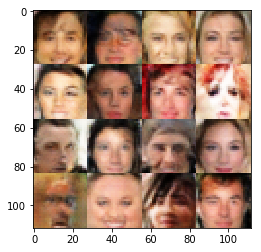

Epoch 3/10... Discriminator Loss: 0.9302... Generator Loss: 0.9290
Epoch 3/10... Discriminator Loss: 0.6483... Generator Loss: 1.4732
Epoch 3/10... Discriminator Loss: 1.2378... Generator Loss: 0.7035
Epoch 3/10... Discriminator Loss: 0.6738... Generator Loss: 1.2476
Epoch 3/10... Discriminator Loss: 1.2295... Generator Loss: 0.9238
Epoch 3/10... Discriminator Loss: 0.9599... Generator Loss: 0.7907
Epoch 3/10... Discriminator Loss: 1.0867... Generator Loss: 0.5942
Epoch 3/10... Discriminator Loss: 1.0603... Generator Loss: 0.7307
Epoch 3/10... Discriminator Loss: 0.6279... Generator Loss: 1.1661
Epoch 3/10... Discriminator Loss: 0.8094... Generator Loss: 1.3801


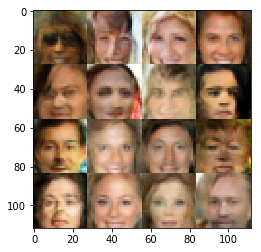

Epoch 3/10... Discriminator Loss: 1.1163... Generator Loss: 0.5676
Epoch 3/10... Discriminator Loss: 1.0799... Generator Loss: 0.7154
Epoch 3/10... Discriminator Loss: 1.2863... Generator Loss: 0.4535
Epoch 3/10... Discriminator Loss: 1.1248... Generator Loss: 0.5908
Epoch 3/10... Discriminator Loss: 0.8061... Generator Loss: 1.1946
Epoch 3/10... Discriminator Loss: 0.9510... Generator Loss: 1.7493
Epoch 3/10... Discriminator Loss: 1.6218... Generator Loss: 0.3092
Epoch 3/10... Discriminator Loss: 1.0715... Generator Loss: 0.9655
Epoch 3/10... Discriminator Loss: 1.0404... Generator Loss: 1.2660
Epoch 3/10... Discriminator Loss: 0.8161... Generator Loss: 1.4232


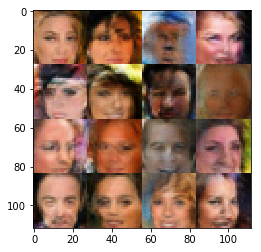

Epoch 3/10... Discriminator Loss: 0.7291... Generator Loss: 1.3365
Epoch 3/10... Discriminator Loss: 1.2617... Generator Loss: 1.4002
Epoch 3/10... Discriminator Loss: 1.0994... Generator Loss: 0.6992
Epoch 3/10... Discriminator Loss: 0.8556... Generator Loss: 1.3162
Epoch 3/10... Discriminator Loss: 1.0779... Generator Loss: 0.5528
Epoch 3/10... Discriminator Loss: 0.9499... Generator Loss: 0.8921
Epoch 3/10... Discriminator Loss: 0.8324... Generator Loss: 1.0659
Epoch 3/10... Discriminator Loss: 1.0674... Generator Loss: 0.7938
Epoch 3/10... Discriminator Loss: 1.3021... Generator Loss: 0.4462
Epoch 3/10... Discriminator Loss: 1.1198... Generator Loss: 0.7998


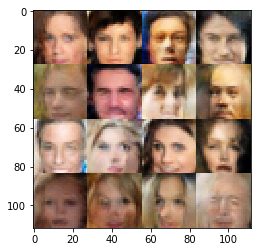

Epoch 3/10... Discriminator Loss: 0.7883... Generator Loss: 1.0748
Epoch 3/10... Discriminator Loss: 1.1290... Generator Loss: 0.6588
Epoch 3/10... Discriminator Loss: 1.0166... Generator Loss: 1.0053
Epoch 3/10... Discriminator Loss: 1.2369... Generator Loss: 0.5335
Epoch 3/10... Discriminator Loss: 0.8510... Generator Loss: 0.9475
Epoch 3/10... Discriminator Loss: 1.0616... Generator Loss: 0.7220
Epoch 3/10... Discriminator Loss: 0.8830... Generator Loss: 0.8288
Epoch 3/10... Discriminator Loss: 1.0890... Generator Loss: 0.5561
Epoch 3/10... Discriminator Loss: 1.1046... Generator Loss: 1.6928
Epoch 3/10... Discriminator Loss: 1.0424... Generator Loss: 0.6642


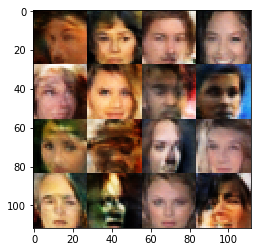

Epoch 3/10... Discriminator Loss: 0.9597... Generator Loss: 1.5126
Epoch 3/10... Discriminator Loss: 1.1881... Generator Loss: 0.5408
Epoch 3/10... Discriminator Loss: 1.1301... Generator Loss: 0.6692
Epoch 3/10... Discriminator Loss: 1.2136... Generator Loss: 0.4982
Epoch 3/10... Discriminator Loss: 1.1187... Generator Loss: 1.0367
Epoch 3/10... Discriminator Loss: 1.0688... Generator Loss: 0.7094
Epoch 3/10... Discriminator Loss: 0.8271... Generator Loss: 1.0903
Epoch 3/10... Discriminator Loss: 0.8951... Generator Loss: 0.9505
Epoch 3/10... Discriminator Loss: 1.2473... Generator Loss: 0.8760
Epoch 3/10... Discriminator Loss: 0.8927... Generator Loss: 0.9033


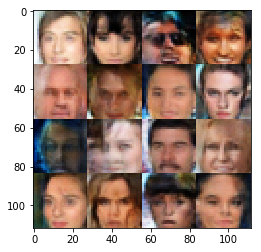

Epoch 3/10... Discriminator Loss: 0.9391... Generator Loss: 0.8632
Epoch 3/10... Discriminator Loss: 0.9011... Generator Loss: 0.8960
Epoch 3/10... Discriminator Loss: 1.1624... Generator Loss: 0.8016
Epoch 3/10... Discriminator Loss: 0.8193... Generator Loss: 1.1898
Epoch 3/10... Discriminator Loss: 1.1238... Generator Loss: 0.6378
Epoch 3/10... Discriminator Loss: 1.1486... Generator Loss: 0.5055
Epoch 3/10... Discriminator Loss: 1.5273... Generator Loss: 0.3309
Epoch 3/10... Discriminator Loss: 0.8484... Generator Loss: 0.8510
Epoch 3/10... Discriminator Loss: 1.2483... Generator Loss: 0.5089
Epoch 3/10... Discriminator Loss: 1.1270... Generator Loss: 0.6467


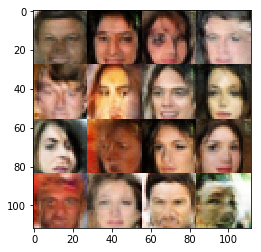

Epoch 3/10... Discriminator Loss: 0.8875... Generator Loss: 1.2193
Epoch 3/10... Discriminator Loss: 1.2620... Generator Loss: 1.3850
Epoch 3/10... Discriminator Loss: 1.3504... Generator Loss: 0.4224
Epoch 3/10... Discriminator Loss: 1.2194... Generator Loss: 0.5471
Epoch 3/10... Discriminator Loss: 0.8887... Generator Loss: 0.9749
Epoch 3/10... Discriminator Loss: 0.8365... Generator Loss: 1.1040
Epoch 3/10... Discriminator Loss: 1.0559... Generator Loss: 1.0601
Epoch 3/10... Discriminator Loss: 0.8010... Generator Loss: 1.0585
Epoch 3/10... Discriminator Loss: 1.0148... Generator Loss: 0.8621
Epoch 3/10... Discriminator Loss: 0.9118... Generator Loss: 1.6172


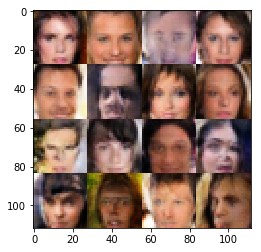

Epoch 3/10... Discriminator Loss: 1.2311... Generator Loss: 0.5036
Epoch 3/10... Discriminator Loss: 0.9527... Generator Loss: 1.3561
Epoch 3/10... Discriminator Loss: 0.9282... Generator Loss: 0.8316
Epoch 3/10... Discriminator Loss: 1.0545... Generator Loss: 0.7615
Epoch 3/10... Discriminator Loss: 0.9077... Generator Loss: 0.7737
Epoch 3/10... Discriminator Loss: 1.2323... Generator Loss: 0.5036
Epoch 3/10... Discriminator Loss: 1.0749... Generator Loss: 0.7015
Epoch 3/10... Discriminator Loss: 1.2081... Generator Loss: 0.7019
Epoch 3/10... Discriminator Loss: 0.6932... Generator Loss: 0.9388
Epoch 3/10... Discriminator Loss: 0.6516... Generator Loss: 1.0893


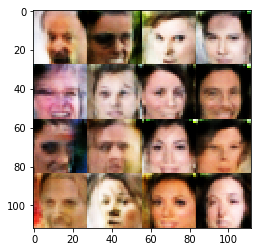

Epoch 3/10... Discriminator Loss: 0.9061... Generator Loss: 1.0579
Epoch 3/10... Discriminator Loss: 1.0392... Generator Loss: 0.7653
Epoch 3/10... Discriminator Loss: 0.7586... Generator Loss: 1.0366
Epoch 3/10... Discriminator Loss: 1.0703... Generator Loss: 0.9701
Epoch 3/10... Discriminator Loss: 0.7627... Generator Loss: 0.9310
Epoch 3/10... Discriminator Loss: 0.9725... Generator Loss: 0.6660
Epoch 3/10... Discriminator Loss: 0.8770... Generator Loss: 1.1340
Epoch 3/10... Discriminator Loss: 0.7108... Generator Loss: 1.3316
Epoch 3/10... Discriminator Loss: 0.8318... Generator Loss: 0.8573
Epoch 3/10... Discriminator Loss: 0.7676... Generator Loss: 0.9137


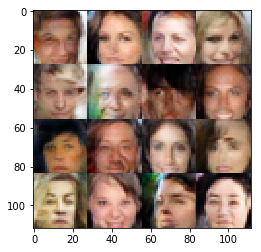

Epoch 3/10... Discriminator Loss: 1.1482... Generator Loss: 1.1327
Epoch 3/10... Discriminator Loss: 1.0700... Generator Loss: 1.0631
Epoch 3/10... Discriminator Loss: 1.1782... Generator Loss: 0.5161
Epoch 3/10... Discriminator Loss: 0.9131... Generator Loss: 1.0084
Epoch 3/10... Discriminator Loss: 1.0705... Generator Loss: 0.6573
Epoch 3/10... Discriminator Loss: 0.8143... Generator Loss: 1.1154
Epoch 3/10... Discriminator Loss: 1.1374... Generator Loss: 0.5494
Epoch 3/10... Discriminator Loss: 0.9692... Generator Loss: 1.0090
Epoch 3/10... Discriminator Loss: 0.8843... Generator Loss: 1.5746
Epoch 3/10... Discriminator Loss: 0.9899... Generator Loss: 0.7199


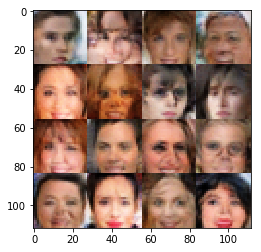

Epoch 3/10... Discriminator Loss: 1.0680... Generator Loss: 0.6443
Epoch 3/10... Discriminator Loss: 0.7668... Generator Loss: 1.1671
Epoch 3/10... Discriminator Loss: 1.1346... Generator Loss: 0.9074
Epoch 3/10... Discriminator Loss: 1.0550... Generator Loss: 0.7819
Epoch 3/10... Discriminator Loss: 1.1547... Generator Loss: 0.5991
Epoch 3/10... Discriminator Loss: 1.0209... Generator Loss: 1.0460
Epoch 3/10... Discriminator Loss: 0.6936... Generator Loss: 1.3624
Epoch 3/10... Discriminator Loss: 1.0608... Generator Loss: 0.6298
Epoch 3/10... Discriminator Loss: 0.7527... Generator Loss: 1.2262
Epoch 3/10... Discriminator Loss: 0.9591... Generator Loss: 0.9003


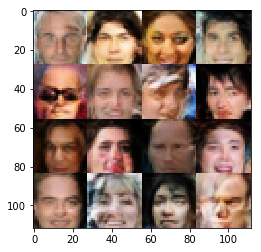

Epoch 3/10... Discriminator Loss: 1.0385... Generator Loss: 0.9794
Epoch 3/10... Discriminator Loss: 1.0687... Generator Loss: 1.9876
Epoch 3/10... Discriminator Loss: 1.2041... Generator Loss: 1.1193
Epoch 3/10... Discriminator Loss: 1.5808... Generator Loss: 0.3221
Epoch 3/10... Discriminator Loss: 0.9190... Generator Loss: 0.8569
Epoch 3/10... Discriminator Loss: 1.2982... Generator Loss: 0.5104
Epoch 3/10... Discriminator Loss: 0.9845... Generator Loss: 0.8497
Epoch 3/10... Discriminator Loss: 0.9107... Generator Loss: 0.7866
Epoch 3/10... Discriminator Loss: 0.9410... Generator Loss: 0.9391
Epoch 3/10... Discriminator Loss: 0.8903... Generator Loss: 1.5531


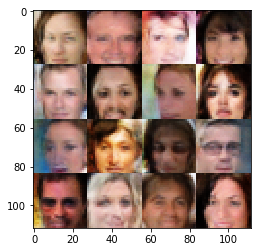

Epoch 3/10... Discriminator Loss: 1.2899... Generator Loss: 0.4376
Epoch 3/10... Discriminator Loss: 1.2357... Generator Loss: 0.4922
Epoch 3/10... Discriminator Loss: 0.8844... Generator Loss: 1.2836
Epoch 3/10... Discriminator Loss: 0.7546... Generator Loss: 1.7601
Epoch 3/10... Discriminator Loss: 1.0667... Generator Loss: 1.0619
Epoch 3/10... Discriminator Loss: 1.1777... Generator Loss: 0.5091
Epoch 3/10... Discriminator Loss: 0.7272... Generator Loss: 1.0099
Epoch 3/10... Discriminator Loss: 0.9354... Generator Loss: 0.7295
Epoch 3/10... Discriminator Loss: 1.1255... Generator Loss: 1.1153
Epoch 3/10... Discriminator Loss: 1.2748... Generator Loss: 1.6254


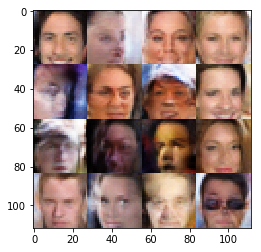

Epoch 3/10... Discriminator Loss: 0.9375... Generator Loss: 0.7226
Epoch 3/10... Discriminator Loss: 1.1584... Generator Loss: 1.0252
Epoch 3/10... Discriminator Loss: 1.1969... Generator Loss: 1.3707
Epoch 3/10... Discriminator Loss: 1.1072... Generator Loss: 0.5371
Epoch 3/10... Discriminator Loss: 1.1125... Generator Loss: 1.7707
Epoch 3/10... Discriminator Loss: 1.0692... Generator Loss: 0.6927
Epoch 3/10... Discriminator Loss: 1.0418... Generator Loss: 0.6474
Epoch 3/10... Discriminator Loss: 1.1852... Generator Loss: 0.7355
Epoch 3/10... Discriminator Loss: 1.0253... Generator Loss: 0.7659
Epoch 3/10... Discriminator Loss: 0.9568... Generator Loss: 1.1207


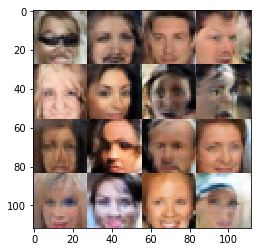

Epoch 3/10... Discriminator Loss: 1.0251... Generator Loss: 0.9427
Epoch 3/10... Discriminator Loss: 1.7228... Generator Loss: 0.2627
Epoch 3/10... Discriminator Loss: 1.1044... Generator Loss: 1.1655
Epoch 3/10... Discriminator Loss: 0.8079... Generator Loss: 1.3645
Epoch 3/10... Discriminator Loss: 0.9147... Generator Loss: 0.7569
Epoch 3/10... Discriminator Loss: 0.8415... Generator Loss: 1.6176
Epoch 3/10... Discriminator Loss: 0.9511... Generator Loss: 0.9741
Epoch 3/10... Discriminator Loss: 1.2260... Generator Loss: 1.6610
Epoch 3/10... Discriminator Loss: 1.0573... Generator Loss: 0.7167
Epoch 3/10... Discriminator Loss: 0.7972... Generator Loss: 1.4848


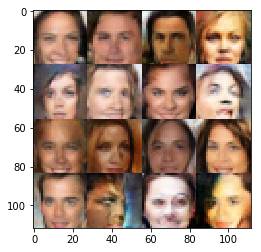

Epoch 3/10... Discriminator Loss: 1.0860... Generator Loss: 0.6321
Epoch 3/10... Discriminator Loss: 1.0665... Generator Loss: 0.6378
Epoch 3/10... Discriminator Loss: 1.2391... Generator Loss: 0.5171
Epoch 3/10... Discriminator Loss: 1.0249... Generator Loss: 1.0096
Epoch 3/10... Discriminator Loss: 1.1356... Generator Loss: 0.6300
Epoch 3/10... Discriminator Loss: 0.9201... Generator Loss: 1.1418
Epoch 3/10... Discriminator Loss: 0.8790... Generator Loss: 0.7611
Epoch 3/10... Discriminator Loss: 1.0395... Generator Loss: 0.6383
Epoch 3/10... Discriminator Loss: 1.1222... Generator Loss: 0.7240
Epoch 3/10... Discriminator Loss: 1.2748... Generator Loss: 0.4185


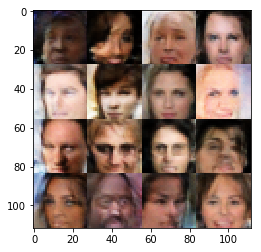

Epoch 3/10... Discriminator Loss: 1.3184... Generator Loss: 0.4213
Epoch 3/10... Discriminator Loss: 0.9155... Generator Loss: 0.7691
Epoch 3/10... Discriminator Loss: 0.7325... Generator Loss: 1.2012
Epoch 3/10... Discriminator Loss: 0.7782... Generator Loss: 1.5929
Epoch 3/10... Discriminator Loss: 0.8527... Generator Loss: 0.9226
Epoch 3/10... Discriminator Loss: 0.9526... Generator Loss: 0.9839
Epoch 3/10... Discriminator Loss: 0.8727... Generator Loss: 1.7288
Epoch 3/10... Discriminator Loss: 0.9470... Generator Loss: 0.8777
Epoch 3/10... Discriminator Loss: 0.9633... Generator Loss: 0.9163
Epoch 3/10... Discriminator Loss: 1.0118... Generator Loss: 0.6624


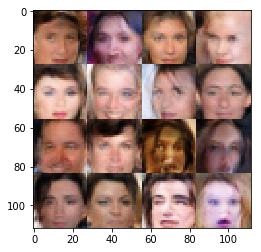

Epoch 3/10... Discriminator Loss: 0.7384... Generator Loss: 1.1112
Epoch 3/10... Discriminator Loss: 0.7901... Generator Loss: 1.5874
Epoch 3/10... Discriminator Loss: 0.9761... Generator Loss: 0.9458
Epoch 3/10... Discriminator Loss: 0.8987... Generator Loss: 0.8164
Epoch 3/10... Discriminator Loss: 1.1536... Generator Loss: 0.5946
Epoch 3/10... Discriminator Loss: 0.9007... Generator Loss: 1.3278
Epoch 3/10... Discriminator Loss: 0.9688... Generator Loss: 0.7272
Epoch 3/10... Discriminator Loss: 0.7059... Generator Loss: 1.3862
Epoch 3/10... Discriminator Loss: 0.8918... Generator Loss: 0.9102
Epoch 3/10... Discriminator Loss: 1.1548... Generator Loss: 0.5497


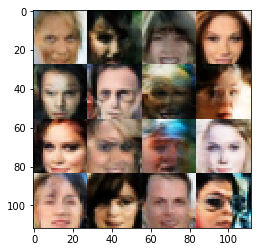

Epoch 3/10... Discriminator Loss: 1.2712... Generator Loss: 1.1082
Epoch 3/10... Discriminator Loss: 1.3665... Generator Loss: 0.9121
Epoch 3/10... Discriminator Loss: 0.5957... Generator Loss: 1.1020
Epoch 3/10... Discriminator Loss: 1.1818... Generator Loss: 0.5002
Epoch 3/10... Discriminator Loss: 0.9896... Generator Loss: 0.7329
Epoch 3/10... Discriminator Loss: 1.0449... Generator Loss: 0.6098
Epoch 3/10... Discriminator Loss: 1.0359... Generator Loss: 0.7273
Epoch 3/10... Discriminator Loss: 0.9201... Generator Loss: 0.8251
Epoch 3/10... Discriminator Loss: 1.1885... Generator Loss: 0.5295
Epoch 3/10... Discriminator Loss: 0.8356... Generator Loss: 0.9708


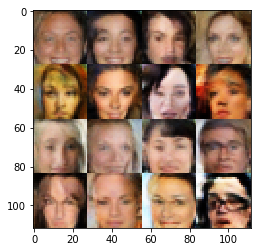

Epoch 3/10... Discriminator Loss: 1.0375... Generator Loss: 0.6411
Epoch 3/10... Discriminator Loss: 1.1845... Generator Loss: 1.1877
Epoch 3/10... Discriminator Loss: 1.1270... Generator Loss: 1.6162
Epoch 3/10... Discriminator Loss: 1.0371... Generator Loss: 0.6464
Epoch 3/10... Discriminator Loss: 1.0245... Generator Loss: 0.8102
Epoch 3/10... Discriminator Loss: 1.0422... Generator Loss: 1.3160
Epoch 3/10... Discriminator Loss: 1.1377... Generator Loss: 0.9173
Epoch 3/10... Discriminator Loss: 0.8536... Generator Loss: 0.9701
Epoch 3/10... Discriminator Loss: 0.8144... Generator Loss: 1.0775
Epoch 3/10... Discriminator Loss: 1.0399... Generator Loss: 0.6620


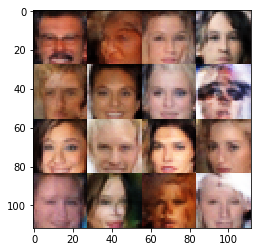

Epoch 3/10... Discriminator Loss: 1.0329... Generator Loss: 0.8813
Epoch 3/10... Discriminator Loss: 0.8800... Generator Loss: 0.8698
Epoch 3/10... Discriminator Loss: 0.5639... Generator Loss: 2.2606
Epoch 3/10... Discriminator Loss: 1.1103... Generator Loss: 0.5850
Epoch 3/10... Discriminator Loss: 0.9995... Generator Loss: 0.6696
Epoch 3/10... Discriminator Loss: 0.9004... Generator Loss: 0.9329
Epoch 3/10... Discriminator Loss: 0.9904... Generator Loss: 0.6967
Epoch 3/10... Discriminator Loss: 0.8947... Generator Loss: 1.1475
Epoch 3/10... Discriminator Loss: 0.8522... Generator Loss: 0.8393
Epoch 3/10... Discriminator Loss: 0.9534... Generator Loss: 1.1408


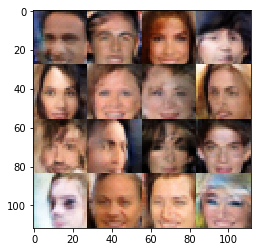

Epoch 3/10... Discriminator Loss: 1.0733... Generator Loss: 0.6459
Epoch 3/10... Discriminator Loss: 1.0317... Generator Loss: 0.6490
Epoch 3/10... Discriminator Loss: 0.7161... Generator Loss: 1.2066
Epoch 3/10... Discriminator Loss: 0.9618... Generator Loss: 1.1600
Epoch 3/10... Discriminator Loss: 0.9173... Generator Loss: 0.8879
Epoch 3/10... Discriminator Loss: 0.8435... Generator Loss: 0.9212
Epoch 3/10... Discriminator Loss: 0.7680... Generator Loss: 0.9928
Epoch 3/10... Discriminator Loss: 0.7369... Generator Loss: 1.4146
Epoch 3/10... Discriminator Loss: 0.9683... Generator Loss: 0.8278
Epoch 3/10... Discriminator Loss: 1.1126... Generator Loss: 0.6673


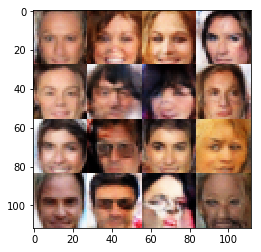

Epoch 3/10... Discriminator Loss: 0.9592... Generator Loss: 0.7488
Epoch 3/10... Discriminator Loss: 0.8708... Generator Loss: 1.0696
Epoch 3/10... Discriminator Loss: 1.1611... Generator Loss: 0.5403
Epoch 3/10... Discriminator Loss: 1.0861... Generator Loss: 0.6207
Epoch 3/10... Discriminator Loss: 1.0063... Generator Loss: 0.9290
Epoch 3/10... Discriminator Loss: 0.9463... Generator Loss: 1.2158
Epoch 3/10... Discriminator Loss: 0.9368... Generator Loss: 0.7677
Epoch 3/10... Discriminator Loss: 1.2837... Generator Loss: 1.2081
Epoch 3/10... Discriminator Loss: 0.9442... Generator Loss: 0.7700
Epoch 3/10... Discriminator Loss: 1.0477... Generator Loss: 0.7296


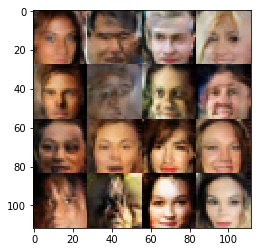

Epoch 3/10... Discriminator Loss: 1.3111... Generator Loss: 0.4249
Epoch 3/10... Discriminator Loss: 1.0614... Generator Loss: 1.5906
Epoch 3/10... Discriminator Loss: 1.8870... Generator Loss: 0.2456
Epoch 3/10... Discriminator Loss: 1.1161... Generator Loss: 0.6755
Epoch 3/10... Discriminator Loss: 0.9792... Generator Loss: 1.0353
Epoch 3/10... Discriminator Loss: 0.9802... Generator Loss: 0.8590
Epoch 3/10... Discriminator Loss: 1.1252... Generator Loss: 0.5785
Epoch 3/10... Discriminator Loss: 1.0472... Generator Loss: 0.6670
Epoch 3/10... Discriminator Loss: 0.9724... Generator Loss: 0.7914
Epoch 3/10... Discriminator Loss: 0.9039... Generator Loss: 0.8139


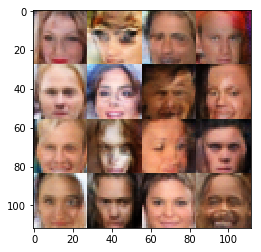

Epoch 3/10... Discriminator Loss: 1.1814... Generator Loss: 0.5113
Epoch 3/10... Discriminator Loss: 0.9453... Generator Loss: 0.8692
Epoch 3/10... Discriminator Loss: 0.9371... Generator Loss: 1.0313
Epoch 3/10... Discriminator Loss: 1.0529... Generator Loss: 0.6879
Epoch 3/10... Discriminator Loss: 1.1365... Generator Loss: 0.6207
Epoch 3/10... Discriminator Loss: 0.9967... Generator Loss: 1.0430
Epoch 3/10... Discriminator Loss: 0.8820... Generator Loss: 0.9668
Epoch 3/10... Discriminator Loss: 1.1616... Generator Loss: 0.5425
Epoch 3/10... Discriminator Loss: 0.9255... Generator Loss: 1.2844
Epoch 3/10... Discriminator Loss: 1.1088... Generator Loss: 0.6941


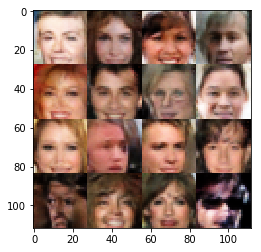

Epoch 3/10... Discriminator Loss: 0.8808... Generator Loss: 1.6411
Epoch 3/10... Discriminator Loss: 1.0991... Generator Loss: 0.5888
Epoch 3/10... Discriminator Loss: 0.9436... Generator Loss: 1.1573
Epoch 3/10... Discriminator Loss: 1.1915... Generator Loss: 0.5544
Epoch 3/10... Discriminator Loss: 0.9861... Generator Loss: 0.8524
Epoch 3/10... Discriminator Loss: 1.0408... Generator Loss: 0.5864
Epoch 3/10... Discriminator Loss: 1.1874... Generator Loss: 0.7973
Epoch 3/10... Discriminator Loss: 1.0213... Generator Loss: 0.6866
Epoch 3/10... Discriminator Loss: 1.0763... Generator Loss: 0.6384
Epoch 3/10... Discriminator Loss: 0.9880... Generator Loss: 1.5264


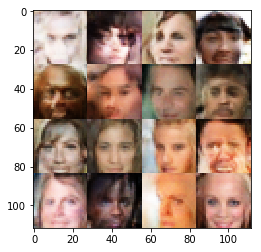

Epoch 3/10... Discriminator Loss: 0.8456... Generator Loss: 0.8609
Epoch 3/10... Discriminator Loss: 1.0309... Generator Loss: 0.6600
Epoch 3/10... Discriminator Loss: 1.1169... Generator Loss: 1.1052
Epoch 3/10... Discriminator Loss: 1.1101... Generator Loss: 0.6133
Epoch 3/10... Discriminator Loss: 0.8817... Generator Loss: 1.1094
Epoch 3/10... Discriminator Loss: 1.2199... Generator Loss: 0.4983
Epoch 3/10... Discriminator Loss: 0.9877... Generator Loss: 0.6368
Epoch 3/10... Discriminator Loss: 1.0817... Generator Loss: 0.7990
Epoch 3/10... Discriminator Loss: 0.9060... Generator Loss: 0.7649
Epoch 3/10... Discriminator Loss: 0.9023... Generator Loss: 0.9993


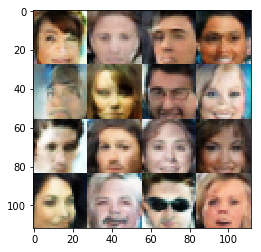

Epoch 3/10... Discriminator Loss: 1.2330... Generator Loss: 0.4960
Epoch 3/10... Discriminator Loss: 1.0083... Generator Loss: 0.9248
Epoch 3/10... Discriminator Loss: 1.1835... Generator Loss: 0.5473
Epoch 3/10... Discriminator Loss: 1.3110... Generator Loss: 1.2484
Epoch 3/10... Discriminator Loss: 0.9757... Generator Loss: 0.7892
Epoch 3/10... Discriminator Loss: 1.0522... Generator Loss: 1.6101
Epoch 3/10... Discriminator Loss: 1.1006... Generator Loss: 0.6154
Epoch 3/10... Discriminator Loss: 0.8802... Generator Loss: 0.8432
Epoch 3/10... Discriminator Loss: 1.0065... Generator Loss: 0.8662
Epoch 3/10... Discriminator Loss: 0.7683... Generator Loss: 1.4365


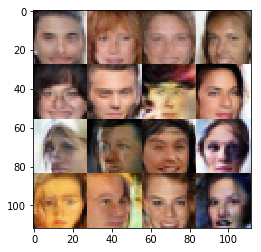

Epoch 3/10... Discriminator Loss: 0.8460... Generator Loss: 1.1564
Epoch 3/10... Discriminator Loss: 0.8898... Generator Loss: 0.9079
Epoch 3/10... Discriminator Loss: 1.2432... Generator Loss: 0.4810
Epoch 3/10... Discriminator Loss: 1.0722... Generator Loss: 1.2576
Epoch 3/10... Discriminator Loss: 1.2531... Generator Loss: 0.4834
Epoch 3/10... Discriminator Loss: 0.8030... Generator Loss: 1.2681
Epoch 3/10... Discriminator Loss: 0.7669... Generator Loss: 1.3898
Epoch 3/10... Discriminator Loss: 1.2572... Generator Loss: 0.4812
Epoch 3/10... Discriminator Loss: 1.2083... Generator Loss: 0.5807
Epoch 4/10... Discriminator Loss: 1.0657... Generator Loss: 0.7105


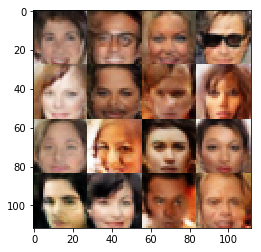

Epoch 4/10... Discriminator Loss: 0.9759... Generator Loss: 0.8191
Epoch 4/10... Discriminator Loss: 1.2490... Generator Loss: 0.5105
Epoch 4/10... Discriminator Loss: 0.7943... Generator Loss: 0.9934
Epoch 4/10... Discriminator Loss: 0.8338... Generator Loss: 1.1615
Epoch 4/10... Discriminator Loss: 0.9764... Generator Loss: 0.9760
Epoch 4/10... Discriminator Loss: 1.0952... Generator Loss: 0.8072
Epoch 4/10... Discriminator Loss: 1.1187... Generator Loss: 0.6612
Epoch 4/10... Discriminator Loss: 1.3173... Generator Loss: 0.4388
Epoch 4/10... Discriminator Loss: 0.8241... Generator Loss: 1.2423
Epoch 4/10... Discriminator Loss: 1.1134... Generator Loss: 0.5598


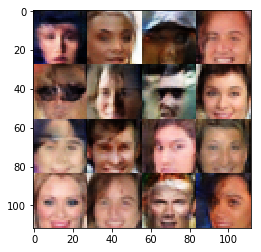

Epoch 4/10... Discriminator Loss: 0.7760... Generator Loss: 1.2021
Epoch 4/10... Discriminator Loss: 0.8883... Generator Loss: 1.5850
Epoch 4/10... Discriminator Loss: 1.2711... Generator Loss: 0.6158
Epoch 4/10... Discriminator Loss: 1.1792... Generator Loss: 0.5558
Epoch 4/10... Discriminator Loss: 1.1473... Generator Loss: 0.6204
Epoch 4/10... Discriminator Loss: 1.1449... Generator Loss: 0.9520
Epoch 4/10... Discriminator Loss: 1.1694... Generator Loss: 0.8268
Epoch 4/10... Discriminator Loss: 1.0140... Generator Loss: 1.1650
Epoch 4/10... Discriminator Loss: 0.9831... Generator Loss: 0.8899
Epoch 4/10... Discriminator Loss: 0.9456... Generator Loss: 1.1629


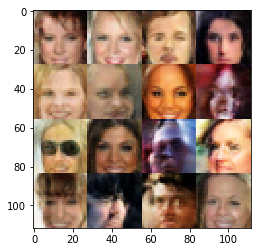

Epoch 4/10... Discriminator Loss: 0.8502... Generator Loss: 0.8638
Epoch 4/10... Discriminator Loss: 0.8702... Generator Loss: 0.8134
Epoch 4/10... Discriminator Loss: 1.0103... Generator Loss: 0.7658
Epoch 4/10... Discriminator Loss: 0.9335... Generator Loss: 0.7779
Epoch 4/10... Discriminator Loss: 0.8697... Generator Loss: 0.8725
Epoch 4/10... Discriminator Loss: 1.0388... Generator Loss: 0.6640
Epoch 4/10... Discriminator Loss: 0.9468... Generator Loss: 0.7868
Epoch 4/10... Discriminator Loss: 0.9005... Generator Loss: 1.1595
Epoch 4/10... Discriminator Loss: 0.9901... Generator Loss: 0.8485
Epoch 4/10... Discriminator Loss: 1.0647... Generator Loss: 0.7522


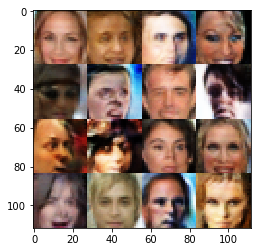

Epoch 4/10... Discriminator Loss: 1.0807... Generator Loss: 0.6123
Epoch 4/10... Discriminator Loss: 1.2379... Generator Loss: 0.4740
Epoch 4/10... Discriminator Loss: 1.7848... Generator Loss: 0.2484
Epoch 4/10... Discriminator Loss: 0.7237... Generator Loss: 1.0132
Epoch 4/10... Discriminator Loss: 1.0301... Generator Loss: 0.7421
Epoch 4/10... Discriminator Loss: 1.2093... Generator Loss: 0.4672
Epoch 4/10... Discriminator Loss: 0.9537... Generator Loss: 1.1514
Epoch 4/10... Discriminator Loss: 0.8193... Generator Loss: 1.0981
Epoch 4/10... Discriminator Loss: 0.8403... Generator Loss: 0.8689
Epoch 4/10... Discriminator Loss: 1.0171... Generator Loss: 0.7002


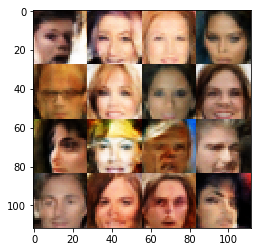

Epoch 4/10... Discriminator Loss: 0.8916... Generator Loss: 0.8984
Epoch 4/10... Discriminator Loss: 1.2035... Generator Loss: 0.4891
Epoch 4/10... Discriminator Loss: 0.8282... Generator Loss: 0.9050
Epoch 4/10... Discriminator Loss: 0.7092... Generator Loss: 1.0501
Epoch 4/10... Discriminator Loss: 0.8036... Generator Loss: 1.2533
Epoch 4/10... Discriminator Loss: 1.2042... Generator Loss: 0.4774
Epoch 4/10... Discriminator Loss: 0.6358... Generator Loss: 1.2215
Epoch 4/10... Discriminator Loss: 0.9547... Generator Loss: 0.9202
Epoch 4/10... Discriminator Loss: 1.7079... Generator Loss: 0.2995
Epoch 4/10... Discriminator Loss: 1.1944... Generator Loss: 0.8800


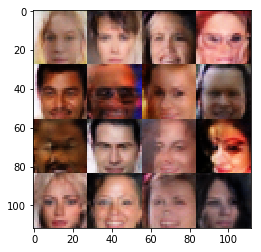

Epoch 4/10... Discriminator Loss: 0.8961... Generator Loss: 1.4715
Epoch 4/10... Discriminator Loss: 0.8692... Generator Loss: 1.0410
Epoch 4/10... Discriminator Loss: 0.8348... Generator Loss: 1.0436
Epoch 4/10... Discriminator Loss: 0.8274... Generator Loss: 1.1111
Epoch 4/10... Discriminator Loss: 1.1839... Generator Loss: 0.6759
Epoch 4/10... Discriminator Loss: 1.1545... Generator Loss: 0.6011
Epoch 4/10... Discriminator Loss: 0.8467... Generator Loss: 1.2089
Epoch 4/10... Discriminator Loss: 0.9884... Generator Loss: 0.7408
Epoch 4/10... Discriminator Loss: 0.9532... Generator Loss: 0.8553
Epoch 4/10... Discriminator Loss: 1.0825... Generator Loss: 0.5924


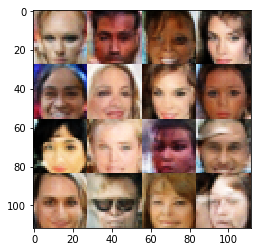

Epoch 4/10... Discriminator Loss: 1.1358... Generator Loss: 0.5742
Epoch 4/10... Discriminator Loss: 1.1262... Generator Loss: 0.5921
Epoch 4/10... Discriminator Loss: 0.9315... Generator Loss: 0.7197
Epoch 4/10... Discriminator Loss: 1.3697... Generator Loss: 1.0978
Epoch 4/10... Discriminator Loss: 0.9771... Generator Loss: 1.0738
Epoch 4/10... Discriminator Loss: 1.1987... Generator Loss: 0.5272
Epoch 4/10... Discriminator Loss: 0.9318... Generator Loss: 0.8615
Epoch 4/10... Discriminator Loss: 1.1136... Generator Loss: 0.5534
Epoch 4/10... Discriminator Loss: 1.0179... Generator Loss: 0.8756
Epoch 4/10... Discriminator Loss: 0.8294... Generator Loss: 1.3851


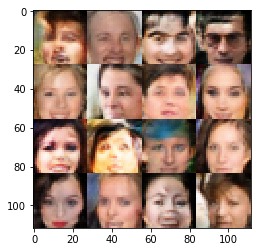

Epoch 4/10... Discriminator Loss: 0.8733... Generator Loss: 1.1067
Epoch 4/10... Discriminator Loss: 0.9894... Generator Loss: 0.7716
Epoch 4/10... Discriminator Loss: 0.9190... Generator Loss: 0.9614
Epoch 4/10... Discriminator Loss: 1.0129... Generator Loss: 0.6569
Epoch 4/10... Discriminator Loss: 0.8386... Generator Loss: 0.9141
Epoch 4/10... Discriminator Loss: 0.8325... Generator Loss: 0.9270
Epoch 4/10... Discriminator Loss: 0.7747... Generator Loss: 1.4163
Epoch 4/10... Discriminator Loss: 1.0823... Generator Loss: 1.7636
Epoch 4/10... Discriminator Loss: 0.9790... Generator Loss: 0.7596
Epoch 4/10... Discriminator Loss: 1.0204... Generator Loss: 0.9360


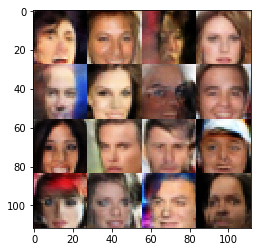

Epoch 4/10... Discriminator Loss: 1.0192... Generator Loss: 0.9229
Epoch 4/10... Discriminator Loss: 1.0565... Generator Loss: 0.8893
Epoch 4/10... Discriminator Loss: 0.7546... Generator Loss: 1.2364
Epoch 4/10... Discriminator Loss: 1.0149... Generator Loss: 0.9158
Epoch 4/10... Discriminator Loss: 0.9129... Generator Loss: 0.8318
Epoch 4/10... Discriminator Loss: 0.8617... Generator Loss: 1.0208
Epoch 4/10... Discriminator Loss: 1.0505... Generator Loss: 0.7290
Epoch 4/10... Discriminator Loss: 1.0944... Generator Loss: 0.6150
Epoch 4/10... Discriminator Loss: 1.2448... Generator Loss: 0.5997
Epoch 4/10... Discriminator Loss: 0.9229... Generator Loss: 0.9627


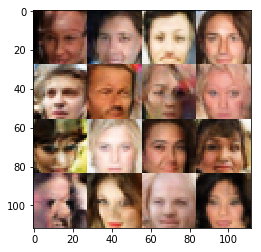

Epoch 4/10... Discriminator Loss: 0.7565... Generator Loss: 1.4082
Epoch 4/10... Discriminator Loss: 1.1131... Generator Loss: 0.6426
Epoch 4/10... Discriminator Loss: 1.2546... Generator Loss: 1.9373
Epoch 4/10... Discriminator Loss: 0.8299... Generator Loss: 1.0165
Epoch 4/10... Discriminator Loss: 1.0385... Generator Loss: 0.7459
Epoch 4/10... Discriminator Loss: 1.0052... Generator Loss: 0.7421
Epoch 4/10... Discriminator Loss: 0.9426... Generator Loss: 0.9695
Epoch 4/10... Discriminator Loss: 0.9302... Generator Loss: 1.0352
Epoch 4/10... Discriminator Loss: 1.3520... Generator Loss: 0.6949
Epoch 4/10... Discriminator Loss: 0.9687... Generator Loss: 0.7389


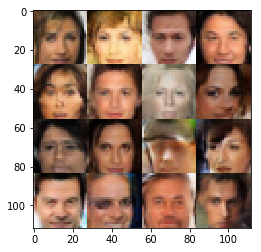

Epoch 4/10... Discriminator Loss: 1.6043... Generator Loss: 0.2937
Epoch 4/10... Discriminator Loss: 1.1846... Generator Loss: 0.5804
Epoch 4/10... Discriminator Loss: 0.8159... Generator Loss: 0.9340
Epoch 4/10... Discriminator Loss: 1.0159... Generator Loss: 0.9458
Epoch 4/10... Discriminator Loss: 0.9799... Generator Loss: 1.1658
Epoch 4/10... Discriminator Loss: 0.8225... Generator Loss: 1.0781
Epoch 4/10... Discriminator Loss: 0.6653... Generator Loss: 1.1967
Epoch 4/10... Discriminator Loss: 0.8383... Generator Loss: 1.1129
Epoch 4/10... Discriminator Loss: 1.1880... Generator Loss: 0.5284
Epoch 4/10... Discriminator Loss: 0.7816... Generator Loss: 1.3174


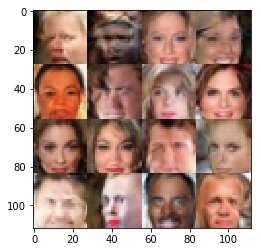

Epoch 4/10... Discriminator Loss: 0.8952... Generator Loss: 1.1911
Epoch 4/10... Discriminator Loss: 0.8263... Generator Loss: 1.1403
Epoch 4/10... Discriminator Loss: 1.0649... Generator Loss: 0.6848
Epoch 4/10... Discriminator Loss: 1.2111... Generator Loss: 0.4964
Epoch 4/10... Discriminator Loss: 1.2666... Generator Loss: 0.4334
Epoch 4/10... Discriminator Loss: 0.9723... Generator Loss: 0.7510
Epoch 4/10... Discriminator Loss: 1.1356... Generator Loss: 0.6246
Epoch 4/10... Discriminator Loss: 1.2039... Generator Loss: 0.9452
Epoch 4/10... Discriminator Loss: 0.9967... Generator Loss: 1.4151
Epoch 4/10... Discriminator Loss: 0.9089... Generator Loss: 1.3379


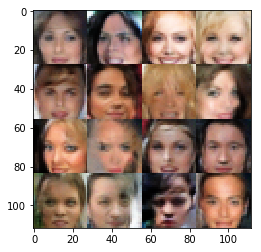

Epoch 4/10... Discriminator Loss: 0.9101... Generator Loss: 1.2259
Epoch 4/10... Discriminator Loss: 0.8685... Generator Loss: 1.1296
Epoch 4/10... Discriminator Loss: 0.9009... Generator Loss: 0.9204
Epoch 4/10... Discriminator Loss: 1.0498... Generator Loss: 0.6742
Epoch 4/10... Discriminator Loss: 0.9485... Generator Loss: 0.6880
Epoch 4/10... Discriminator Loss: 1.0176... Generator Loss: 0.8392
Epoch 4/10... Discriminator Loss: 1.1827... Generator Loss: 0.5530
Epoch 4/10... Discriminator Loss: 1.4421... Generator Loss: 1.6642
Epoch 4/10... Discriminator Loss: 0.8550... Generator Loss: 0.8472
Epoch 4/10... Discriminator Loss: 1.0949... Generator Loss: 1.7427


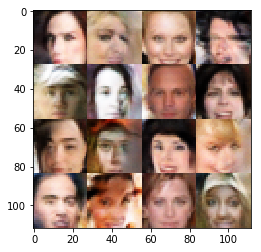

Epoch 4/10... Discriminator Loss: 0.9339... Generator Loss: 1.1991
Epoch 4/10... Discriminator Loss: 1.1877... Generator Loss: 0.9784
Epoch 4/10... Discriminator Loss: 1.0794... Generator Loss: 0.6783
Epoch 4/10... Discriminator Loss: 1.1252... Generator Loss: 0.5322
Epoch 4/10... Discriminator Loss: 1.0231... Generator Loss: 0.8621
Epoch 4/10... Discriminator Loss: 0.8978... Generator Loss: 0.9003
Epoch 4/10... Discriminator Loss: 1.0012... Generator Loss: 0.6900
Epoch 4/10... Discriminator Loss: 0.9674... Generator Loss: 0.7682
Epoch 4/10... Discriminator Loss: 1.1921... Generator Loss: 0.4719
Epoch 4/10... Discriminator Loss: 1.2773... Generator Loss: 0.5117


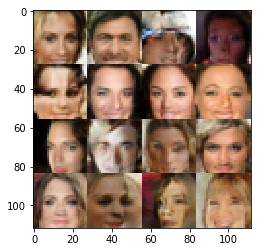

Epoch 4/10... Discriminator Loss: 0.9982... Generator Loss: 1.0275
Epoch 4/10... Discriminator Loss: 1.0188... Generator Loss: 0.6843
Epoch 4/10... Discriminator Loss: 0.8516... Generator Loss: 1.0153
Epoch 4/10... Discriminator Loss: 1.2878... Generator Loss: 0.4738
Epoch 4/10... Discriminator Loss: 1.1859... Generator Loss: 0.5072
Epoch 4/10... Discriminator Loss: 0.7892... Generator Loss: 1.3694
Epoch 4/10... Discriminator Loss: 0.8180... Generator Loss: 1.2292
Epoch 4/10... Discriminator Loss: 1.0753... Generator Loss: 0.6075
Epoch 4/10... Discriminator Loss: 1.0230... Generator Loss: 0.7924
Epoch 4/10... Discriminator Loss: 0.8715... Generator Loss: 1.3556


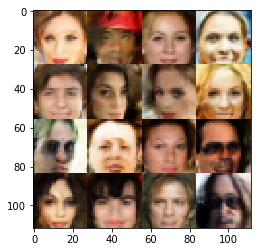

Epoch 4/10... Discriminator Loss: 0.7678... Generator Loss: 1.1631
Epoch 4/10... Discriminator Loss: 1.0465... Generator Loss: 1.2902
Epoch 4/10... Discriminator Loss: 1.2664... Generator Loss: 0.8576
Epoch 4/10... Discriminator Loss: 1.0309... Generator Loss: 0.8791
Epoch 4/10... Discriminator Loss: 1.4143... Generator Loss: 1.7109
Epoch 4/10... Discriminator Loss: 0.8428... Generator Loss: 0.8982
Epoch 4/10... Discriminator Loss: 0.9707... Generator Loss: 0.7323
Epoch 4/10... Discriminator Loss: 1.1088... Generator Loss: 0.6724
Epoch 4/10... Discriminator Loss: 1.0706... Generator Loss: 0.6630
Epoch 4/10... Discriminator Loss: 0.9834... Generator Loss: 0.8178


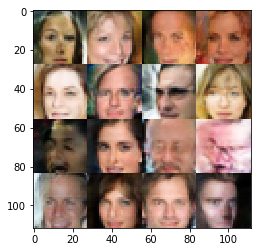

Epoch 4/10... Discriminator Loss: 0.7700... Generator Loss: 0.9814
Epoch 4/10... Discriminator Loss: 0.9631... Generator Loss: 0.6418
Epoch 4/10... Discriminator Loss: 0.9931... Generator Loss: 0.6583
Epoch 4/10... Discriminator Loss: 0.9860... Generator Loss: 0.7446
Epoch 4/10... Discriminator Loss: 1.0226... Generator Loss: 0.9511
Epoch 4/10... Discriminator Loss: 0.9959... Generator Loss: 0.8976
Epoch 4/10... Discriminator Loss: 0.9236... Generator Loss: 1.6072
Epoch 4/10... Discriminator Loss: 0.7597... Generator Loss: 1.4318
Epoch 4/10... Discriminator Loss: 1.1790... Generator Loss: 0.5426
Epoch 4/10... Discriminator Loss: 1.1724... Generator Loss: 0.5149


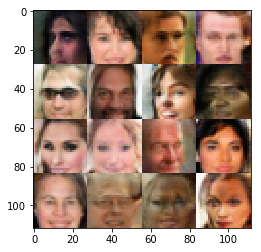

Epoch 4/10... Discriminator Loss: 1.0660... Generator Loss: 0.7216
Epoch 4/10... Discriminator Loss: 1.0743... Generator Loss: 0.6198
Epoch 4/10... Discriminator Loss: 0.9333... Generator Loss: 0.7894
Epoch 4/10... Discriminator Loss: 0.9658... Generator Loss: 1.1011
Epoch 4/10... Discriminator Loss: 1.2446... Generator Loss: 0.5801
Epoch 4/10... Discriminator Loss: 0.8811... Generator Loss: 1.1711
Epoch 4/10... Discriminator Loss: 1.0975... Generator Loss: 0.8248
Epoch 4/10... Discriminator Loss: 1.0922... Generator Loss: 0.6301
Epoch 4/10... Discriminator Loss: 0.8158... Generator Loss: 0.7929
Epoch 4/10... Discriminator Loss: 0.7553... Generator Loss: 0.9825


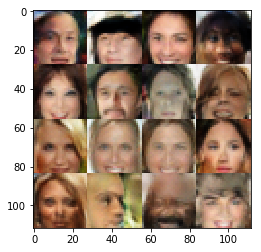

Epoch 4/10... Discriminator Loss: 0.7909... Generator Loss: 1.0396
Epoch 4/10... Discriminator Loss: 0.9062... Generator Loss: 0.7722
Epoch 4/10... Discriminator Loss: 0.8813... Generator Loss: 1.5751
Epoch 4/10... Discriminator Loss: 0.8627... Generator Loss: 0.7592
Epoch 4/10... Discriminator Loss: 1.3625... Generator Loss: 0.3868
Epoch 4/10... Discriminator Loss: 0.9937... Generator Loss: 0.7346
Epoch 4/10... Discriminator Loss: 1.0212... Generator Loss: 1.5189
Epoch 4/10... Discriminator Loss: 1.0980... Generator Loss: 0.7974
Epoch 4/10... Discriminator Loss: 1.0722... Generator Loss: 0.6181
Epoch 4/10... Discriminator Loss: 0.7659... Generator Loss: 1.0420


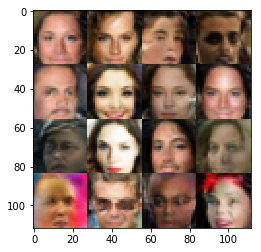

Epoch 4/10... Discriminator Loss: 0.9368... Generator Loss: 1.0732
Epoch 4/10... Discriminator Loss: 0.8890... Generator Loss: 0.8166
Epoch 4/10... Discriminator Loss: 0.8677... Generator Loss: 1.1976
Epoch 4/10... Discriminator Loss: 1.0898... Generator Loss: 0.7340
Epoch 4/10... Discriminator Loss: 1.1812... Generator Loss: 0.5350
Epoch 4/10... Discriminator Loss: 0.8933... Generator Loss: 0.8345
Epoch 4/10... Discriminator Loss: 1.0330... Generator Loss: 0.6899
Epoch 4/10... Discriminator Loss: 0.9637... Generator Loss: 0.8469
Epoch 4/10... Discriminator Loss: 1.2738... Generator Loss: 0.5394
Epoch 4/10... Discriminator Loss: 1.0735... Generator Loss: 1.1620


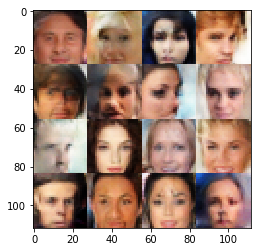

Epoch 4/10... Discriminator Loss: 0.8108... Generator Loss: 0.9898
Epoch 4/10... Discriminator Loss: 1.0147... Generator Loss: 1.1203
Epoch 4/10... Discriminator Loss: 0.9944... Generator Loss: 0.8940
Epoch 4/10... Discriminator Loss: 1.4534... Generator Loss: 0.3606
Epoch 4/10... Discriminator Loss: 1.1236... Generator Loss: 0.5768
Epoch 4/10... Discriminator Loss: 0.9379... Generator Loss: 1.2184
Epoch 4/10... Discriminator Loss: 1.0134... Generator Loss: 1.1790
Epoch 4/10... Discriminator Loss: 1.0395... Generator Loss: 0.7943
Epoch 4/10... Discriminator Loss: 1.1997... Generator Loss: 0.4890
Epoch 4/10... Discriminator Loss: 0.7560... Generator Loss: 1.0983


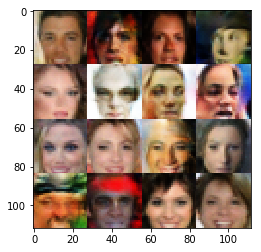

Epoch 4/10... Discriminator Loss: 1.0344... Generator Loss: 0.8748
Epoch 4/10... Discriminator Loss: 0.6712... Generator Loss: 1.6264
Epoch 4/10... Discriminator Loss: 1.0074... Generator Loss: 0.7082
Epoch 4/10... Discriminator Loss: 1.0735... Generator Loss: 0.6154
Epoch 4/10... Discriminator Loss: 0.8016... Generator Loss: 1.1244
Epoch 4/10... Discriminator Loss: 0.8477... Generator Loss: 1.1087
Epoch 4/10... Discriminator Loss: 0.8778... Generator Loss: 0.9951
Epoch 4/10... Discriminator Loss: 1.0897... Generator Loss: 1.4371
Epoch 4/10... Discriminator Loss: 1.0229... Generator Loss: 0.7749
Epoch 4/10... Discriminator Loss: 1.1190... Generator Loss: 0.7683


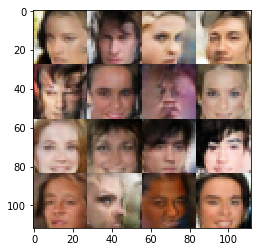

Epoch 4/10... Discriminator Loss: 1.2058... Generator Loss: 0.5326
Epoch 4/10... Discriminator Loss: 0.9466... Generator Loss: 0.9071
Epoch 4/10... Discriminator Loss: 0.5855... Generator Loss: 1.4484
Epoch 4/10... Discriminator Loss: 1.5150... Generator Loss: 0.3277
Epoch 4/10... Discriminator Loss: 0.8887... Generator Loss: 0.9129
Epoch 4/10... Discriminator Loss: 0.7660... Generator Loss: 0.9037
Epoch 4/10... Discriminator Loss: 1.2098... Generator Loss: 0.4652
Epoch 4/10... Discriminator Loss: 1.0322... Generator Loss: 1.5077
Epoch 4/10... Discriminator Loss: 1.0043... Generator Loss: 0.7106
Epoch 4/10... Discriminator Loss: 0.8315... Generator Loss: 1.1594


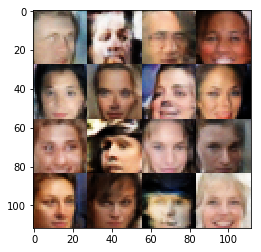

Epoch 4/10... Discriminator Loss: 1.1674... Generator Loss: 0.8089
Epoch 4/10... Discriminator Loss: 1.0323... Generator Loss: 0.8012
Epoch 4/10... Discriminator Loss: 0.9163... Generator Loss: 0.7326
Epoch 4/10... Discriminator Loss: 0.6762... Generator Loss: 1.3830
Epoch 4/10... Discriminator Loss: 1.2021... Generator Loss: 0.4698
Epoch 4/10... Discriminator Loss: 1.0057... Generator Loss: 0.6934
Epoch 4/10... Discriminator Loss: 1.0754... Generator Loss: 0.6318
Epoch 4/10... Discriminator Loss: 1.0950... Generator Loss: 0.5979
Epoch 4/10... Discriminator Loss: 0.8937... Generator Loss: 0.8214
Epoch 4/10... Discriminator Loss: 0.9860... Generator Loss: 0.9543


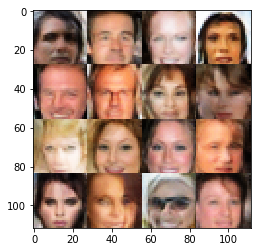

Epoch 4/10... Discriminator Loss: 0.8466... Generator Loss: 1.0206
Epoch 4/10... Discriminator Loss: 0.9730... Generator Loss: 0.7492
Epoch 4/10... Discriminator Loss: 0.9865... Generator Loss: 0.7193
Epoch 4/10... Discriminator Loss: 0.9907... Generator Loss: 0.6919
Epoch 4/10... Discriminator Loss: 0.9238... Generator Loss: 0.9990
Epoch 4/10... Discriminator Loss: 1.1041... Generator Loss: 0.6882
Epoch 4/10... Discriminator Loss: 1.0867... Generator Loss: 0.7825
Epoch 4/10... Discriminator Loss: 1.0067... Generator Loss: 0.6463
Epoch 4/10... Discriminator Loss: 0.9459... Generator Loss: 1.0748
Epoch 4/10... Discriminator Loss: 1.0716... Generator Loss: 0.5524


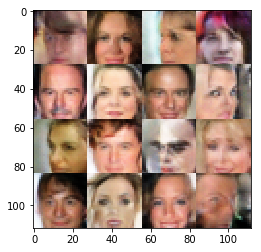

Epoch 4/10... Discriminator Loss: 1.1650... Generator Loss: 0.5293
Epoch 4/10... Discriminator Loss: 0.9814... Generator Loss: 0.7057
Epoch 4/10... Discriminator Loss: 0.9569... Generator Loss: 0.7450
Epoch 4/10... Discriminator Loss: 1.1183... Generator Loss: 0.6216
Epoch 4/10... Discriminator Loss: 0.9064... Generator Loss: 0.8784
Epoch 4/10... Discriminator Loss: 0.9432... Generator Loss: 0.8992
Epoch 4/10... Discriminator Loss: 0.7743... Generator Loss: 1.2635
Epoch 4/10... Discriminator Loss: 0.9642... Generator Loss: 0.8332
Epoch 4/10... Discriminator Loss: 0.9843... Generator Loss: 0.9232
Epoch 4/10... Discriminator Loss: 0.9245... Generator Loss: 1.0651


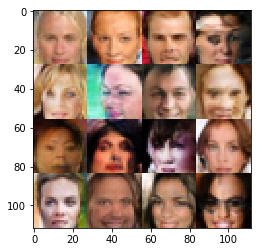

Epoch 4/10... Discriminator Loss: 0.8364... Generator Loss: 1.0120
Epoch 4/10... Discriminator Loss: 1.0336... Generator Loss: 1.1938
Epoch 4/10... Discriminator Loss: 0.8693... Generator Loss: 1.0174
Epoch 4/10... Discriminator Loss: 1.0782... Generator Loss: 0.5750
Epoch 4/10... Discriminator Loss: 1.7944... Generator Loss: 0.2704
Epoch 4/10... Discriminator Loss: 0.7135... Generator Loss: 1.0747
Epoch 4/10... Discriminator Loss: 0.5793... Generator Loss: 1.7270
Epoch 4/10... Discriminator Loss: 1.5556... Generator Loss: 3.8233
Epoch 4/10... Discriminator Loss: 1.1403... Generator Loss: 0.5364
Epoch 4/10... Discriminator Loss: 0.6291... Generator Loss: 1.5467


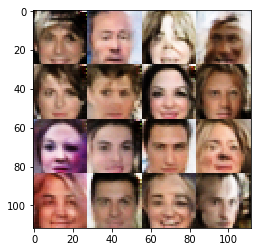

Epoch 4/10... Discriminator Loss: 0.6589... Generator Loss: 1.4253
Epoch 4/10... Discriminator Loss: 0.8728... Generator Loss: 0.8795
Epoch 4/10... Discriminator Loss: 1.1044... Generator Loss: 0.5348
Epoch 4/10... Discriminator Loss: 0.8921... Generator Loss: 1.6311
Epoch 4/10... Discriminator Loss: 1.0355... Generator Loss: 0.5848
Epoch 4/10... Discriminator Loss: 1.0585... Generator Loss: 1.9470
Epoch 4/10... Discriminator Loss: 1.2369... Generator Loss: 0.5184
Epoch 4/10... Discriminator Loss: 0.6200... Generator Loss: 1.1218
Epoch 4/10... Discriminator Loss: 0.9220... Generator Loss: 0.8082
Epoch 4/10... Discriminator Loss: 0.8224... Generator Loss: 1.1097


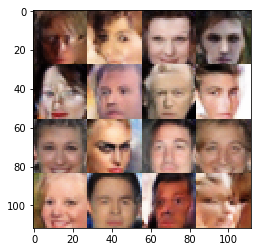

Epoch 4/10... Discriminator Loss: 0.8080... Generator Loss: 1.0259
Epoch 4/10... Discriminator Loss: 0.7952... Generator Loss: 1.0452
Epoch 4/10... Discriminator Loss: 1.0870... Generator Loss: 0.6250
Epoch 4/10... Discriminator Loss: 1.3648... Generator Loss: 0.3682
Epoch 4/10... Discriminator Loss: 1.2573... Generator Loss: 0.4807
Epoch 4/10... Discriminator Loss: 0.7726... Generator Loss: 1.2372
Epoch 4/10... Discriminator Loss: 1.2541... Generator Loss: 0.6210
Epoch 4/10... Discriminator Loss: 0.8876... Generator Loss: 1.0195
Epoch 4/10... Discriminator Loss: 0.8848... Generator Loss: 0.8156
Epoch 4/10... Discriminator Loss: 0.7388... Generator Loss: 0.9075


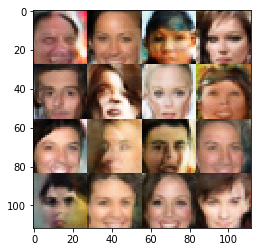

Epoch 4/10... Discriminator Loss: 0.7095... Generator Loss: 1.1840
Epoch 4/10... Discriminator Loss: 1.0461... Generator Loss: 0.6560
Epoch 4/10... Discriminator Loss: 0.6975... Generator Loss: 1.1279
Epoch 4/10... Discriminator Loss: 0.8776... Generator Loss: 0.9186
Epoch 4/10... Discriminator Loss: 0.7678... Generator Loss: 0.9889
Epoch 4/10... Discriminator Loss: 0.7560... Generator Loss: 1.0326
Epoch 4/10... Discriminator Loss: 1.1227... Generator Loss: 0.6190
Epoch 4/10... Discriminator Loss: 1.2641... Generator Loss: 0.4287
Epoch 4/10... Discriminator Loss: 1.2009... Generator Loss: 0.6285
Epoch 4/10... Discriminator Loss: 0.9984... Generator Loss: 0.8156


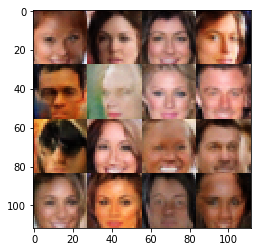

Epoch 4/10... Discriminator Loss: 0.8266... Generator Loss: 1.0721
Epoch 4/10... Discriminator Loss: 1.0997... Generator Loss: 1.0032
Epoch 4/10... Discriminator Loss: 1.0530... Generator Loss: 0.7233
Epoch 4/10... Discriminator Loss: 1.0084... Generator Loss: 0.6278
Epoch 4/10... Discriminator Loss: 0.8926... Generator Loss: 0.9036
Epoch 4/10... Discriminator Loss: 1.2832... Generator Loss: 0.4687
Epoch 4/10... Discriminator Loss: 0.7954... Generator Loss: 1.7458
Epoch 4/10... Discriminator Loss: 1.4967... Generator Loss: 0.3730
Epoch 4/10... Discriminator Loss: 1.0476... Generator Loss: 1.6327
Epoch 4/10... Discriminator Loss: 0.9997... Generator Loss: 2.1874


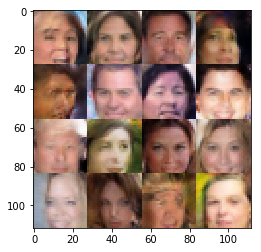

Epoch 4/10... Discriminator Loss: 0.8834... Generator Loss: 1.0718
Epoch 4/10... Discriminator Loss: 0.9407... Generator Loss: 0.8545
Epoch 4/10... Discriminator Loss: 0.8094... Generator Loss: 1.3906
Epoch 4/10... Discriminator Loss: 0.7785... Generator Loss: 0.9959
Epoch 4/10... Discriminator Loss: 0.8344... Generator Loss: 0.8501
Epoch 4/10... Discriminator Loss: 0.8267... Generator Loss: 0.8319
Epoch 5/10... Discriminator Loss: 0.8482... Generator Loss: 0.7820
Epoch 5/10... Discriminator Loss: 0.7918... Generator Loss: 1.3628
Epoch 5/10... Discriminator Loss: 0.9199... Generator Loss: 0.8183
Epoch 5/10... Discriminator Loss: 1.2499... Generator Loss: 0.4657


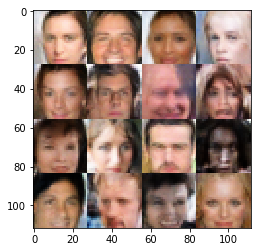

Epoch 5/10... Discriminator Loss: 0.8090... Generator Loss: 1.2780
Epoch 5/10... Discriminator Loss: 0.7353... Generator Loss: 1.2520
Epoch 5/10... Discriminator Loss: 1.0565... Generator Loss: 0.7357
Epoch 5/10... Discriminator Loss: 0.9049... Generator Loss: 1.1536
Epoch 5/10... Discriminator Loss: 0.9747... Generator Loss: 0.7243
Epoch 5/10... Discriminator Loss: 0.7982... Generator Loss: 0.8791
Epoch 5/10... Discriminator Loss: 1.0015... Generator Loss: 0.7378
Epoch 5/10... Discriminator Loss: 0.8914... Generator Loss: 0.9275
Epoch 5/10... Discriminator Loss: 1.0505... Generator Loss: 0.5916
Epoch 5/10... Discriminator Loss: 1.0933... Generator Loss: 0.7703


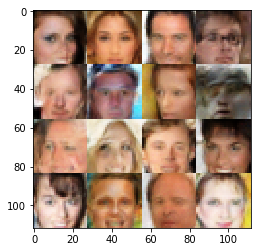

Epoch 5/10... Discriminator Loss: 0.9957... Generator Loss: 0.6935
Epoch 5/10... Discriminator Loss: 1.2396... Generator Loss: 0.5002
Epoch 5/10... Discriminator Loss: 1.1054... Generator Loss: 0.5780
Epoch 5/10... Discriminator Loss: 0.8285... Generator Loss: 1.0281
Epoch 5/10... Discriminator Loss: 0.8632... Generator Loss: 1.2049
Epoch 5/10... Discriminator Loss: 1.2308... Generator Loss: 0.4602
Epoch 5/10... Discriminator Loss: 0.9278... Generator Loss: 0.9307
Epoch 5/10... Discriminator Loss: 0.9341... Generator Loss: 0.8763
Epoch 5/10... Discriminator Loss: 0.8953... Generator Loss: 0.8836
Epoch 5/10... Discriminator Loss: 1.1009... Generator Loss: 0.6049


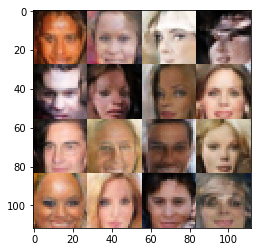

Epoch 5/10... Discriminator Loss: 0.7743... Generator Loss: 1.2242
Epoch 5/10... Discriminator Loss: 0.7912... Generator Loss: 0.9924
Epoch 5/10... Discriminator Loss: 0.7220... Generator Loss: 1.1254
Epoch 5/10... Discriminator Loss: 1.0670... Generator Loss: 1.1905
Epoch 5/10... Discriminator Loss: 0.8662... Generator Loss: 1.0960
Epoch 5/10... Discriminator Loss: 0.9601... Generator Loss: 1.0009
Epoch 5/10... Discriminator Loss: 0.6593... Generator Loss: 1.1538
Epoch 5/10... Discriminator Loss: 1.0717... Generator Loss: 1.3743
Epoch 5/10... Discriminator Loss: 0.9685... Generator Loss: 0.7804
Epoch 5/10... Discriminator Loss: 0.9944... Generator Loss: 0.8658


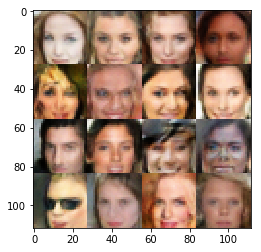

Epoch 5/10... Discriminator Loss: 0.8698... Generator Loss: 0.9492
Epoch 5/10... Discriminator Loss: 0.6866... Generator Loss: 1.3254
Epoch 5/10... Discriminator Loss: 0.8562... Generator Loss: 0.9631
Epoch 5/10... Discriminator Loss: 1.1788... Generator Loss: 0.5858
Epoch 5/10... Discriminator Loss: 0.8424... Generator Loss: 0.9768
Epoch 5/10... Discriminator Loss: 1.1803... Generator Loss: 0.5606
Epoch 5/10... Discriminator Loss: 0.9963... Generator Loss: 0.7304
Epoch 5/10... Discriminator Loss: 0.7693... Generator Loss: 1.4365
Epoch 5/10... Discriminator Loss: 0.7801... Generator Loss: 1.2145
Epoch 5/10... Discriminator Loss: 1.4771... Generator Loss: 0.3443


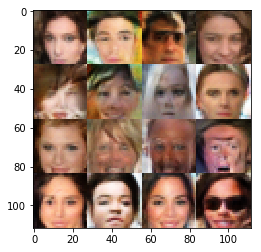

Epoch 5/10... Discriminator Loss: 1.1099... Generator Loss: 0.6695
Epoch 5/10... Discriminator Loss: 0.9973... Generator Loss: 0.7259
Epoch 5/10... Discriminator Loss: 0.7736... Generator Loss: 1.0034
Epoch 5/10... Discriminator Loss: 0.7383... Generator Loss: 1.0706
Epoch 5/10... Discriminator Loss: 1.0539... Generator Loss: 0.6900
Epoch 5/10... Discriminator Loss: 1.1006... Generator Loss: 1.0759
Epoch 5/10... Discriminator Loss: 1.0051... Generator Loss: 0.6244
Epoch 5/10... Discriminator Loss: 0.9938... Generator Loss: 0.6981
Epoch 5/10... Discriminator Loss: 0.9806... Generator Loss: 1.2649
Epoch 5/10... Discriminator Loss: 1.1071... Generator Loss: 0.5677


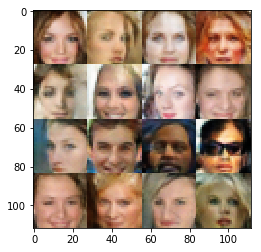

Epoch 5/10... Discriminator Loss: 0.9742... Generator Loss: 0.8638
Epoch 5/10... Discriminator Loss: 1.2936... Generator Loss: 0.4263
Epoch 5/10... Discriminator Loss: 1.0568... Generator Loss: 0.7773
Epoch 5/10... Discriminator Loss: 0.9053... Generator Loss: 0.8061
Epoch 5/10... Discriminator Loss: 0.6993... Generator Loss: 1.7458
Epoch 5/10... Discriminator Loss: 1.0313... Generator Loss: 0.6736
Epoch 5/10... Discriminator Loss: 0.9012... Generator Loss: 0.8569
Epoch 5/10... Discriminator Loss: 1.1003... Generator Loss: 1.7508
Epoch 5/10... Discriminator Loss: 1.0190... Generator Loss: 0.7348
Epoch 5/10... Discriminator Loss: 0.9429... Generator Loss: 0.9351


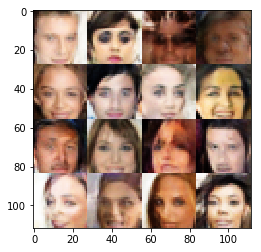

Epoch 5/10... Discriminator Loss: 0.9289... Generator Loss: 0.7575
Epoch 5/10... Discriminator Loss: 0.9876... Generator Loss: 0.9671
Epoch 5/10... Discriminator Loss: 0.9391... Generator Loss: 1.0328
Epoch 5/10... Discriminator Loss: 0.7370... Generator Loss: 1.0554
Epoch 5/10... Discriminator Loss: 1.2608... Generator Loss: 0.4376
Epoch 5/10... Discriminator Loss: 1.0748... Generator Loss: 0.6336
Epoch 5/10... Discriminator Loss: 1.1244... Generator Loss: 0.5708
Epoch 5/10... Discriminator Loss: 0.9798... Generator Loss: 0.7378
Epoch 5/10... Discriminator Loss: 1.0523... Generator Loss: 0.6948
Epoch 5/10... Discriminator Loss: 0.8955... Generator Loss: 0.7432


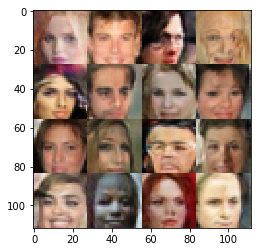

Epoch 5/10... Discriminator Loss: 0.7494... Generator Loss: 1.5557
Epoch 5/10... Discriminator Loss: 1.1900... Generator Loss: 0.6458
Epoch 5/10... Discriminator Loss: 1.2986... Generator Loss: 0.4266
Epoch 5/10... Discriminator Loss: 0.8575... Generator Loss: 1.0308
Epoch 5/10... Discriminator Loss: 1.0429... Generator Loss: 1.0072
Epoch 5/10... Discriminator Loss: 0.8605... Generator Loss: 0.9461
Epoch 5/10... Discriminator Loss: 0.9450... Generator Loss: 0.9610
Epoch 5/10... Discriminator Loss: 1.1265... Generator Loss: 0.5760
Epoch 5/10... Discriminator Loss: 0.9027... Generator Loss: 1.5380
Epoch 5/10... Discriminator Loss: 1.2972... Generator Loss: 0.4435


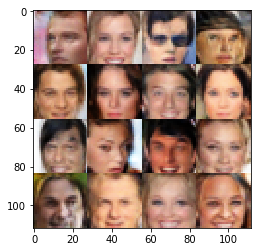

Epoch 5/10... Discriminator Loss: 0.7716... Generator Loss: 1.0837
Epoch 5/10... Discriminator Loss: 1.2094... Generator Loss: 0.5140
Epoch 5/10... Discriminator Loss: 1.3046... Generator Loss: 0.4853
Epoch 5/10... Discriminator Loss: 0.9198... Generator Loss: 1.0812
Epoch 5/10... Discriminator Loss: 1.0743... Generator Loss: 0.7710
Epoch 5/10... Discriminator Loss: 1.2919... Generator Loss: 0.4183
Epoch 5/10... Discriminator Loss: 0.9548... Generator Loss: 0.6699
Epoch 5/10... Discriminator Loss: 1.1124... Generator Loss: 0.5701
Epoch 5/10... Discriminator Loss: 0.8983... Generator Loss: 1.1118
Epoch 5/10... Discriminator Loss: 0.7372... Generator Loss: 0.9980


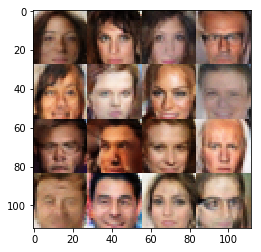

Epoch 5/10... Discriminator Loss: 0.8411... Generator Loss: 0.8809
Epoch 5/10... Discriminator Loss: 0.7328... Generator Loss: 1.0063
Epoch 5/10... Discriminator Loss: 0.8835... Generator Loss: 0.9895
Epoch 5/10... Discriminator Loss: 1.0659... Generator Loss: 0.6670
Epoch 5/10... Discriminator Loss: 0.7540... Generator Loss: 1.3496
Epoch 5/10... Discriminator Loss: 1.1647... Generator Loss: 0.5913
Epoch 5/10... Discriminator Loss: 0.8350... Generator Loss: 1.3148
Epoch 5/10... Discriminator Loss: 0.9177... Generator Loss: 0.8673
Epoch 5/10... Discriminator Loss: 1.0308... Generator Loss: 0.6885
Epoch 5/10... Discriminator Loss: 1.0956... Generator Loss: 0.6597


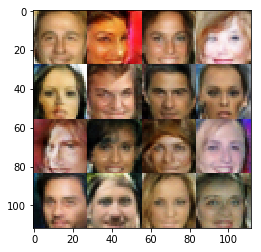

Epoch 5/10... Discriminator Loss: 0.9083... Generator Loss: 0.8010
Epoch 5/10... Discriminator Loss: 0.7929... Generator Loss: 1.0642
Epoch 5/10... Discriminator Loss: 1.3739... Generator Loss: 0.3874
Epoch 5/10... Discriminator Loss: 1.1430... Generator Loss: 0.5379
Epoch 5/10... Discriminator Loss: 1.1166... Generator Loss: 0.5871
Epoch 5/10... Discriminator Loss: 0.8159... Generator Loss: 1.0113
Epoch 5/10... Discriminator Loss: 1.1235... Generator Loss: 0.7215
Epoch 5/10... Discriminator Loss: 1.1134... Generator Loss: 0.6360
Epoch 5/10... Discriminator Loss: 1.1065... Generator Loss: 1.3322
Epoch 5/10... Discriminator Loss: 0.8646... Generator Loss: 0.8647


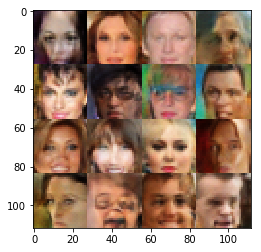

Epoch 5/10... Discriminator Loss: 1.1422... Generator Loss: 1.0233
Epoch 5/10... Discriminator Loss: 1.1743... Generator Loss: 0.5777
Epoch 5/10... Discriminator Loss: 0.9241... Generator Loss: 0.9523
Epoch 5/10... Discriminator Loss: 1.2869... Generator Loss: 0.4772
Epoch 5/10... Discriminator Loss: 0.9997... Generator Loss: 1.3107
Epoch 5/10... Discriminator Loss: 1.0655... Generator Loss: 0.7450
Epoch 5/10... Discriminator Loss: 0.8282... Generator Loss: 0.8863
Epoch 5/10... Discriminator Loss: 1.0758... Generator Loss: 0.5706
Epoch 5/10... Discriminator Loss: 0.9450... Generator Loss: 0.8650
Epoch 5/10... Discriminator Loss: 1.2069... Generator Loss: 0.4906


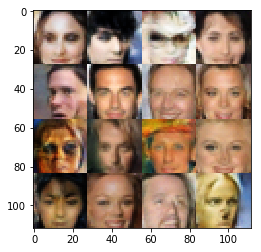

Epoch 5/10... Discriminator Loss: 1.0042... Generator Loss: 0.8715
Epoch 5/10... Discriminator Loss: 0.8737... Generator Loss: 1.0153
Epoch 5/10... Discriminator Loss: 0.9580... Generator Loss: 1.1764
Epoch 5/10... Discriminator Loss: 1.3586... Generator Loss: 0.4342
Epoch 5/10... Discriminator Loss: 0.8589... Generator Loss: 0.9084
Epoch 5/10... Discriminator Loss: 1.0675... Generator Loss: 1.0247
Epoch 5/10... Discriminator Loss: 0.8510... Generator Loss: 0.9864
Epoch 5/10... Discriminator Loss: 0.9978... Generator Loss: 0.7461
Epoch 5/10... Discriminator Loss: 1.3042... Generator Loss: 0.5093
Epoch 5/10... Discriminator Loss: 0.7492... Generator Loss: 1.2396


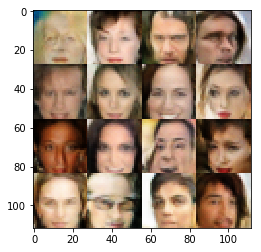

Epoch 5/10... Discriminator Loss: 0.9112... Generator Loss: 0.7856
Epoch 5/10... Discriminator Loss: 0.8231... Generator Loss: 1.0672
Epoch 5/10... Discriminator Loss: 1.0448... Generator Loss: 0.7344
Epoch 5/10... Discriminator Loss: 1.0692... Generator Loss: 0.6656
Epoch 5/10... Discriminator Loss: 0.8125... Generator Loss: 1.1069
Epoch 5/10... Discriminator Loss: 0.9450... Generator Loss: 0.6979
Epoch 5/10... Discriminator Loss: 1.4472... Generator Loss: 0.3933
Epoch 5/10... Discriminator Loss: 0.9707... Generator Loss: 0.6628
Epoch 5/10... Discriminator Loss: 1.1349... Generator Loss: 0.5662
Epoch 5/10... Discriminator Loss: 1.0554... Generator Loss: 0.5901


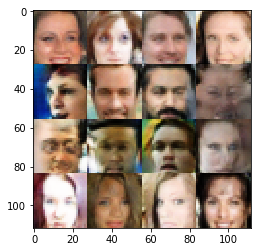

Epoch 5/10... Discriminator Loss: 1.1462... Generator Loss: 0.5584
Epoch 5/10... Discriminator Loss: 1.0315... Generator Loss: 1.1205
Epoch 5/10... Discriminator Loss: 0.7876... Generator Loss: 1.1275
Epoch 5/10... Discriminator Loss: 1.1537... Generator Loss: 0.5467
Epoch 5/10... Discriminator Loss: 0.8017... Generator Loss: 1.0987
Epoch 5/10... Discriminator Loss: 0.9890... Generator Loss: 0.7859
Epoch 5/10... Discriminator Loss: 0.8658... Generator Loss: 1.5593
Epoch 5/10... Discriminator Loss: 0.9750... Generator Loss: 0.7411
Epoch 5/10... Discriminator Loss: 0.8280... Generator Loss: 0.8777
Epoch 5/10... Discriminator Loss: 0.7411... Generator Loss: 1.0659


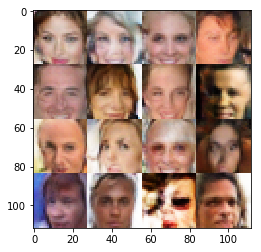

Epoch 5/10... Discriminator Loss: 0.9395... Generator Loss: 0.8842
Epoch 5/10... Discriminator Loss: 1.1388... Generator Loss: 1.3318
Epoch 5/10... Discriminator Loss: 0.8682... Generator Loss: 0.9055
Epoch 5/10... Discriminator Loss: 0.7248... Generator Loss: 1.0791
Epoch 5/10... Discriminator Loss: 1.1043... Generator Loss: 0.8020
Epoch 5/10... Discriminator Loss: 0.8985... Generator Loss: 0.8690
Epoch 5/10... Discriminator Loss: 0.9218... Generator Loss: 0.7885
Epoch 5/10... Discriminator Loss: 0.9301... Generator Loss: 0.9120
Epoch 5/10... Discriminator Loss: 1.0608... Generator Loss: 0.5952
Epoch 5/10... Discriminator Loss: 0.7104... Generator Loss: 1.0888


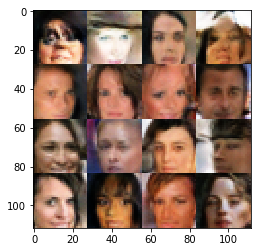

Epoch 5/10... Discriminator Loss: 0.9382... Generator Loss: 0.6751
Epoch 5/10... Discriminator Loss: 0.8272... Generator Loss: 0.9749
Epoch 5/10... Discriminator Loss: 1.2382... Generator Loss: 0.4817
Epoch 5/10... Discriminator Loss: 0.9330... Generator Loss: 0.9468
Epoch 5/10... Discriminator Loss: 1.2170... Generator Loss: 0.5587
Epoch 5/10... Discriminator Loss: 1.3822... Generator Loss: 0.7367
Epoch 5/10... Discriminator Loss: 0.8084... Generator Loss: 1.2051
Epoch 5/10... Discriminator Loss: 1.0345... Generator Loss: 0.6582
Epoch 5/10... Discriminator Loss: 0.7230... Generator Loss: 1.3769
Epoch 5/10... Discriminator Loss: 1.0467... Generator Loss: 0.7314


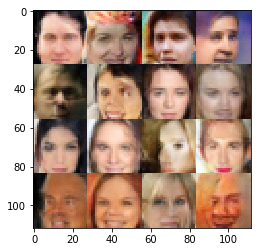

Epoch 5/10... Discriminator Loss: 1.1154... Generator Loss: 0.5463
Epoch 5/10... Discriminator Loss: 0.8132... Generator Loss: 1.1426
Epoch 5/10... Discriminator Loss: 1.0030... Generator Loss: 0.7986
Epoch 5/10... Discriminator Loss: 1.0151... Generator Loss: 0.7656
Epoch 5/10... Discriminator Loss: 0.9717... Generator Loss: 0.7465
Epoch 5/10... Discriminator Loss: 1.1678... Generator Loss: 0.4995
Epoch 5/10... Discriminator Loss: 0.8368... Generator Loss: 1.3589
Epoch 5/10... Discriminator Loss: 1.1413... Generator Loss: 0.5449
Epoch 5/10... Discriminator Loss: 1.0802... Generator Loss: 0.8034
Epoch 5/10... Discriminator Loss: 1.0599... Generator Loss: 0.6830


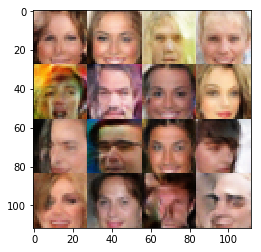

Epoch 5/10... Discriminator Loss: 0.9786... Generator Loss: 0.8130
Epoch 5/10... Discriminator Loss: 0.8102... Generator Loss: 1.1412
Epoch 5/10... Discriminator Loss: 1.5690... Generator Loss: 0.3145
Epoch 5/10... Discriminator Loss: 1.1359... Generator Loss: 1.0070
Epoch 5/10... Discriminator Loss: 0.8290... Generator Loss: 0.8782
Epoch 5/10... Discriminator Loss: 0.8381... Generator Loss: 1.2751
Epoch 5/10... Discriminator Loss: 1.1198... Generator Loss: 0.5518
Epoch 5/10... Discriminator Loss: 1.1339... Generator Loss: 0.5623
Epoch 5/10... Discriminator Loss: 1.0071... Generator Loss: 0.8231
Epoch 5/10... Discriminator Loss: 0.9989... Generator Loss: 0.5895


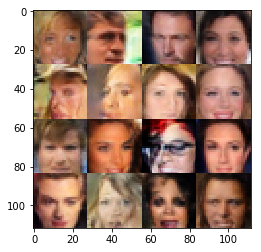

Epoch 5/10... Discriminator Loss: 1.0817... Generator Loss: 0.5859
Epoch 5/10... Discriminator Loss: 0.8644... Generator Loss: 0.9215
Epoch 5/10... Discriminator Loss: 1.4565... Generator Loss: 0.4038
Epoch 5/10... Discriminator Loss: 0.6592... Generator Loss: 1.1015
Epoch 5/10... Discriminator Loss: 0.8393... Generator Loss: 0.8015
Epoch 5/10... Discriminator Loss: 0.8353... Generator Loss: 1.1180
Epoch 5/10... Discriminator Loss: 1.0999... Generator Loss: 0.7665
Epoch 5/10... Discriminator Loss: 1.0915... Generator Loss: 0.6053
Epoch 5/10... Discriminator Loss: 0.7805... Generator Loss: 1.0627
Epoch 5/10... Discriminator Loss: 0.8546... Generator Loss: 1.2952


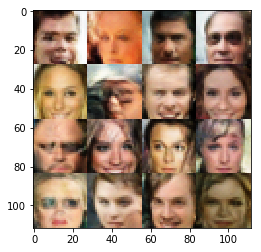

Epoch 5/10... Discriminator Loss: 0.7847... Generator Loss: 1.2416
Epoch 5/10... Discriminator Loss: 1.0055... Generator Loss: 0.6116
Epoch 5/10... Discriminator Loss: 1.2202... Generator Loss: 0.4605
Epoch 5/10... Discriminator Loss: 1.1045... Generator Loss: 0.6782
Epoch 5/10... Discriminator Loss: 1.3084... Generator Loss: 0.7986
Epoch 5/10... Discriminator Loss: 0.9388... Generator Loss: 0.6287
Epoch 5/10... Discriminator Loss: 0.9868... Generator Loss: 0.8399
Epoch 5/10... Discriminator Loss: 0.9119... Generator Loss: 1.2357
Epoch 5/10... Discriminator Loss: 1.1201... Generator Loss: 0.5720
Epoch 5/10... Discriminator Loss: 0.9306... Generator Loss: 0.7552


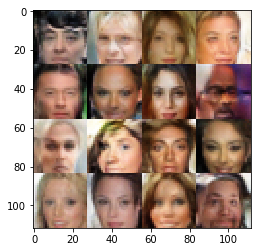

Epoch 5/10... Discriminator Loss: 1.0266... Generator Loss: 0.9403
Epoch 5/10... Discriminator Loss: 1.3577... Generator Loss: 0.3917
Epoch 5/10... Discriminator Loss: 0.8675... Generator Loss: 1.1202
Epoch 5/10... Discriminator Loss: 0.9574... Generator Loss: 0.8249
Epoch 5/10... Discriminator Loss: 0.8250... Generator Loss: 1.2805
Epoch 5/10... Discriminator Loss: 0.9347... Generator Loss: 0.7349
Epoch 5/10... Discriminator Loss: 1.0586... Generator Loss: 0.6037
Epoch 5/10... Discriminator Loss: 0.6885... Generator Loss: 1.3460
Epoch 5/10... Discriminator Loss: 1.2069... Generator Loss: 1.7761
Epoch 5/10... Discriminator Loss: 0.8676... Generator Loss: 0.9637


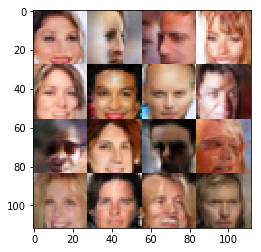

Epoch 5/10... Discriminator Loss: 0.8856... Generator Loss: 0.7344
Epoch 5/10... Discriminator Loss: 0.6861... Generator Loss: 1.0566
Epoch 5/10... Discriminator Loss: 1.0346... Generator Loss: 0.9167
Epoch 5/10... Discriminator Loss: 0.9837... Generator Loss: 0.8586
Epoch 5/10... Discriminator Loss: 0.8633... Generator Loss: 1.1724
Epoch 5/10... Discriminator Loss: 0.6195... Generator Loss: 1.3700
Epoch 5/10... Discriminator Loss: 1.2045... Generator Loss: 0.6747
Epoch 5/10... Discriminator Loss: 0.7085... Generator Loss: 1.2883
Epoch 5/10... Discriminator Loss: 1.0652... Generator Loss: 0.6032
Epoch 5/10... Discriminator Loss: 0.8877... Generator Loss: 0.8485


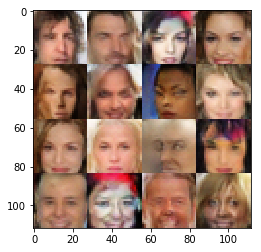

Epoch 5/10... Discriminator Loss: 0.9575... Generator Loss: 0.7546
Epoch 5/10... Discriminator Loss: 0.8873... Generator Loss: 0.7671
Epoch 5/10... Discriminator Loss: 0.9230... Generator Loss: 0.8257
Epoch 5/10... Discriminator Loss: 0.9820... Generator Loss: 0.7417
Epoch 5/10... Discriminator Loss: 1.0612... Generator Loss: 0.6107
Epoch 5/10... Discriminator Loss: 0.8588... Generator Loss: 0.9335
Epoch 5/10... Discriminator Loss: 0.8545... Generator Loss: 0.8697
Epoch 5/10... Discriminator Loss: 0.8237... Generator Loss: 1.1454
Epoch 5/10... Discriminator Loss: 0.7704... Generator Loss: 1.1151
Epoch 5/10... Discriminator Loss: 0.7374... Generator Loss: 1.2451


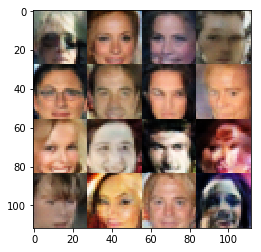

Epoch 5/10... Discriminator Loss: 0.6988... Generator Loss: 1.2644
Epoch 5/10... Discriminator Loss: 0.8356... Generator Loss: 1.2220
Epoch 5/10... Discriminator Loss: 1.2911... Generator Loss: 0.4825
Epoch 5/10... Discriminator Loss: 0.9032... Generator Loss: 0.9254
Epoch 5/10... Discriminator Loss: 0.7771... Generator Loss: 1.0716
Epoch 5/10... Discriminator Loss: 1.0053... Generator Loss: 0.6834
Epoch 5/10... Discriminator Loss: 1.0406... Generator Loss: 0.7251
Epoch 5/10... Discriminator Loss: 0.9493... Generator Loss: 0.7671
Epoch 5/10... Discriminator Loss: 0.8352... Generator Loss: 1.0149
Epoch 5/10... Discriminator Loss: 1.0533... Generator Loss: 0.6394


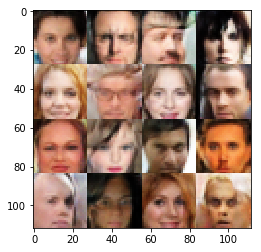

Epoch 5/10... Discriminator Loss: 1.2144... Generator Loss: 0.5550
Epoch 5/10... Discriminator Loss: 0.9701... Generator Loss: 1.0097
Epoch 5/10... Discriminator Loss: 1.2395... Generator Loss: 0.4886
Epoch 5/10... Discriminator Loss: 0.9901... Generator Loss: 0.6493
Epoch 5/10... Discriminator Loss: 0.9503... Generator Loss: 1.1593
Epoch 5/10... Discriminator Loss: 1.2794... Generator Loss: 0.4494
Epoch 5/10... Discriminator Loss: 0.7936... Generator Loss: 1.0676
Epoch 5/10... Discriminator Loss: 0.8988... Generator Loss: 1.0350
Epoch 5/10... Discriminator Loss: 0.8592... Generator Loss: 1.1787
Epoch 5/10... Discriminator Loss: 1.7436... Generator Loss: 0.2599


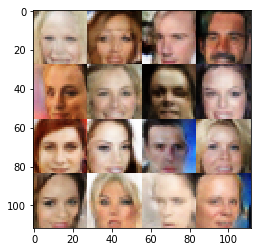

Epoch 5/10... Discriminator Loss: 1.1371... Generator Loss: 0.5330
Epoch 5/10... Discriminator Loss: 0.7793... Generator Loss: 0.9501
Epoch 5/10... Discriminator Loss: 0.9153... Generator Loss: 0.8294
Epoch 5/10... Discriminator Loss: 1.5060... Generator Loss: 0.3263
Epoch 5/10... Discriminator Loss: 1.3867... Generator Loss: 0.4404
Epoch 5/10... Discriminator Loss: 0.7741... Generator Loss: 0.9673
Epoch 5/10... Discriminator Loss: 0.8996... Generator Loss: 0.9372
Epoch 5/10... Discriminator Loss: 0.8283... Generator Loss: 1.2571
Epoch 5/10... Discriminator Loss: 1.0760... Generator Loss: 0.7150
Epoch 5/10... Discriminator Loss: 0.8186... Generator Loss: 1.1837


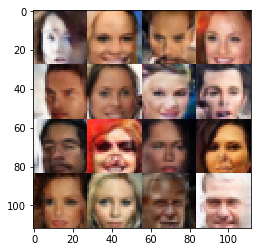

Epoch 5/10... Discriminator Loss: 1.0562... Generator Loss: 0.8077
Epoch 5/10... Discriminator Loss: 0.9653... Generator Loss: 1.0174
Epoch 5/10... Discriminator Loss: 0.9517... Generator Loss: 1.0326
Epoch 5/10... Discriminator Loss: 0.8582... Generator Loss: 1.0057
Epoch 5/10... Discriminator Loss: 1.0652... Generator Loss: 1.5792
Epoch 5/10... Discriminator Loss: 0.7687... Generator Loss: 1.0949
Epoch 5/10... Discriminator Loss: 1.2375... Generator Loss: 0.5197
Epoch 5/10... Discriminator Loss: 0.8744... Generator Loss: 1.2197
Epoch 5/10... Discriminator Loss: 1.6072... Generator Loss: 0.2949
Epoch 5/10... Discriminator Loss: 1.0445... Generator Loss: 0.7789


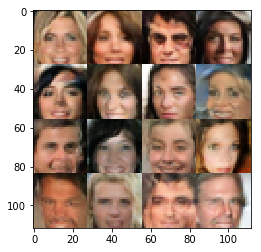

Epoch 5/10... Discriminator Loss: 1.1115... Generator Loss: 0.7228
Epoch 5/10... Discriminator Loss: 1.0413... Generator Loss: 0.6574
Epoch 5/10... Discriminator Loss: 0.7472... Generator Loss: 0.9714
Epoch 5/10... Discriminator Loss: 0.7504... Generator Loss: 1.0628
Epoch 5/10... Discriminator Loss: 0.9469... Generator Loss: 1.1938
Epoch 5/10... Discriminator Loss: 1.0157... Generator Loss: 0.8497
Epoch 5/10... Discriminator Loss: 1.0706... Generator Loss: 0.6150
Epoch 5/10... Discriminator Loss: 1.3376... Generator Loss: 0.4131
Epoch 5/10... Discriminator Loss: 1.0695... Generator Loss: 1.1327
Epoch 5/10... Discriminator Loss: 0.8559... Generator Loss: 0.8562


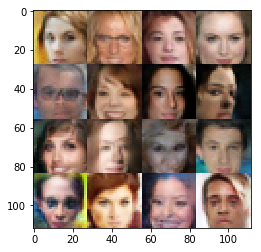

Epoch 5/10... Discriminator Loss: 0.8264... Generator Loss: 1.7651
Epoch 5/10... Discriminator Loss: 0.6611... Generator Loss: 1.2149
Epoch 5/10... Discriminator Loss: 0.9642... Generator Loss: 0.8071
Epoch 5/10... Discriminator Loss: 1.3983... Generator Loss: 0.4317
Epoch 5/10... Discriminator Loss: 0.8235... Generator Loss: 1.4027
Epoch 5/10... Discriminator Loss: 1.2067... Generator Loss: 0.4994
Epoch 5/10... Discriminator Loss: 0.8821... Generator Loss: 1.3886
Epoch 5/10... Discriminator Loss: 0.8577... Generator Loss: 0.8379
Epoch 5/10... Discriminator Loss: 1.1469... Generator Loss: 1.2480
Epoch 5/10... Discriminator Loss: 1.2879... Generator Loss: 0.8561


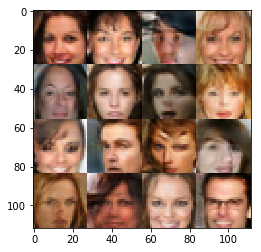

Epoch 5/10... Discriminator Loss: 0.6987... Generator Loss: 1.1510
Epoch 5/10... Discriminator Loss: 0.8774... Generator Loss: 0.7573
Epoch 5/10... Discriminator Loss: 0.8714... Generator Loss: 0.9099
Epoch 5/10... Discriminator Loss: 0.7412... Generator Loss: 1.4964
Epoch 5/10... Discriminator Loss: 0.7172... Generator Loss: 1.0308
Epoch 5/10... Discriminator Loss: 1.3293... Generator Loss: 0.4338
Epoch 5/10... Discriminator Loss: 1.0350... Generator Loss: 0.7340
Epoch 5/10... Discriminator Loss: 0.8716... Generator Loss: 0.7468
Epoch 5/10... Discriminator Loss: 0.9780... Generator Loss: 0.7287
Epoch 5/10... Discriminator Loss: 0.7154... Generator Loss: 1.2202


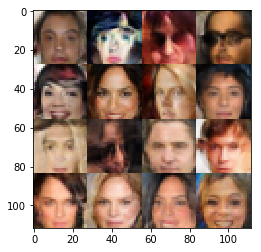

Epoch 5/10... Discriminator Loss: 1.2983... Generator Loss: 0.5078
Epoch 5/10... Discriminator Loss: 0.9123... Generator Loss: 0.7473
Epoch 6/10... Discriminator Loss: 1.0192... Generator Loss: 0.6544
Epoch 6/10... Discriminator Loss: 0.8459... Generator Loss: 0.9368
Epoch 6/10... Discriminator Loss: 0.9016... Generator Loss: 1.6499
Epoch 6/10... Discriminator Loss: 0.7674... Generator Loss: 1.0378
Epoch 6/10... Discriminator Loss: 0.7597... Generator Loss: 0.9855
Epoch 6/10... Discriminator Loss: 0.8454... Generator Loss: 1.2672
Epoch 6/10... Discriminator Loss: 0.8967... Generator Loss: 0.8240
Epoch 6/10... Discriminator Loss: 1.0895... Generator Loss: 0.6101


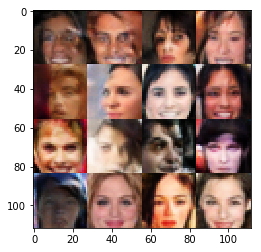

Epoch 6/10... Discriminator Loss: 0.9769... Generator Loss: 0.7070
Epoch 6/10... Discriminator Loss: 0.9033... Generator Loss: 0.8057
Epoch 6/10... Discriminator Loss: 1.2540... Generator Loss: 0.4443
Epoch 6/10... Discriminator Loss: 0.7363... Generator Loss: 1.3751
Epoch 6/10... Discriminator Loss: 0.8840... Generator Loss: 1.4845
Epoch 6/10... Discriminator Loss: 1.1397... Generator Loss: 0.5796
Epoch 6/10... Discriminator Loss: 1.0506... Generator Loss: 0.6990
Epoch 6/10... Discriminator Loss: 0.8842... Generator Loss: 0.8456
Epoch 6/10... Discriminator Loss: 0.9241... Generator Loss: 0.8556
Epoch 6/10... Discriminator Loss: 1.3495... Generator Loss: 0.4084


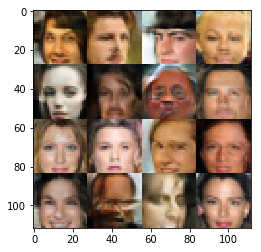

Epoch 6/10... Discriminator Loss: 0.7549... Generator Loss: 1.1559
Epoch 6/10... Discriminator Loss: 0.7929... Generator Loss: 1.1595
Epoch 6/10... Discriminator Loss: 0.8252... Generator Loss: 0.8828
Epoch 6/10... Discriminator Loss: 0.7550... Generator Loss: 0.9660
Epoch 6/10... Discriminator Loss: 1.0146... Generator Loss: 0.6178
Epoch 6/10... Discriminator Loss: 0.9596... Generator Loss: 0.7045
Epoch 6/10... Discriminator Loss: 1.0002... Generator Loss: 1.9046
Epoch 6/10... Discriminator Loss: 0.5569... Generator Loss: 1.1544
Epoch 6/10... Discriminator Loss: 0.7102... Generator Loss: 1.3667
Epoch 6/10... Discriminator Loss: 1.1469... Generator Loss: 0.5369


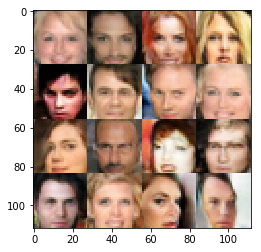

Epoch 6/10... Discriminator Loss: 0.8538... Generator Loss: 1.4982
Epoch 6/10... Discriminator Loss: 0.9390... Generator Loss: 0.7213
Epoch 6/10... Discriminator Loss: 0.6710... Generator Loss: 1.1717
Epoch 6/10... Discriminator Loss: 1.2094... Generator Loss: 0.5023
Epoch 6/10... Discriminator Loss: 0.7847... Generator Loss: 1.0652
Epoch 6/10... Discriminator Loss: 1.0766... Generator Loss: 0.6832
Epoch 6/10... Discriminator Loss: 1.1745... Generator Loss: 0.5384
Epoch 6/10... Discriminator Loss: 0.9041... Generator Loss: 0.8029
Epoch 6/10... Discriminator Loss: 1.0649... Generator Loss: 1.0161
Epoch 6/10... Discriminator Loss: 0.9192... Generator Loss: 0.7485


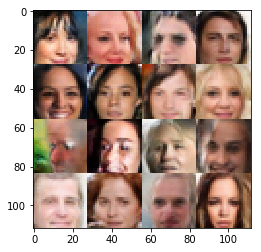

Epoch 6/10... Discriminator Loss: 0.6650... Generator Loss: 1.1392
Epoch 6/10... Discriminator Loss: 1.3283... Generator Loss: 0.4195
Epoch 6/10... Discriminator Loss: 1.1459... Generator Loss: 0.5811
Epoch 6/10... Discriminator Loss: 1.0106... Generator Loss: 0.6564
Epoch 6/10... Discriminator Loss: 0.8227... Generator Loss: 1.4448
Epoch 6/10... Discriminator Loss: 0.8210... Generator Loss: 1.3804
Epoch 6/10... Discriminator Loss: 0.7025... Generator Loss: 1.6154
Epoch 6/10... Discriminator Loss: 0.7884... Generator Loss: 1.0260
Epoch 6/10... Discriminator Loss: 1.1943... Generator Loss: 0.4735
Epoch 6/10... Discriminator Loss: 0.9149... Generator Loss: 0.8046


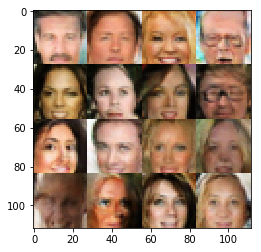

Epoch 6/10... Discriminator Loss: 1.0464... Generator Loss: 1.0028
Epoch 6/10... Discriminator Loss: 1.1541... Generator Loss: 0.5857
Epoch 6/10... Discriminator Loss: 0.6809... Generator Loss: 1.3737
Epoch 6/10... Discriminator Loss: 0.6985... Generator Loss: 1.0160
Epoch 6/10... Discriminator Loss: 0.9171... Generator Loss: 0.8094
Epoch 6/10... Discriminator Loss: 0.7874... Generator Loss: 1.3609
Epoch 6/10... Discriminator Loss: 1.5534... Generator Loss: 1.1705
Epoch 6/10... Discriminator Loss: 1.2249... Generator Loss: 0.4665
Epoch 6/10... Discriminator Loss: 1.0089... Generator Loss: 1.2866
Epoch 6/10... Discriminator Loss: 0.9669... Generator Loss: 0.8774


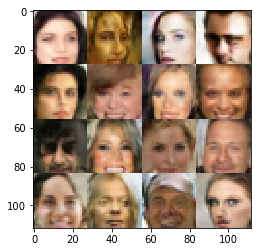

Epoch 6/10... Discriminator Loss: 0.8526... Generator Loss: 0.7919
Epoch 6/10... Discriminator Loss: 0.8853... Generator Loss: 1.0071
Epoch 6/10... Discriminator Loss: 0.8661... Generator Loss: 0.8476
Epoch 6/10... Discriminator Loss: 1.5357... Generator Loss: 0.3547
Epoch 6/10... Discriminator Loss: 0.9691... Generator Loss: 0.8355
Epoch 6/10... Discriminator Loss: 0.8173... Generator Loss: 1.0551
Epoch 6/10... Discriminator Loss: 0.8462... Generator Loss: 1.0332
Epoch 6/10... Discriminator Loss: 1.1575... Generator Loss: 0.5472
Epoch 6/10... Discriminator Loss: 0.9418... Generator Loss: 0.7724
Epoch 6/10... Discriminator Loss: 0.9873... Generator Loss: 0.7277


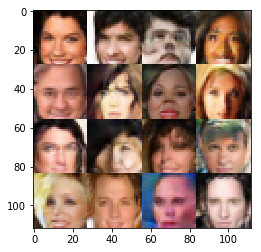

Epoch 6/10... Discriminator Loss: 0.8721... Generator Loss: 0.7844
Epoch 6/10... Discriminator Loss: 1.3440... Generator Loss: 0.3973
Epoch 6/10... Discriminator Loss: 1.0721... Generator Loss: 0.8835
Epoch 6/10... Discriminator Loss: 0.9022... Generator Loss: 0.8643
Epoch 6/10... Discriminator Loss: 1.2895... Generator Loss: 0.7657
Epoch 6/10... Discriminator Loss: 0.6618... Generator Loss: 1.2281
Epoch 6/10... Discriminator Loss: 0.8930... Generator Loss: 1.0279
Epoch 6/10... Discriminator Loss: 0.8195... Generator Loss: 1.0738
Epoch 6/10... Discriminator Loss: 0.6952... Generator Loss: 1.2716
Epoch 6/10... Discriminator Loss: 0.7466... Generator Loss: 1.4936


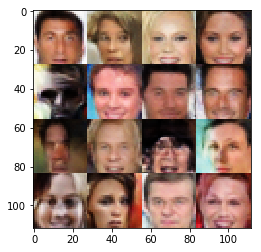

Epoch 6/10... Discriminator Loss: 0.7672... Generator Loss: 1.4899
Epoch 6/10... Discriminator Loss: 1.1061... Generator Loss: 0.6000
Epoch 6/10... Discriminator Loss: 0.7591... Generator Loss: 0.9696
Epoch 6/10... Discriminator Loss: 0.8994... Generator Loss: 0.9351
Epoch 6/10... Discriminator Loss: 1.0808... Generator Loss: 0.5936
Epoch 6/10... Discriminator Loss: 0.7710... Generator Loss: 0.9181
Epoch 6/10... Discriminator Loss: 0.9650... Generator Loss: 0.9226
Epoch 6/10... Discriminator Loss: 0.7329... Generator Loss: 1.1827
Epoch 6/10... Discriminator Loss: 0.7990... Generator Loss: 1.0393
Epoch 6/10... Discriminator Loss: 1.0252... Generator Loss: 0.7347


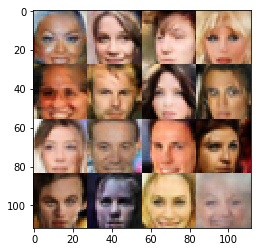

Epoch 6/10... Discriminator Loss: 1.0358... Generator Loss: 0.6988
Epoch 6/10... Discriminator Loss: 1.3107... Generator Loss: 0.4323
Epoch 6/10... Discriminator Loss: 0.7816... Generator Loss: 1.4045
Epoch 6/10... Discriminator Loss: 1.6129... Generator Loss: 0.2987
Epoch 6/10... Discriminator Loss: 1.1093... Generator Loss: 0.5558
Epoch 6/10... Discriminator Loss: 0.7088... Generator Loss: 1.0795
Epoch 6/10... Discriminator Loss: 0.7537... Generator Loss: 0.8923
Epoch 6/10... Discriminator Loss: 0.8659... Generator Loss: 0.7869
Epoch 6/10... Discriminator Loss: 1.2535... Generator Loss: 0.4899
Epoch 6/10... Discriminator Loss: 0.6451... Generator Loss: 1.1526


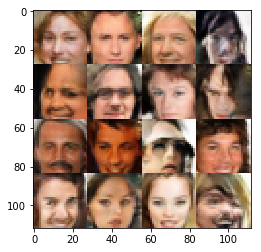

Epoch 6/10... Discriminator Loss: 0.8142... Generator Loss: 0.8406
Epoch 6/10... Discriminator Loss: 0.8112... Generator Loss: 1.2750
Epoch 6/10... Discriminator Loss: 1.0533... Generator Loss: 0.5345
Epoch 6/10... Discriminator Loss: 1.1535... Generator Loss: 0.5304
Epoch 6/10... Discriminator Loss: 1.0831... Generator Loss: 0.9488
Epoch 6/10... Discriminator Loss: 0.8750... Generator Loss: 0.8794
Epoch 6/10... Discriminator Loss: 1.0450... Generator Loss: 0.5800
Epoch 6/10... Discriminator Loss: 1.0366... Generator Loss: 1.5329
Epoch 6/10... Discriminator Loss: 0.7385... Generator Loss: 1.8718
Epoch 6/10... Discriminator Loss: 1.3373... Generator Loss: 0.4981


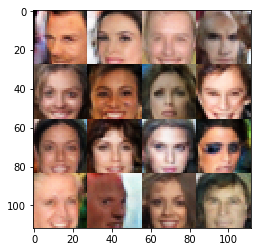

Epoch 6/10... Discriminator Loss: 0.8800... Generator Loss: 0.7599
Epoch 6/10... Discriminator Loss: 1.1741... Generator Loss: 0.5210
Epoch 6/10... Discriminator Loss: 0.6952... Generator Loss: 1.6820
Epoch 6/10... Discriminator Loss: 0.8362... Generator Loss: 1.2017
Epoch 6/10... Discriminator Loss: 0.9116... Generator Loss: 0.8513
Epoch 6/10... Discriminator Loss: 1.1505... Generator Loss: 0.6164
Epoch 6/10... Discriminator Loss: 1.0614... Generator Loss: 0.6112
Epoch 6/10... Discriminator Loss: 1.6079... Generator Loss: 0.3173
Epoch 6/10... Discriminator Loss: 0.9538... Generator Loss: 0.7149
Epoch 6/10... Discriminator Loss: 0.8390... Generator Loss: 1.0216


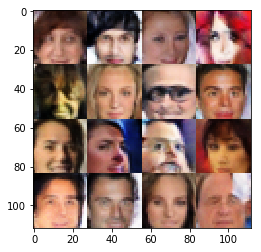

Epoch 6/10... Discriminator Loss: 1.3114... Generator Loss: 0.4489
Epoch 6/10... Discriminator Loss: 1.0385... Generator Loss: 0.6050
Epoch 6/10... Discriminator Loss: 0.7602... Generator Loss: 1.6695
Epoch 6/10... Discriminator Loss: 0.8146... Generator Loss: 0.8224
Epoch 6/10... Discriminator Loss: 0.8084... Generator Loss: 1.0666
Epoch 6/10... Discriminator Loss: 0.8863... Generator Loss: 1.1377
Epoch 6/10... Discriminator Loss: 0.9779... Generator Loss: 1.1054
Epoch 6/10... Discriminator Loss: 1.2757... Generator Loss: 0.4446
Epoch 6/10... Discriminator Loss: 0.5930... Generator Loss: 1.2706
Epoch 6/10... Discriminator Loss: 0.7743... Generator Loss: 1.0828


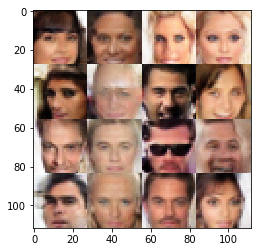

Epoch 6/10... Discriminator Loss: 0.8783... Generator Loss: 0.8172
Epoch 6/10... Discriminator Loss: 1.0265... Generator Loss: 0.6836
Epoch 6/10... Discriminator Loss: 0.8086... Generator Loss: 1.1473
Epoch 6/10... Discriminator Loss: 0.6899... Generator Loss: 0.9780
Epoch 6/10... Discriminator Loss: 1.0930... Generator Loss: 0.6861
Epoch 6/10... Discriminator Loss: 1.4836... Generator Loss: 0.3368
Epoch 6/10... Discriminator Loss: 1.2882... Generator Loss: 0.4479
Epoch 6/10... Discriminator Loss: 1.1997... Generator Loss: 0.5069
Epoch 6/10... Discriminator Loss: 0.9538... Generator Loss: 0.8137
Epoch 6/10... Discriminator Loss: 0.9448... Generator Loss: 0.6747


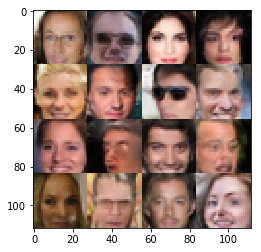

Epoch 6/10... Discriminator Loss: 1.0237... Generator Loss: 0.7410
Epoch 6/10... Discriminator Loss: 0.9199... Generator Loss: 0.7989
Epoch 6/10... Discriminator Loss: 1.0994... Generator Loss: 0.6310
Epoch 6/10... Discriminator Loss: 0.9958... Generator Loss: 0.8520
Epoch 6/10... Discriminator Loss: 0.9646... Generator Loss: 0.6485
Epoch 6/10... Discriminator Loss: 0.8398... Generator Loss: 0.8485
Epoch 6/10... Discriminator Loss: 1.2573... Generator Loss: 0.4752
Epoch 6/10... Discriminator Loss: 1.5220... Generator Loss: 0.3440
Epoch 6/10... Discriminator Loss: 0.8563... Generator Loss: 1.2189
Epoch 6/10... Discriminator Loss: 0.7890... Generator Loss: 1.0417


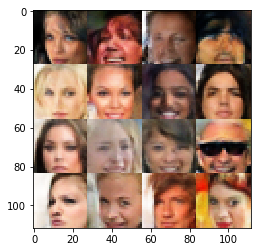

Epoch 6/10... Discriminator Loss: 1.0351... Generator Loss: 0.6851
Epoch 6/10... Discriminator Loss: 0.8775... Generator Loss: 0.8016
Epoch 6/10... Discriminator Loss: 0.7524... Generator Loss: 1.1151
Epoch 6/10... Discriminator Loss: 0.7849... Generator Loss: 1.7748


In [ ]:
batch_size = 64
z_dim = 100
learning_rate = 0.0002
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 10

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.